# Setup

## Install Pytorch-Geometric and other necessary packages

In [1]:
import torch

def format_pytorch_version(version):
  return version.split('+')[0]

TORCH_version = torch.__version__
TORCH = format_pytorch_version(TORCH_version)

def format_cuda_version(version):
  return 'cu' + version.replace('.', '')

CUDA_version = torch.version.cuda
CUDA = format_cuda_version(CUDA_version)
!pip install torch-scatter -qf https://data.pyg.org/whl/torch-{TORCH}+{CUDA}.html
!pip install torch-sparse -qf https://data.pyg.org/whl/torch-{TORCH}+{CUDA}.html
!pip install torch-cluster -qf https://data.pyg.org/whl/torch-{TORCH}+{CUDA}.html
!pip install torch-spline-conv -qf https://data.pyg.org/whl/torch-{TORCH}+{CUDA}.html
!pip install torch-geometric -q
!pip install torcheval

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 37.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 46.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 947.1/947.1 kB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.2/179.2 kB 5.0 MB/s eta 0:00:00


## Import Python packages

In [2]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_validate, train_test_split
import sklearn.metrics as sklm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import ToTensor, v2
import torchvision.transforms.v2.functional as TF
from torchvision.models import resnet50, ResNet50_Weights, resnet18, ResNet18_Weights
from torcheval.metrics import R2Score
from torch_geometric.data import Data, Dataset
from torch_geometric.loader import (
  ClusterData, DataLoader, RandomNodeLoader, NeighborLoader, ClusterLoader
)
from torch_geometric.utils import to_networkx, to_undirected
from torch_geometric.nn import (
  MessagePassing, GCNConv, SAGEConv, EdgeConv,
)
from tqdm import tqdm
from glob import glob
from pathlib import Path
from copy import deepcopy
from IPython.display import clear_output

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

## Install LaTeX to function in Matplotlib

In [3]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
!apt install texlive-fonts-recommended texlive-fonts-extra cm-super dvipng

params = {'text.usetex' : True,
          'font.family' : 'serif',
          'font.serif' : 'Times'
          }
plt.rcParams.update(params)

# sns.set(rc=params)
# sns.set_style('white')

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  cm-super-minimal dvisvgm fonts-adf-accanthis fonts-adf-berenis fonts-adf-gillius
  fonts-adf-universalis fonts-cabin fonts-cantarell fonts-comfortaa fonts-croscore
  fonts-crosextra-caladea fonts-crosextra-carlito fonts-dejavu-core fonts-dejavu-extra
  fonts-droid-fallback fonts-ebgaramond fonts-ebgaramond-extra fonts-font-awesome
  fonts-freefont-otf fonts-freefont-ttf fonts-gfs-artemisia fonts-gfs-complutum fonts-gfs-didot
  fonts-gfs-neohellenic fonts-gfs-olga fonts-gfs-solomos fonts-go fonts-junicode fonts-lato
  fonts-linuxlibertine fonts-lmodern fonts-lobster fonts-lobstertwo fonts-noto-color-emoji
  fonts-noto-core fonts-noto-mono fonts-oflb-asana-math fonts-open-sans fonts-roboto-unhinted
  fonts-sil-charis fonts-sil-gentium fonts-sil-gentium-basic fonts-sil-gentiumplus
  fonts-sil-gentiumplus-compact fonts-stix fonts-texgyre fo

## Download TNG50 simulation data

In [4]:
!wget -q -O subhalos.parquet https://www.dropbox.com/scl/fi/ec6k1d39b0i91g6wjse1r/subhalos_with_morphologies.parquet?rlkey=rrebkismwk33630xqrtnpxdqs&e=1&dl=1
!wget -q -O tng50_gri_cutouts.tar.gz https://www.dropbox.com/scl/fi/rkeij9qyxes3w95h0hgq5/tng50_gri_cutouts.tar.gz?rlkey=x1pdauidj2f8n6g8ayx8tfp3n&e=2&dl=1
!tar xzf tng50_gri_cutouts.tar.gz

# Data Exploration

## Preprocess data

### Read data from parquet

In [5]:
subhalos = pd.read_parquet("subhalos.parquet")

# Rename columns
subhalo_colname_mapping = {
    c: c[8:]
    for c in subhalos.columns
    if (c.startswith("subhalo_") and c != "subhalo_id")
}
subhalos.rename(subhalo_colname_mapping, axis=1, inplace=True)

# Remove "bad" images
print(subhalos.shape)
subhalos = subhalos[subhalos['flag'] == 0]

print(subhalos.shape)
subhalos.sample(5, random_state=42)

(1666, 34)
(1549, 34)


,halo_id,subhalo_id,x,y,z,vx,vy,vz,n_stellar_particles,is_central,...,intensity,deviation,r20,r50,r80,rhalf_ellip,rpetro_ellip,sersic_n,sersic_ellip,sersic_rhalf
329508,23,329508,10.930857,29.852062,32.545311,0.440247,3.382520,-0.790438,8337095.0,True,...,0.000000,0.009283,5.847128,19.946611,43.254242,38.100105,77.760841,3.680883,0.523168,43.691425
510585,162,510585,2.273760,6.853521,25.678272,-0.426146,-0.118521,0.810504,852987.0,True,...,0.186052,0.111751,6.248281,15.963167,31.766651,25.433489,51.408501,1.137998,0.734003,25.782135
634801,666,634801,14.618502,18.732130,5.566197,-0.235926,-1.167654,0.146248,89593.0,True,...,0.000000,0.044265,4.136753,8.052070,13.810154,11.208678,21.672039,0.781137,0.524980,10.862806
253881,12,253881,1.322037,8.996532,39.829155,0.458207,-0.963417,0.184514,65174.0,False,...,0.000000,0.013929,1.798051,3.636877,7.413430,4.423114,9.491678,2.869073,0.296050,5.099685
167400,5,167400,25.297348,51.665623,42.893848,-0.782679,-3.189996,1.536512,178739.0,False,...,0.092934,0.015543,7.258909,21.482212,35.183109,23.107658,49.383427,4.296668,0.176707,51.847420


In [6]:
subhalos.columns

Index(['halo_id', 'subhalo_id', 'x', 'y', 'z', 'vx', 'vy', 'vz',
       'n_stellar_particles', 'is_central', 'l_halo_tree', 'sublink',
       'logstellarmass', 'loghalomass', 'logvmax', 'logstellarhalfmassradius',
       'flag', 'flag_sersic', 'concentration', 'asymmetry', 'smoothness',
       'gini', 'm20', 'multimode', 'intensity', 'deviation', 'r20', 'r50',
       'r80', 'rhalf_ellip', 'rpetro_ellip', 'sersic_n', 'sersic_ellip',
       'sersic_rhalf'],
      dtype='object')

### Intersect with available images based on index values
Turns out that there are extra images (due to removed from flags).


In [7]:
img_list = np.asarray([int(Path(i).stem) for i in glob('./homogenized_data/*.npy')])
idx_list = subhalos.index.values.ravel()
print(f"Only in images: {np.setdiff1d(img_list, idx_list)}")
print(f"Only in dataframe: {np.setdiff1d(idx_list, img_list)}")

Only in images: [     3      4      5      6      7      9     10     13     14     15
     16     21     22     23     24     25     26     27     30     31
     32     33     34     35     36     38     39     41     42     43
     46     47     49     50     55     58     59     61     64     70
     71     74     76     82     87     92     94    100    108    115
    120    121    122    124    125    128    129    133    144    148
    152  63870  63871  63931  63945  96769  96772  96779  96783 117261
 117308 117310 117319 117324 143883 143885 143902 143919 143922 167398
 167408 167437 184937 184939 184943 198183 220613 229934 229937 229938
 229961 242788 253885 275560 282780 289388 294867 294870 300907 300911
 300915 300917 307495 307498 319736 324125 338453 342453 345873 355730
 355735 362994 366407 379803 386273 394623 413372 416713 419618 425724
 430873 432112 445626 446665 447914 459558 470346 482889 494013 495451
 496186 499021 499022 504559 506151 507784 514273 516760 5245

### Generate overdensity estimation

In [8]:
locs = subhalos[['subhalo_id', 'x','y','z']]
merged = locs.assign(key=1).merge(locs.assign(key=1), on='key', suffixes=('_i', '_j'))
merged['dist'] = ((merged['x_i'] - merged['x_j'])**2 + (merged['y_i'] - merged['y_j'])**2 + (merged['z_i'] - merged['z_j'])**2)**(1/2)
merged = merged[merged['dist'] < 3] # D_link
m_gb = merged.groupby(by='subhalo_id_i') \
             .count() \
             .rename(columns={
                 'dist': 'overdensity'
              })
print(m_gb.head())
subhalos = pd.merge(subhalos, m_gb[['overdensity']], left_on='subhalo_id', right_index=True)
subhalos['overdensity'].describe()

              x_i  y_i  z_i  key  subhalo_id_j  x_j  y_j  z_j  overdensity
subhalo_id_i                                                              
0              34   34   34   34            34   34   34   34           34
1              34   34   34   34            34   34   34   34           34
2              33   33   33   33            33   33   33   33           33
8              34   34   34   34            34   34   34   34           34
11             35   35   35   35            35   35   35   35           35


count    1549.000000
mean       11.148483
std        11.846942
min         1.000000
25%         3.000000
50%         6.000000
75%        14.000000
max        49.000000
Name: overdensity, dtype: float64

### View basic statistics of data

In [9]:
print(subhalos[subhalos['is_central']].count()[0])
subhalos[['halo_id', 'subhalo_id', 'logstellarmass', 'loghalomass']].describe()

986


,halo_id,subhalo_id,logstellarmass,loghalomass
count,1549.000000,1549.000000,1549.000000,1549.000000
mean,381.271788,480169.843125,10.152490,11.373174
std,395.188118,191690.561583,0.519033,0.626619
min,0.000000,0.000000,9.500206,8.790671
25%,32.000000,360925.000000,9.749175,11.108928
50%,260.000000,553231.000000,10.028093,11.366620
75%,647.000000,632310.000000,10.437785,11.692455
max,4158.000000,799553.000000,12.735348,14.224563


In [10]:
subhalos.columns

Index(['halo_id', 'subhalo_id', 'x', 'y', 'z', 'vx', 'vy', 'vz',
       'n_stellar_particles', 'is_central', 'l_halo_tree', 'sublink',
       'logstellarmass', 'loghalomass', 'logvmax', 'logstellarhalfmassradius',
       'flag', 'flag_sersic', 'concentration', 'asymmetry', 'smoothness',
       'gini', 'm20', 'multimode', 'intensity', 'deviation', 'r20', 'r50',
       'r80', 'rhalf_ellip', 'rpetro_ellip', 'sersic_n', 'sersic_ellip',
       'sersic_rhalf', 'overdensity'],
      dtype='object')

## Visualize data

### Basic data

- `halo_id`: id of dark matter halo
- `subhalo_id`: id of subhalo (the actual unique key)
- `x`, `y`, `z`: coordinates of galaxy
- `vx`, `vy`, `vz`: velocity of center of mass
- `n_stellar_particles`: number of stellar particles scaled
- `is_central`: boolean to indicate whether it is a central galaxy or not
- `logstellarmass`: log of the stellar mass in subhalo
- `loghalomass`: log of subhalo mass
- `logvmax`: log of max velocity in galaxy, computed from halo mass
- `logstellarhalfmassradius`: Basic morphological feature, logarithm of radius that contains half the stellar mass of the galaxy

In [12]:
subhalos[['halo_id', 'subhalo_id', 'x', 'y', 'z', 'vx', 'vy', 'vz', 'n_stellar_particles', 'is_central', 'logstellarmass', 'loghalomass', 'logvmax', 'logstellarhalfmassradius']].describe()

,halo_id,subhalo_id,x,y,z,vx,vy,vz,n_stellar_particles,logstellarmass,loghalomass,logvmax,logstellarhalfmassradius
count,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1.549000e+03,1549.000000,1549.000000,1549.000000,1549.000000
mean,381.271788,480169.843125,25.518913,25.349433,24.763720,0.003266,-0.022411,-0.035297,7.140515e+05,10.152490,11.373174,0.187096,-0.466794
std,395.188118,191690.561583,14.496762,14.389903,14.927715,1.811071,2.018070,1.969395,3.013205e+06,0.519033,0.626619,0.168479,0.284197
min,0.000000,0.000000,0.000658,0.067325,0.022999,-11.813502,-11.017087,-11.655632,5.154700e+04,9.500206,8.790671,-0.114082,-1.309549
25%,32.000000,360925.000000,12.275981,11.305053,9.952353,-0.881069,-0.975658,-0.943777,9.464400e+04,9.749175,11.108928,0.062729,-0.654272
50%,260.000000,553231.000000,26.576410,27.347174,25.129480,-0.033848,-0.072989,0.034458,1.799160e+05,10.028093,11.366620,0.140464,-0.450077
75%,647.000000,632310.000000,36.282681,36.913925,37.312206,0.874986,0.911199,1.006135,4.633780e+05,10.437785,11.692455,0.270408,-0.256049
max,4158.000000,799553.000000,51.663567,51.665623,51.668003,9.551082,14.937226,10.931951,9.421184e+07,12.735348,14.224563,1.038808,0.563498


#### Let's also take a look at the **3d distribution of galaxies/subhalos**:

Size is proportional to `loghalomass`, and color is proportional to `logstellarmass`.

/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


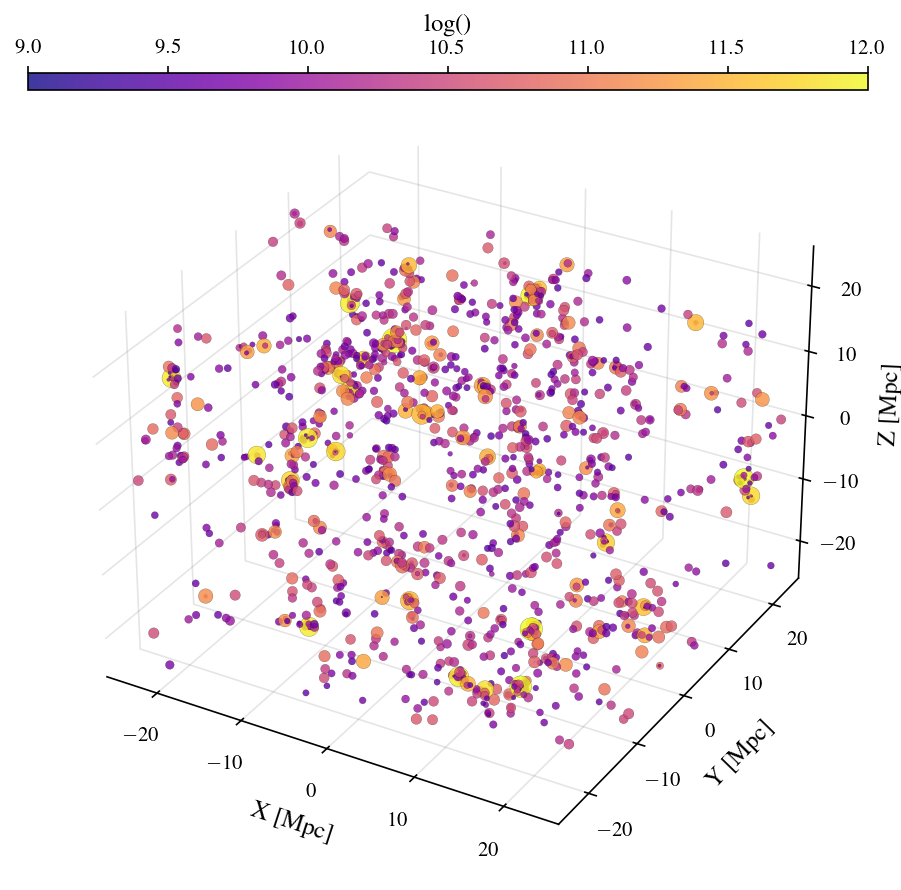

In [13]:
fig = plt.figure(figsize=(7, 8), dpi=150)
ax = fig.add_subplot(projection="3d")

# Get a subset close to the origin for visualizations
df = subhalos[(subhalos.x < 50) & (subhalos.y < 50) & (subhalos.z < 50)].copy()

fontsize = 12
pos = df[["x", "y", "z"]] - 25

# plot nodes
sc = ax.scatter(
    pos.x,
    pos.y,
    pos.z,
    s=(df.loghalomass-9)**3,
    vmin=9,
    vmax=12,
    alpha=0.8,
    edgecolor='k',
    c=df.logstellarmass,
    cmap="plasma",
    linewidths=0.1
)
fig.subplots_adjust(left=0.1, right=0.9)

cb = fig.colorbar(sc, aspect=50, pad=-0.02, location='top')
cb.set_label(r"log()", fontsize=12)

ax.set_xlim(-25, 25)
ax.set_ylim(-25, 25)
ax.set_zlim(-25, 25)
ax.set_xlabel("X [Mpc]", fontsize=12)
ax.set_ylabel("Y [Mpc]", fontsize=12)
ax.set_zlabel("Z [Mpc]", fontsize=12)
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.xaxis._axinfo["grid"]['color'] =  (0.5,0.5,0.5,0.2)
ax.yaxis._axinfo["grid"]['color'] =  (0.5,0.5,0.5,0.2)
ax.zaxis._axinfo["grid"]['color'] =  (0.5,0.5,0.5,0.2)

#### Let's plot the stellar mass vs. the halo mass

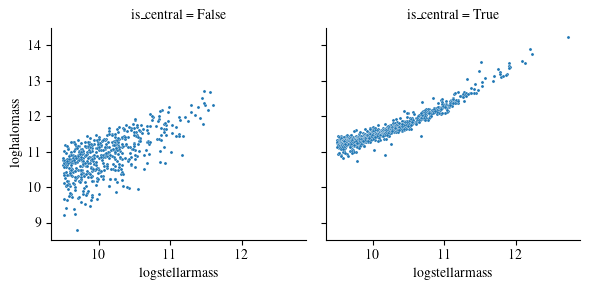

In [14]:
g = sns.FacetGrid(df, col="is_central")
g.map(sns.scatterplot, "logstellarmass", "loghalomass", s=5)

#### Trends

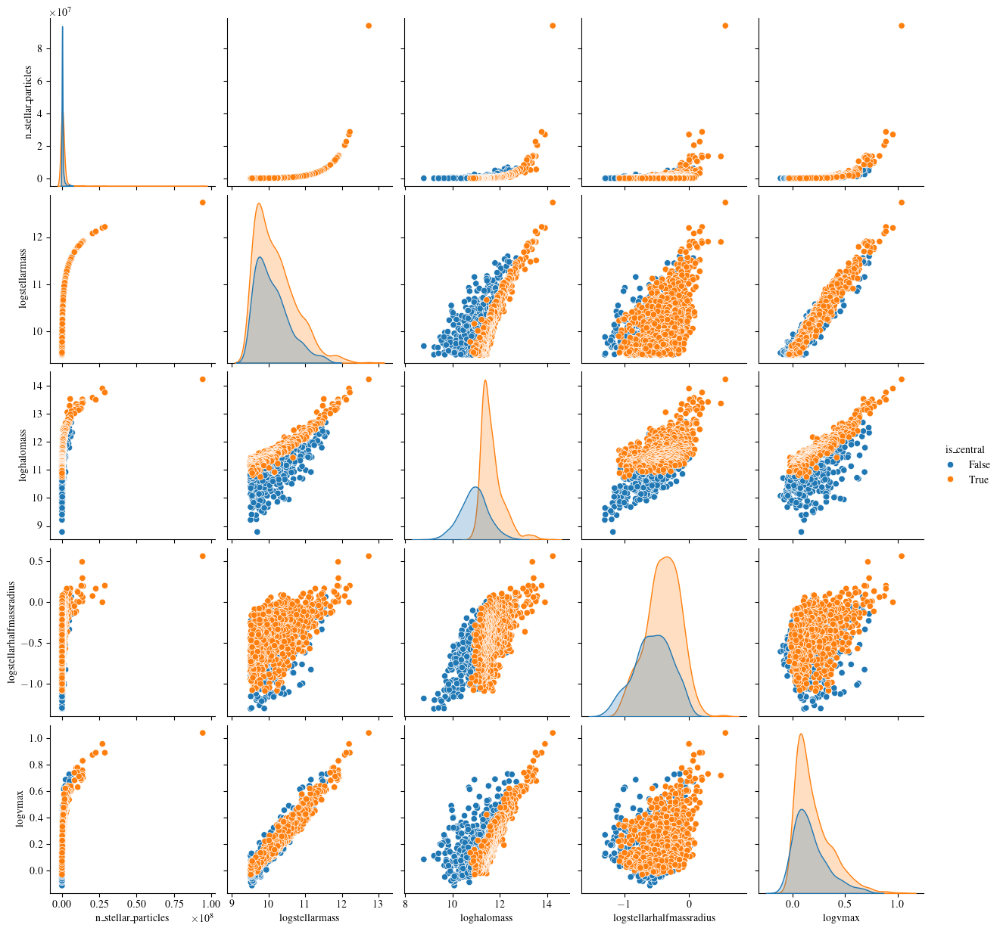

In [15]:
sns.pairplot(df[["n_stellar_particles", "logstellarmass", "loghalomass", "logstellarhalfmassradius", "logvmax", "is_central"]], hue="is_central")

                          n_stellar_particles  logstellarmass  loghalomass  \
n_stellar_particles                  1.000000        0.499665     0.427819   
logstellarmass                       0.499665        1.000000     0.729033   
loghalomass                          0.427819        0.729033     1.000000   
logstellarhalfmassradius             0.290295        0.491492     0.622860   
logvmax                              0.504890        0.960914     0.685547   
is_central                           0.069055        0.085701     0.568664   

                          logstellarhalfmassradius   logvmax  is_central  
n_stellar_particles                       0.290295  0.504890    0.069055  
logstellarmass                            0.491492  0.960914    0.085701  
loghalomass                               0.622860  0.685547    0.568664  
logstellarhalfmassradius                  1.000000  0.316988    0.264834  
logvmax                                   0.316988  1.000000    0.087773  
is_

<Axes: >

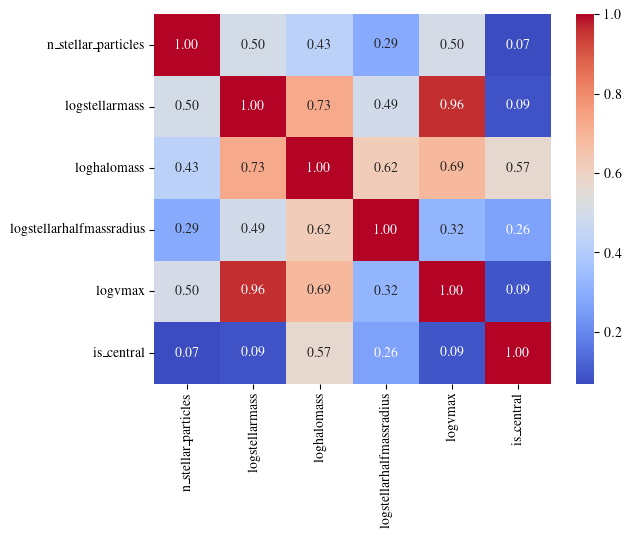

In [16]:
correlation_matrix = df[["n_stellar_particles", "logstellarmass", "loghalomass", "logstellarhalfmassradius", "logvmax", "is_central"]].corr()
print(correlation_matrix)

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

### Morphological Features

#### Descriptions

- `l_halo_tree`:
- `sublink`:
- `flag`: Indicates that it is a "good measurement".
- `flag_sersic`: Indicates that Sersic derived statistics is a "good".
- `concentration`: The concentration index is calculated as the ratio of the radii, defined as `concentration = 5*log10(r80/r20)`. Galaxies with high concentration indices (C) have a compact, centrally concentrated light or mass distribution. These galaxies are often referred to as "compact" or "concentrated" galaxies. Galaxies with low concentration indices have a more extended, diffuse distribution of light or mass. These galaxies are often referred to as "extended" or "diffuse" galaxies. Spiral galaxies, for example, typically have lower concentration indices, as their light is distributed across spiral arms and a central bulge. Elliptical galaxies, on the other hand, often have higher concentration indices due to their more centrally concentrated light distribution. Concentration is also used in studies of galaxy evolution to track changes in the structure and morphology of galaxies over cosmic time. For instance, mergers and interactions between galaxies can lead to an increase in concentration as material is funneled toward the central regions.
- `asymmetry`: obtained by subtracting the galaxy image rotated by 180◦ from the original image. Galaxies with high asymmetry indices have a more irregular or distorted appearance, indicating asymmetrical features such as tidal tails, asymmetric spiral arms, or recent interactions or mergers. Galaxies with low asymmetry indices have a more symmetric appearance, suggesting a more dormant evolutionary history or a well-ordered morphology. It is often combined with other morphological parameters, such as concentration, clumpiness (e.g., measured by the Gini coefficient or M20 statistic), and smoothness, to provide a comprehensive characterization of galaxy morphology and dynamics.
- `smoothness`: The ‘clumpiness’ or smoothness index (S) is obtained by subtracting the galaxy image smoothed with a boxcar filter of width σ = 0.25rpetro from the original image. Galaxies with low smoothness values have a relatively uniform appearance, with little variation in pixel intensity across the image. These galaxies are often referred to as "smooth" or "early-type" galaxies. Galaxies with high smoothness values exhibit significant fluctuations or irregularities in pixel intensity, indicating the presence of features such as spiral arms, bars, clumps, or irregular morphologies. These galaxies are often referred to as "clumpy" or "late-type" galaxies. Early-type galaxies, which tend to have low smoothness values, are often associated with older stellar populations and quiescent evolutionary histories, while late-type galaxies, with higher smoothness values, are more commonly associated with ongoing star formation and dynamical interactions.
- `gini`: a statistic traditionally used in economics to quantify the wealth inequality in a population. In astronomy, pixel flux values are used (brightness). A Gini coefficient close to 0 indicates a more uniform distribution of flux values across the image, implying that all pixels have similar brightness levels. A Gini coefficient close to 1 indicates a highly unequal distribution, where a few pixels have much higher flux values compared to the majority of pixels. This implies the presence of bright regions or structures within the galaxy image. Galaxies with higher Gini coefficients are typically more centrally concentrated or have prominent bright features such as bulges, spiral arms, or star-forming regions.
- `m20`: measures the second moment of a galaxy’s brightest regions, containing 20 per cent of the total flux, relative to the total second-order central moment. A higher M20 value indicates a greater concentration of the brightest regions within the galaxy image. Galaxies with high M20 values typically exhibit pronounced clumpiness, implying the presence of significant star-forming regions, mergers, or interactions. Lower M20 values are associated with galaxies that have a more uniform distribution of brightness or lack distinct bright regions. The M20 statistic is used as a morphological descriptor in galaxy classification schemes, particularly for distinguishing between different types of galaxies, such as irregular galaxies, spiral galaxies, and mergers.
- `multimode`: The multimode statistic (M) measures the ratio between the areas of the two most ‘prominent’ clumps within a galaxy. alaxies with high multimode statistic values exhibit a more complex or multi-component brightness distribution, with multiple distinct peaks or modes in the pixel intensity histogram. These galaxies may contain features such as multiple star-forming regions, tidal tails from recent interactions or mergers, or other asymmetrical structures. Galaxies with low multimode statistic values have a simpler, more uniform brightness distribution, with fewer prominent peaks or modes in the pixel intensity histogram.
- `intensity`: The intensity statistic (I) measures the ratio between the two bright- est subregions of a galaxy. To calculate it, the galaxy image is first slightly smoothed using a Gaussian kernel with σ = 1 pixel. Using the watershed algorithm, it is ultimately calculated as the ratio of the sum of the brightest pixel groups. A high intensity statistic indicates multiple formations of high brightness, and a low intensity statistic indicates a single intense location in the galaxy.
- `deviation`: The deviation statistic (D) measures the distance between the image centroid, (xc, yc), calculated for the pixels identified by the MID
segmentation map, and the brightest peak found during the computation of the I statistic, (x, y). It is then normalized by the approximate radius. A high deviation corresponds to a high distance between the centroid and the most intense point.
- `r20`, `r50`, `r80`: The radii of circular apertures containing 20, 50, and 80 per cent, respectively, of the galaxy’s light.
- `rhalf_ellip`: "Regular" ellipticity. e=0 corresponds with a completely circular half radius. As it approaches 1, the galaxy becomes more flat.
- `rpetro_ellip`: the radius at which the mean surface brightness is equal to some fraction η of the mean surface brightness within the petrosian radius.
- `sersic_n`: When n=1, the Sersic profile reduces to the exponential profile, which is characteristic of disk galaxies. When n>1, the profile becomes more concentrated toward the center, resembling the light distribution of elliptical galaxies and bulges. Higher values of n correspond to steeper central light profiles and more centrally concentrated objects.
- `sersic_ellip`: Sersic ellipticity. e=0 corresponds with a completely circular half radius. As ellipticy rises, the galaxy becomes more flat.
- `sersic_rhalf`: The Sersic half radius provides a measure of the spatial extent of the galaxy's light distribution. It represents the radius within which half of the galaxy's luminosity is concentrated. Galaxies with smaller Sersic half radii are more compact, with a higher concentration of light toward the center.

#### Basic statstics

In [17]:
subhalos[['l_halo_tree', 'sublink', 'flag', 'flag_sersic', 'concentration', 'asymmetry', 'smoothness',
       'gini', 'm20', 'multimode', 'intensity', 'deviation', 'r20', 'r50',
       'r80', 'rhalf_ellip', 'rpetro_ellip', 'sersic_n', 'sersic_ellip',
       'sersic_rhalf']].describe()

,l_halo_tree,sublink,flag,flag_sersic,concentration,asymmetry,smoothness,gini,m20,multimode,intensity,deviation,r20,r50,r80,rhalf_ellip,rpetro_ellip,sersic_n,sersic_ellip,sersic_rhalf
count,1.549000e+03,1.549000e+03,1549.0,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000,1549.000000
mean,7.092576e+05,7.558713e+05,0.0,0.022595,3.180757,0.132104,0.030894,0.501437,-1.851397,0.106974,0.138527,0.065402,5.288906,13.094267,23.633030,17.594313,36.587177,2.709810,0.421784,39.508888
std,3.674990e+05,3.044743e+05,0.0,0.148657,0.665300,0.105670,0.029731,0.065018,0.339952,0.185052,0.195608,0.076642,3.242829,8.542488,15.309440,11.581509,24.232901,4.870732,0.240978,135.671158
min,-1.000000e+00,0.000000e+00,0.0,0.000000,1.840730,-0.278510,-0.149521,0.317788,-3.287246,0.000000,0.000000,0.000567,1.161791,2.068519,3.246980,2.156559,4.254341,0.088729,-0.922427,0.504403
25%,4.675550e+05,5.677680e+05,0.0,0.000000,2.687763,0.050651,0.006838,0.457246,-2.064893,0.000444,0.000000,0.025650,2.841232,6.455656,12.369727,8.557274,18.659813,0.919811,0.239435,8.905972
50%,8.723430e+05,8.743120e+05,0.0,0.000000,3.062598,0.114412,0.025280,0.501096,-1.827956,0.028290,0.056790,0.049587,4.397707,11.055055,19.953371,14.824024,31.206774,1.842173,0.415114,16.590998
75%,9.976980e+05,9.981690e+05,0.0,0.000000,3.533341,0.192009,0.050692,0.549773,-1.653053,0.127807,0.208584,0.078752,6.809755,17.619196,31.224552,24.068659,48.364014,3.035578,0.607784,30.274092
max,1.182655e+06,1.372607e+06,0.0,1.000000,6.349205,0.715716,0.175311,0.674883,-0.856414,1.000000,0.999389,0.964113,19.670647,57.370228,106.900490,72.664032,158.460876,151.136795,0.906430,2642.735107


#### Plots of features

<Axes: ylabel='Count'>

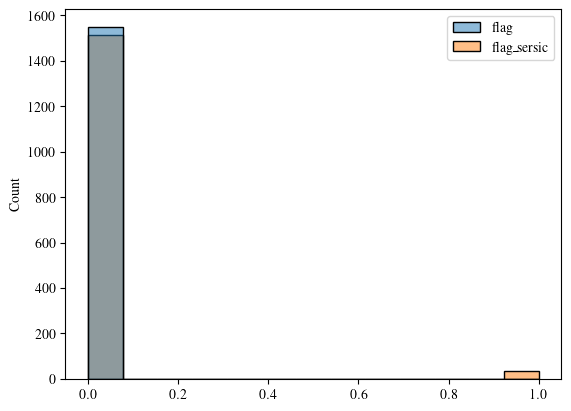

In [18]:
sns.histplot(subhalos[['flag', 'flag_sersic']])

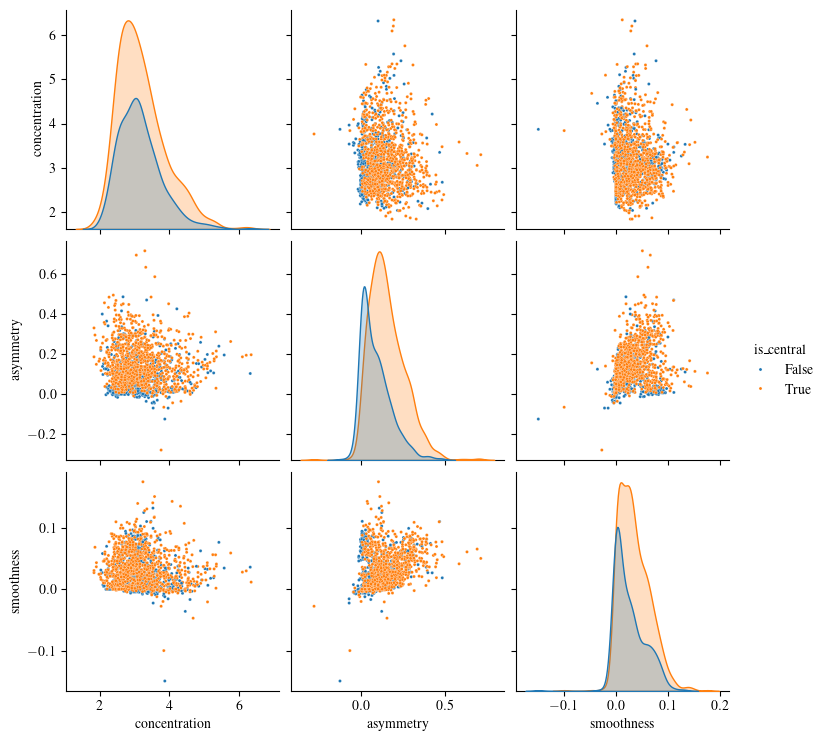

In [19]:
sns.pairplot(subhalos[['concentration', 'asymmetry', 'smoothness', 'is_central']],
             hue='is_central', plot_kws={'s': 5})

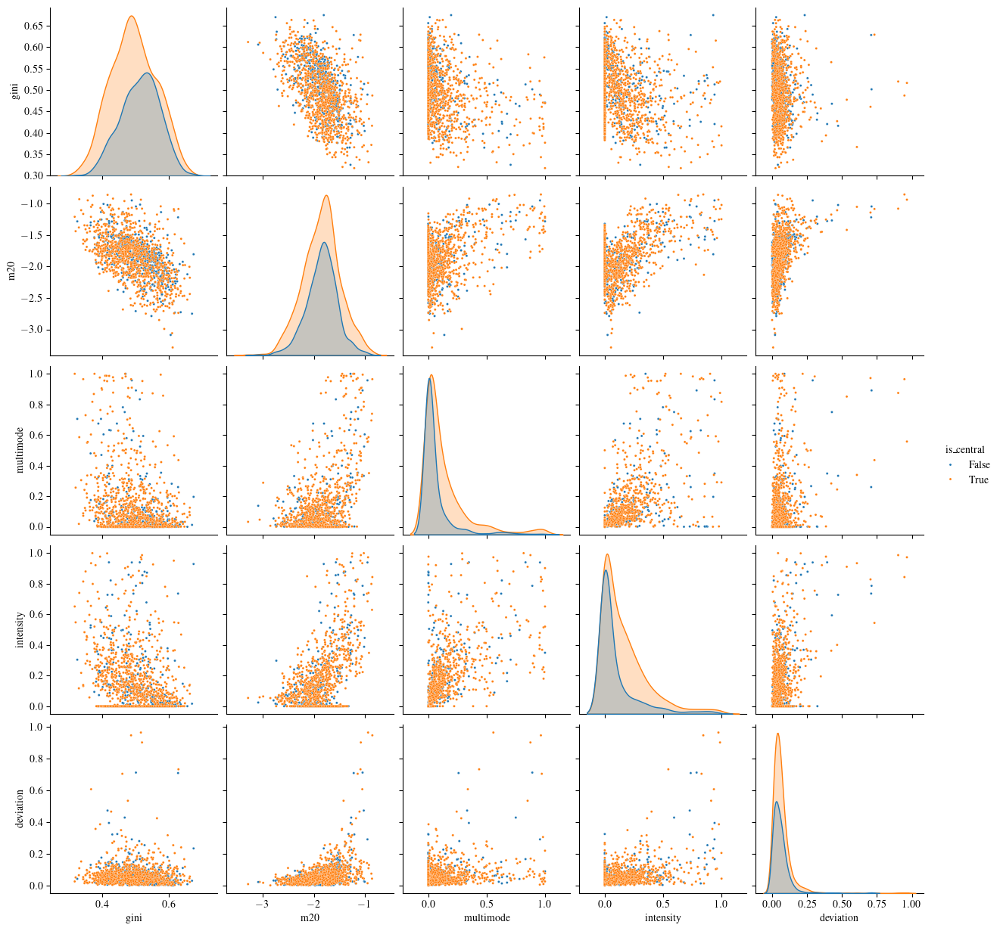

In [20]:
sns.pairplot(subhalos[['gini', 'm20', 'multimode', 'intensity', 'deviation', 'is_central']],
             hue='is_central', plot_kws={'s': 5})

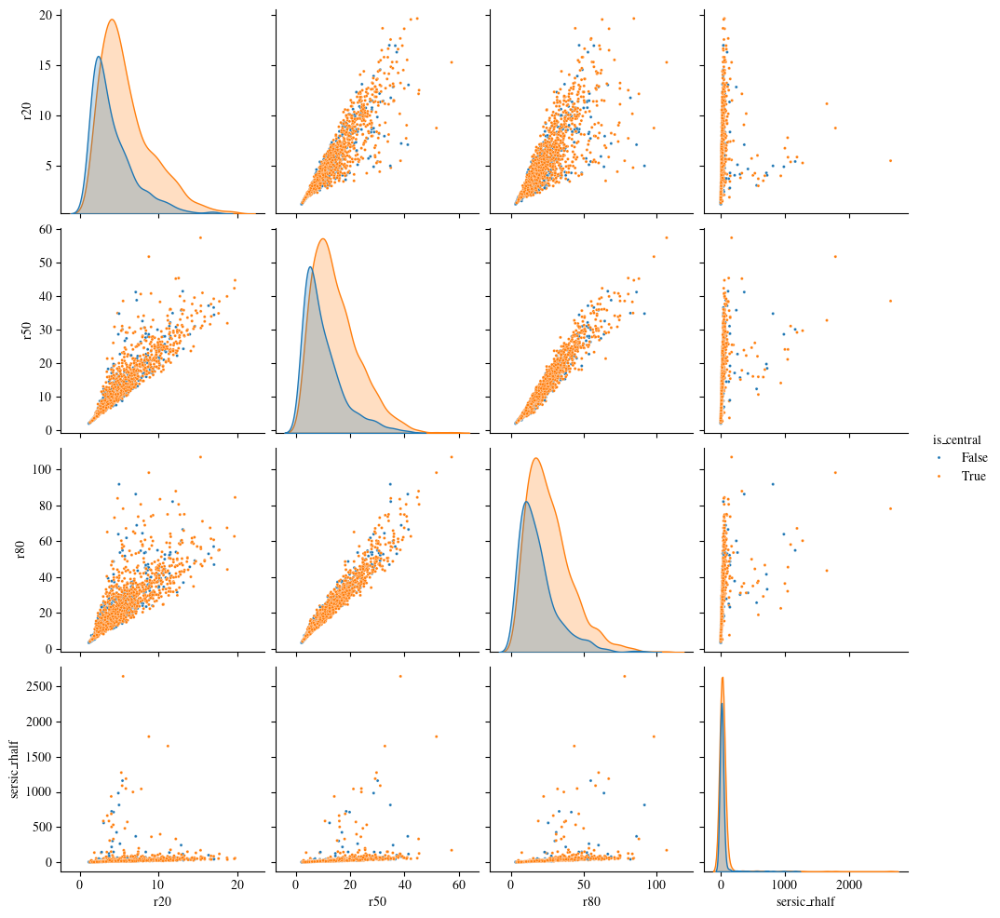

In [21]:
sns.pairplot(subhalos[['r20', 'r50', 'r80', 'sersic_rhalf', 'is_central']],
             hue='is_central', plot_kws={'s': 5})

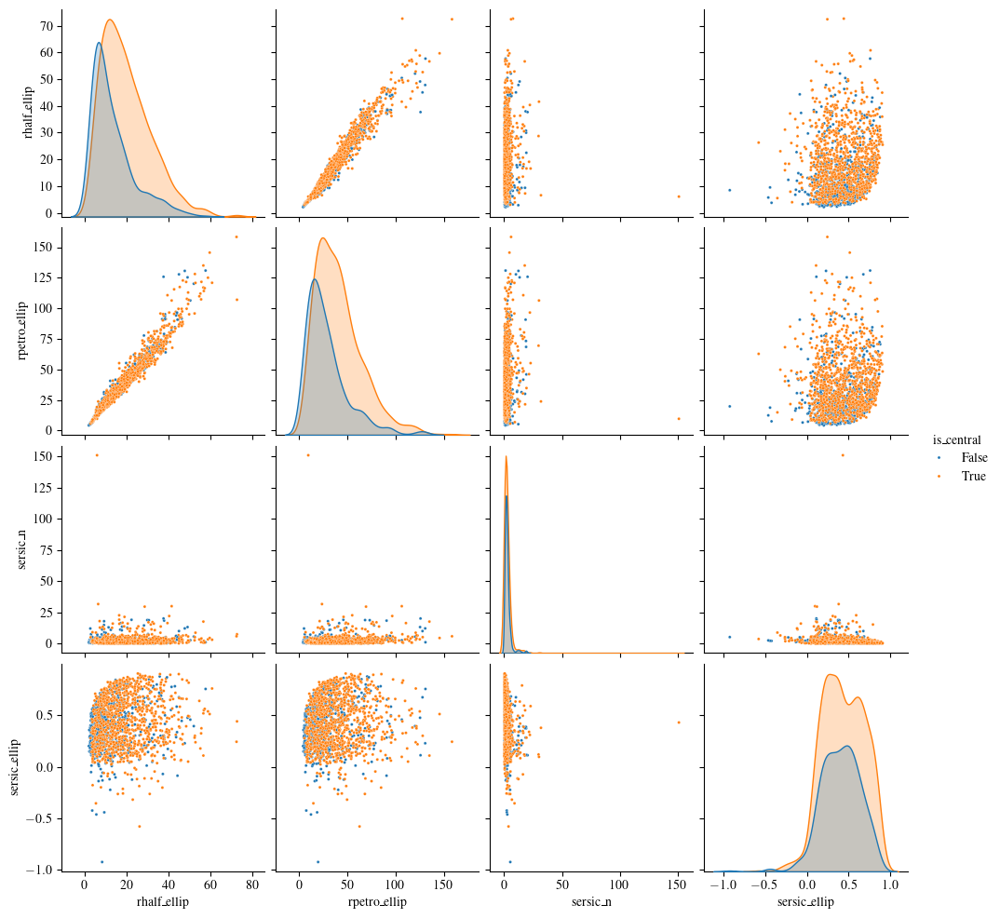

In [22]:
sns.pairplot(subhalos[['rhalf_ellip', 'rpetro_ellip', 'sersic_n', 'sersic_ellip', 'is_central']],
             hue='is_central', plot_kws={'s': 5})

### Visual data

Minimum in image: 0.00026362878270447254
Maximum in image: 18.00251007080078


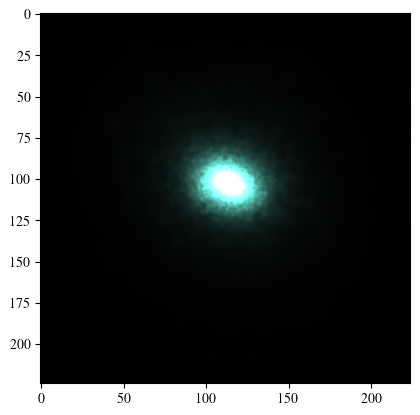

In [23]:
sample_image = np.load("./homogenized_data/2.npy")
scaled_image = sample_image / (sample_image.max()/30)
plt.imshow(scaled_image.transpose(1, 2, 0))
print(f"Minimum in image: {sample_image.min()}\nMaximum in image: {sample_image.max()}")

Minimum in images: 0.0
Maximum in image: 4239.67724609375


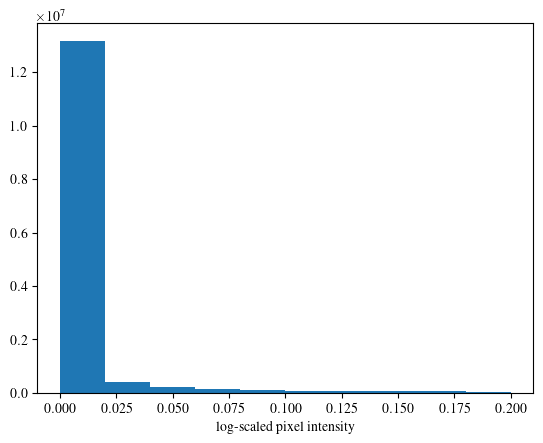

In [24]:
sample_images = np.asarray([np.load(f"./homogenized_data/{entry}.npy") for entry in subhalos.index[:100]])
scaled_images = np.log10(sample_images + 1)
plt.hist(scaled_images.ravel(), range=(0, .2))
plt.xlabel("log-scaled pixel intensity")
print(f"Minimum in images: {sample_images.min()}\nMaximum in image: {sample_images.max()}")

In [25]:
print(f"Number of big pixels: {(scaled_images > 1.5).sum()}")

Number of big pixels: 16587


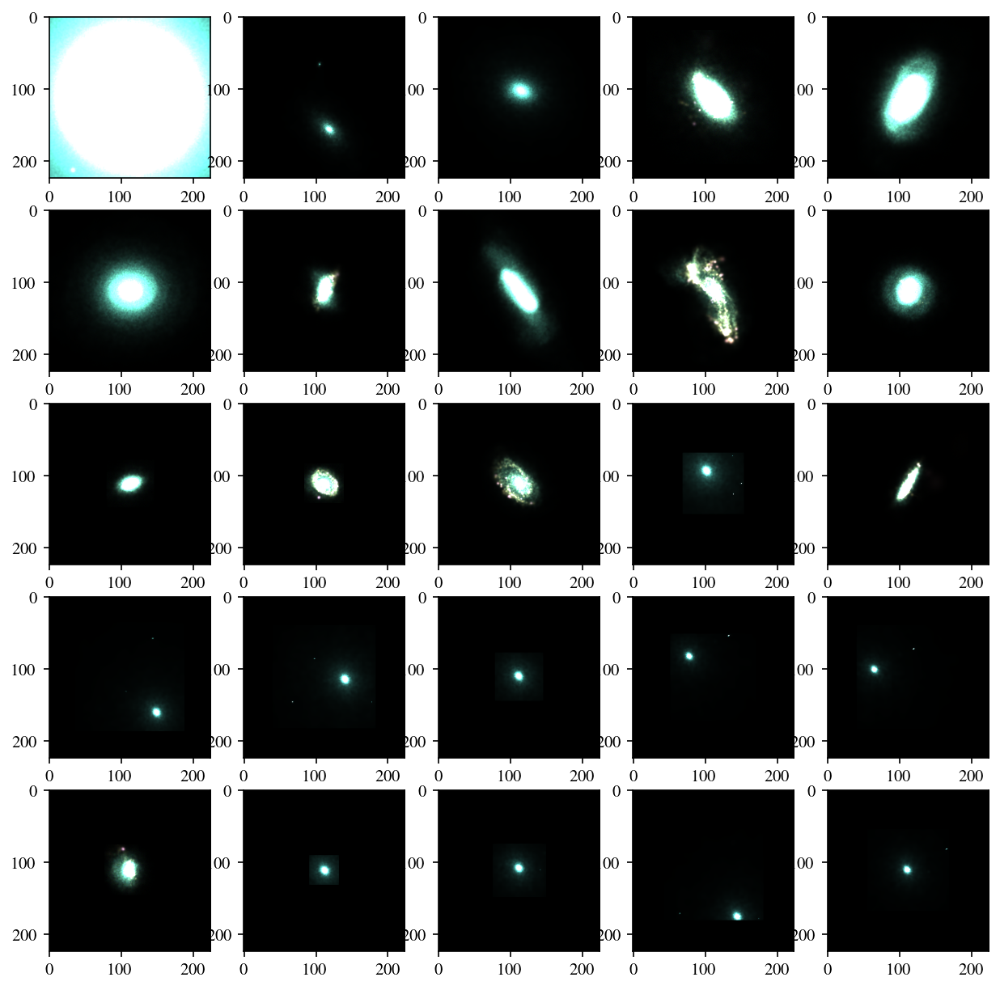

In [26]:
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(10, 10), dpi=150)
for i in range(25):
  entry = subhalos.iloc[i]
  img_path = Path('./homogenized_data') / (str(entry.name) + ".npy")
  img = np.load(img_path)
  axes[int(i / 5)][i % 5].imshow(img.transpose(1, 2, 0))

## Removing outliers
To determine which points to remove, we will make two histograms of log log of the stellar mass and halo mass. It should be linear, so I will emperically remove the outliers based of this.

Text(0, 0.5, 'logloghalomass')

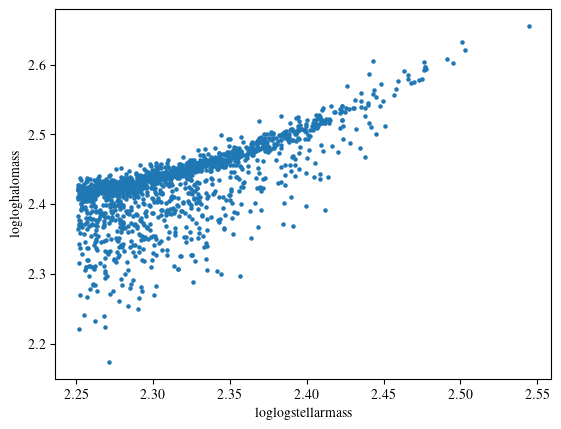

In [27]:
subhalos['logloghalomass'] = np.log(subhalos['loghalomass'])
subhalos['loglogstellarmass'] = np.log(subhalos['logstellarmass'])
plt.scatter(subhalos['loglogstellarmass'], subhalos['logloghalomass'], s=5)
plt.xlabel("loglogstellarmass")
plt.ylabel("logloghalomass")

In [28]:
print(subhalos[subhalos['logloghalomass'] < 2.2])
subhalos = subhalos[subhalos['logloghalomass'] > 2.2]

        halo_id  subhalo_id          x          y          z        vx  \
117306        3      117306  22.942953  43.289738  38.399487 -0.385316   

              vy        vz  n_stellar_particles  is_central  ...       r50  \
117306 -0.851202  1.050221              88143.0       False  ...  2.476566   

             r80  rhalf_ellip  rpetro_ellip  sersic_n  sersic_ellip  \
117306  3.981706     2.690296      5.511495  1.368615      0.217541   

        sersic_rhalf  overdensity  logloghalomass  loglogstellarmass  
117306      1.806294           46        2.173691           2.271369  

[1 rows x 37 columns]


# Model Training

## Divide train/valid/test split
70/10/20, in percent

### Option 1: Random(ish)

Not used in models due to data leak into training

In [ ]:
df_train, df_temp = train_test_split(subhalos, test_size=0.3, random_state=42)
df_valid, df_test = train_test_split(df_temp, test_size=0.66, random_state=42)

### Option 2: By proximity

In [29]:
# Assumes Dlink size <=3
train_mask = subhalos['x'] > 18.5
valid_mask = (subhalos['x'] < 12.5) & (subhalos['y'] < 19)
test_mask = (subhalos['x'] < 12.5) & (subhalos['y'] > 25)

df_train = subhalos[train_mask].copy()
df_valid = subhalos[valid_mask].copy()
df_test = subhalos[test_mask].copy()

### Results

Training: 1011
Validation: 112
Testing: 259
Excluded: 166


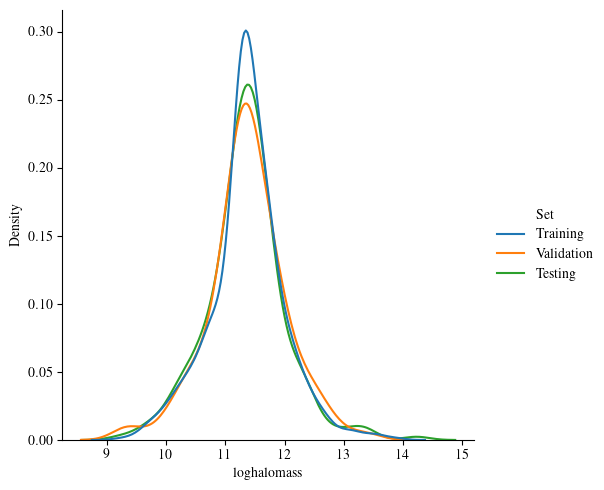

In [30]:
# Add a new column to indicate the split
df_train['Set'] = 'Training'
df_train['set_size'] = 1 / len(df_train)
df_valid['Set'] = 'Validation'
df_valid['set_size'] = 1 / len(df_valid)
df_test['Set'] = 'Testing'
df_test['set_size'] = 1 / len(df_test)

# Combine the DataFrames back into one
df_combined = pd.concat([df_train, df_valid, df_test], ignore_index=True)
sns.displot(df_combined, x='loghalomass', weights='set_size', hue='Set',kind='kde')

# Find excluded data points
df_excluded = subhalos[~subhalos['subhalo_id'].isin(df_combined['subhalo_id'])].copy()
df_excluded['Set'] = 'Excluded'
df_excluded['set_size'] = 1 / len(df_excluded)
df_combined = pd.concat([df_combined, df_excluded], ignore_index=True)

print(f"Training: {len(df_train)}\nValidation: {len(df_valid)}\nTesting: {len(df_test)}\nExcluded: {len(df_excluded)}")

In [31]:
plt.rcParams.update({'font.size' : 20})
fig = plt.figure(figsize=(8, 8), dpi=1000)
ax = fig.add_subplot()

types = ["Training", "Validation", "Testing"]
for type_name in types:
  density = scipy.stats.gaussian_kde(df_combined[df_combined['Set'] == type_name]['loghalomass'])
  x = np.linspace(9,13.5,500)
  density.covariance_factor = lambda : .25
  density._compute_covariance()

  ax.plot(x, density(x), linewidth=3)

ax.set_xlim(9, 13.5)
ax.set_ylim(0,1)
ax.set_xlabel(r"$\log\left(M_{halo} / M_\odot\right)$")
ax.set_ylabel("PDF")
ax.set_aspect(4.5)
ax.grid()
fig.tight_layout()
fig.savefig('data_kde.pdf', bbox_inches="tight")

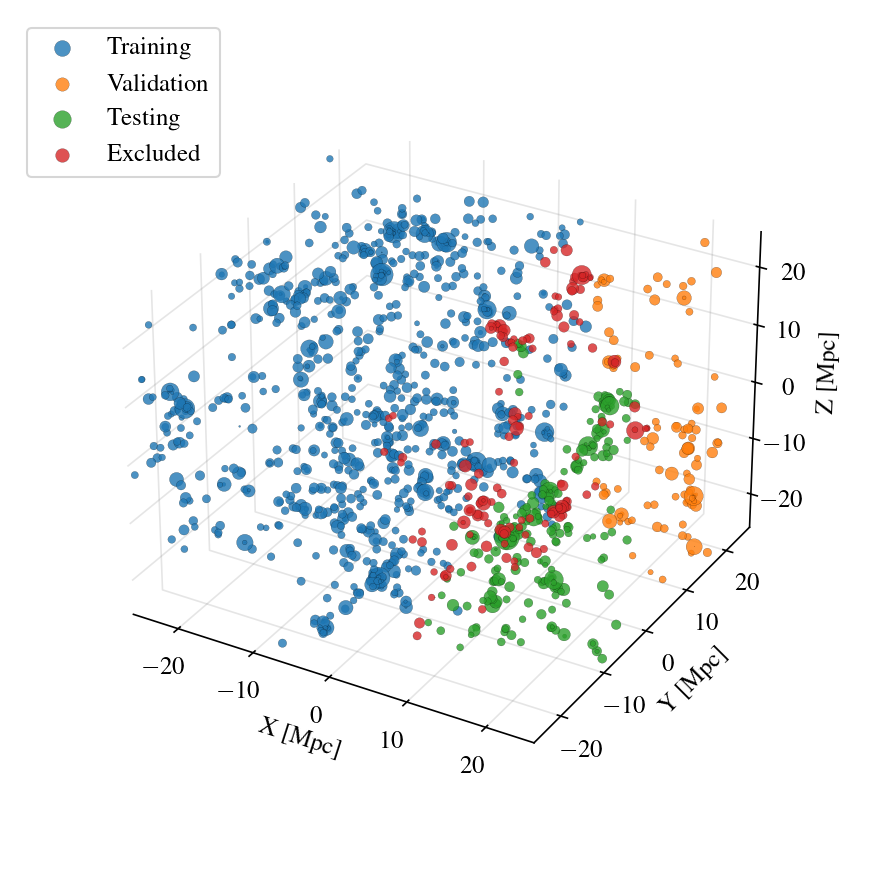

In [32]:
plt.rcParams.update({'font.size' : 12})
fig = plt.figure(figsize=(7, 8), dpi=150)
ax = fig.add_subplot(projection="3d")

# Get a subset close to the origin for visualizations
temp = df_combined.copy()

fontsize = 12
temp[["x", "y", "z"]] = -1 * temp[["x", "y", "z"]] + 25

types = ["Training", "Validation", "Testing", "Excluded"]

# plot nodes
for split_type in types:
  data = temp[temp['Set'] == split_type]
  sc = ax.scatter(
      data.x,
      data.y,
      data.z,
      s=(data.loghalomass-9)**3,
      alpha=0.8,
      edgecolor='k',
      linewidths=0.1,
      label=split_type
  )

fig.subplots_adjust(left=0.1, right=0.9)

ax.legend(loc="upper left")
ax.set_xlim(-25, 25)
ax.set_ylim(-25, 25)
ax.set_zlim(-25, 25)
ax.set_xlabel("X [Mpc]", fontsize=12)
ax.set_ylabel("Y [Mpc]", fontsize=12)
ax.set_zlabel("Z [Mpc]", fontsize=12)
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.xaxis._axinfo["grid"]['color'] =  (0.5,0.5,0.5,0.2)
ax.yaxis._axinfo["grid"]['color'] =  (0.5,0.5,0.5,0.2)
ax.zaxis._axinfo["grid"]['color'] =  (0.5,0.5,0.5,0.2)
ax.set_box_aspect(None, zoom=0.85)

In [33]:
fig = plt.figure(figsize=(8, 8), dpi=1000)
ax = fig.add_subplot()

# Get a subset close to the origin for visualizations
temp = df_combined.copy()

fontsize = 12
temp[["x", "y", "z"]] = -1 * temp[["x", "y", "z"]] + 25

types = ["Training", "Validation", "Testing", "Excluded"]

# plot nodes
for type_name in types:
  data = temp[temp['Set'] == type_name]
  if type_name == 'Excluded':
    sc = ax.scatter(
      data.x,
      data.y,
      s=(data.loghalomass-9)**3,
      alpha=0.8,
      edgecolor='none',
      linewidths=0.1,
      c="0.5",
      label=type_name
    )
  else:
    sc = ax.scatter(
      data.x,
      data.y,
      s=(data.loghalomass-9)**3,
      alpha=0.8,
      edgecolor='none',
      linewidths=0.1,
      label=type_name
    )


ax.legend(loc="upper left")
ax.set_xlim(-25, 25)
ax.set_ylim(-25, 25)
ax.set_xlabel("X [Mpc]")
ax.set_ylabel("Y [Mpc]")
ax.set_aspect('equal')
fig.tight_layout()
fig.savefig("point_cloud.pdf", bbox_inches="tight")
# ax.set_box_aspect(None, zoom=0.85)

Output hidden; open in https://colab.research.google.com to view.

## Abstractions for training many models easily

In [ ]:
# Trains a model with X_cols features from the set df_train to predict y_col
def train_model(df_train, X_cols, y_col, linear=False):
  X_train = df_train[X_cols].values
  y_train = df_train[[y_col]].values
  if linear:
    model = LinearRegression()
  else:
    model = RandomForestRegressor(n_estimators=100, random_state=42)
  model.fit(X_train, y_train.ravel())
  return model

# Outputs necessary data from model to report metrics
def estimate_model(model, df_valid, X_cols, y_col):
  X_valid = df_valid[X_cols].values
  y_valid = df_valid[[y_col]].values
  p_valid = model.predict(X_valid)
  return (X_valid, p_valid, y_valid)

# Plot validation predictions
# If test, formats for paper (there's a separate better function for it)
def plot_model_predictions(X_valid, p_valid, y_valid, title=None, test=False):
  # Set up Colormap and subplots
  if (test):
    plot_only_predictions(X_valid, p_valid, y_valid)
    return
  plt.rcParams.update({'font.size' : 12})

  color_arr = X_valid[:, 0]
  cmap = mpl.cm.plasma;
  norm = mpl.colors.Normalize(vmin=color_arr.min(), vmax=color_arr.max())
  fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), dpi=150)

  # true vs predicted
  ax1.scatter(y_valid, p_valid, s=8, edgecolors="none", c=color_arr, cmap=cmap, norm=norm)
  ax1.grid(alpha=0.15)
  ax1.set_xlabel(r"True $\log\left(M_{halo} / M_\odot\right)$", fontsize=12)
  ax1.set_ylabel(r'Predicted $\log\left(M_{halo} / M_\odot\right)$', fontsize=12)
  ax1.set_xlim((9,14))
  ax1.set_ylim((9,14))
  ax1.plot((9,14), (9,14))
  ax1.title.set_text(r"True vs. Predicted Dark Matter Halo Mass")
  # ax1.title.set_text(f"RMSE = {((p_valid.ravel() - y_valid.ravel())**2).mean()**0.5:.4f} dex"); # dex = log unit

  # bland-altman
  diff = p_valid.ravel() - y_valid.ravel()
  ax2.scatter(0.5 * (y_valid.ravel() + p_valid.ravel()), diff, s=8, edgecolors="none", c=color_arr, cmap=cmap, norm=norm)
  ax2.grid(alpha=0.15)
  ax2.set_xlabel(r"Mean of actual and predicted $\log\left(M_{halo} / M_\odot\right)$", fontsize=12)
  ax2.set_ylabel(r'Predicted - actual $\log\left(M_{halo} / M_\odot\right)$', fontsize=12)
  ax2.set_xlim((9,14))
  ylim = np.max([-1 * diff.min(), diff.max()]) + .2
  ax2.set_ylim((-1*ylim, ylim))
  ax2.title.set_text(f"Bland-Altman Plot");
  mean = np.mean(diff)
  sd = np.std(diff)
  ax2.axhline(mean, color='gray', linestyle='--')
  ax2.axhline(mean + 1.96*sd, color='gray', linestyle='--')
  ax2.axhline(mean - 1.96*sd, color='gray', linestyle='--')

  if title:
    fig.suptitle(title)

  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')

# Rounds to three digits for reporting
def sig_fig(num):
  return float('%.3g' % num)

# Creates all metrics using predictions and true values
def create_metrics(p_valid, y_valid):
  nmad = scipy.stats.median_abs_deviation(p_valid.ravel() - y_valid.ravel(), scale='normal')
  bias_scale = 1
  results = {
      "MSE": sig_fig(sklm.mean_squared_error(y_valid, p_valid)),
      "MAE": sig_fig(sklm.mean_absolute_error(y_valid, p_valid)),
      "RMSE": sig_fig(sklm.mean_squared_error(y_valid, p_valid)**(1/2)),
      "MAPE": sig_fig(sklm.mean_absolute_percentage_error(y_valid, p_valid)),
      "R^2": sig_fig(sklm.r2_score(y_valid, p_valid)),
      "Bias": sig_fig(bias_scale * np.mean(p_valid - y_valid)),
      "NMAD": sig_fig(nmad),
      "OF": sig_fig(np.mean(np.absolute(p_valid-y_valid) > 3*nmad))
  }

  return results

# Wraps all RF/Linear model training, predictions, metrics and graphing
def perform_experiment(df_train, df_valid, X_cols, y_col, title=None, linear=False):
  model = train_model(df_train, X_cols, y_col, linear)
  X_valid, p_valid, y_valid = estimate_model(model, df_valid, X_cols, y_col)
  plot_model_predictions(X_valid, p_valid, y_valid, title)
  results = create_metrics(p_valid, y_valid)
  return results, model

# Performs cross-validation with k = 5
def crossval_rf(df_train, X_cols, y_col):
  model = RandomForestRegressor(n_estimators=100, random_state=42)
  X = df_train[X_cols].values
  y = df_train[[y_col]].values.ravel()
  scoring = ['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2']
  return cross_validate(model, X, y, cv=5, scoring=scoring, return_estimator=True)

# Creates metrics using test set of a trained model and plots for paper
def create_test_metrics(model, df_test, X_cols, y_col):
  X_test, p_test, y_test = estimate_model(model, df_test, X_cols, y_col)
  plot_only_predictions(X_test, p_test, y_test)
  return create_metrics(p_test, y_test)

# Formats true vs. pred for paper
def plot_only_predictions(X_valid, p_valid, y_valid):
  # Set up Colormap and subplots
  plt.rcParams.update({'font.size' : 20})
  color_arr = X_valid[:, 0]
  cmap = mpl.cm.plasma;
  norm = mpl.colors.Normalize(vmin=color_arr.min(), vmax=color_arr.max())

  col_fig, col_ax = plt.subplots(nrows=1, ncols=1, figsize=(1.5, 9), dpi=1000)
  col_ax.imshow([[color_arr.min(), color_arr.max()]], cmap=cmap)
  cax = plt.axes([0.1, 0.2, 0.8, 0.6])
  col_fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), orientation="vertical", cax=cax)
  col_ax.set_visible(False)
  col_fig.suptitle(r'$\log\left(M_* / M_\odot\right)$', ha='right', x=1.6, y=0.5, va='center', rotation=90)
  col_fig.tight_layout()
  col_fig.savefig("colorbar.pdf", bbox_inches="tight")


  fig, (ax) = plt.subplots(nrows=1, ncols=1, figsize=(5, 5), dpi=1000)

  # true vs predicted
  ax.scatter(y_valid, p_valid, s=12, edgecolors="none", c=color_arr, cmap=cmap, norm=norm)
  ax.grid(alpha=0.15)
  ax.set_xlabel(r"True $\log\left(M_{halo} / M_\odot\right)$")
  ax.set_ylabel(r'Predicted $\log\left(M_{halo} / M_\odot\right)$')
  ax.set_xlim((9,13.5))
  ax.set_ylim((9,13.5))
  ax.plot((9,13.5), (9,13.5))

  ax.set_aspect('equal', 'box')
  fig.tight_layout()
  fig.savefig('graph.pdf')

In [34]:
def train_loop(dataloader, model, loss_fn, optimizer, metric_fn):
    size = len(dataloader.dataset)
    model.train()
    num_batches = len(dataloader)
    i = 0
    train_loss = 0
    for data in dataloader:
        # Compute prediction and loss
        if (len(data)==2):
          X, y = data
        else:
          data.to(device)
          X = data
          y = data.y
        pred = model(X)
        loss = loss_fn(pred, y)
        train_loss += loss.item()
        metric_fn.update(pred, y)

        # Backpropagation
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
    train_loss /= num_batches
    metric_val = metric_fn.compute()
    metric_fn.reset()
    return train_loss, metric_val


def test_loop(dataloader, model, loss_fn, metric_fn):
    # Set the model to evaluation mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    model.eval()
    num_batches = len(dataloader)
    test_loss, correct = 0, 0

    # Evaluating the model with torch.no_grad() ensures that no gradients are computed during test mode
    # also serves to reduce unnecessary gradient computations and memory usage for tensors with requires_grad=True
    with torch.no_grad():
        for data in dataloader:
          if (len(data) == 2):
            X, y = data
          else:
            data.to(device)
            X = data
            y = data.y
          pred = model(X)
          test_loss += loss_fn(pred, y).item()
          metric_fn.update(pred, y)

    test_loss /= num_batches
    metric_val = metric_fn.compute()
    metric_fn.reset()
    return test_loss, metric_val

# Simple early stopper used to determine initial signs of convergence
class EarlyStopper:
  def __init__(self, patience=1, min_delta=0):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_validation_loss = float('inf')
    self.stop_count = 0

  def check(self, validation_loss):
    if validation_loss < self.min_validation_loss:
      self.min_validation_loss = validation_loss
      self.counter = 0
    elif validation_loss > (self.min_validation_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        self.stop_count += 1
        self.counter = 0
        self.min_validation_loss = validation_loss
        return self.stop_count
    return 0

def train_nn(model, train_dataloader, valid_dataloader, hyperparams, use_early_stopper=False):
  results_list = []
  # optimizer = torch.optim.Adamax(model.parameters(), lr=hyperparams['lr'], weight_decay=hyperparams['weight_decay'])
  optimizer = torch.optim.AdamW(model.parameters(), lr=hyperparams['lr'], weight_decay=hyperparams['weight_decay'])
  hyperparams['model_path'].mkdir(parents=True, exist_ok=True)
  # scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer)
  early_stopper = EarlyStopper(patience=5, min_delta=0.005)

  for t in tqdm(range(hyperparams['epochs'])):

    train_loss, train_metric = train_loop(train_dataloader, model, hyperparams['loss_fn'],
                                          optimizer, hyperparams['metric_fn'])
    valid_loss, valid_metric = test_loop(valid_dataloader, model, hyperparams['loss_fn'],
                                          hyperparams['metric_fn'])
    stop_count = early_stopper.check(valid_loss)

    # If CNN+GNN, adjust model
    if stop_count == 1 and use_early_stopper:
      model.train_all()
      for g in optimizer.param_groups:
        g['lr'] /= 5

    # scheduler.step(valid_loss)
    results_list.append({
        "epoch": t,
        "train_loss": train_loss,
        "train_metric": train_metric,
        "valid_loss": valid_loss,
        "valid_metric": valid_metric,
        "stop_count": stop_count
    })
    clear_output(wait=True)
    print(f"\nTrain Loss: {train_loss}")
    print(f"Valid Loss: {valid_loss}")
    print(f"Stop value: {early_stopper.stop_count}")
    torch.save(model, hyperparams['model_path'] / f'epoch_{t}.pth')
  print("\nDone!")
  results_df = pd.DataFrame(results_list)
  return results_df

# Plot loss curve
# If testing, redirects to other funciton
def plot_loss_curves(results_df, title=None, testing=False):
  if testing:
    plot_only_loss_curve(results_df)
    return
  fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), dpi=150)

  ax1.plot(results_df['epoch'], results_df['train_loss'], label='Training Loss')
  ax1.plot(results_df['epoch'], results_df['valid_loss'], label='Validation Loss')
  # ax1.set_xlim((500,1000))
  ax1.set_ylim(0,0.3)
  ax1.set_xlabel('Epochs')
  ax1.set_ylabel('Mean Squared Error (MSE)')
  ax1.title.set_text('Loss curve (MSE)')
  ax1.legend()

  ax2.plot(results_df['epoch'], results_df['train_metric'], label=r'Training $R^2$')
  ax2.plot(results_df['epoch'], results_df['valid_metric'], label=r'Validation $R^2$')
  ax2.set_ylim(0.4,1)
  ax2.set_xlabel('Epochs')
  ax2.set_ylabel(r'$R^2$ Score')
  ax2.title.set_text(r'Accuracy curve $\left(R^2\right)$')
  fig.suptitle(title)

# Formats loss curve for paper
def plot_only_loss_curve(results_df):
  fig, (ax1) = plt.subplots(nrows=1, ncols=1, figsize=(10, 4), dpi=1000)

  ax1.plot(results_df['epoch'], results_df['train_loss'], label='Training Loss')
  ax1.plot(results_df['epoch'], results_df['valid_loss'], label='Validation Loss')
  # ax1.set_xlim((500,1000))
  ax1.set_ylim(0,0.3)
  ax1.set_xlabel('Epochs')
  ax1.set_ylabel('Mean Squared Error (MSE)')
  ax1.legend()
  fig.tight_layout()

  fig.savefig('loss_curve.pdf', bbox_inches="tight")

# Plots nn predictions
# Slightly hacky - guesses model type using data shape and accepts any dataloader
def plot_nn_predictions(model, df, dataloader, title=None, test=False):
  X_arr = np.zeros(len(df))
  y_arr = np.zeros(len(df))
  p_arr = np.zeros(len(df))
  with torch.no_grad():
    for i, data in enumerate(dataloader):
      if (len(data) == 2):
        X,y = data
        img, logstellarmass = X
      else:
        data.to(device)
        X = data
        logstellarmass = data.x
        y = data.y
      pred = model(X)

      if (len(logstellarmass) > 1):
        logstellarmass = logstellarmass[0]
        y = y[0]
        pred = pred[0]

      X_arr[i] = logstellarmass.item()
      y_arr[i] = y.item()
      p_arr[i] = pred.item()
  plot_model_predictions(np.expand_dims(X_arr, axis=1), p_arr, y_arr, title, test)
  return create_metrics(p_arr, y_arr)

# Plots predictions from GNN by computing the entire test set at once
def plot_gnn_predictions(model, df, data, title=None, test=False):
  with torch.no_grad():
    p_arr = model(data.to(device)).cpu().numpy()
  X_arr = df['logstellarmass'].to_numpy()
  y_arr = df['loghalomass'].to_numpy()
  plot_model_predictions(np.expand_dims(X_arr, axis=1), p_arr, y_arr, title, test)
  return create_metrics(p_arr, y_arr)

## Perform Experiments on Simple Models

For both central and all galaxies
1. logstellarmass
2. logstellarmass, logvmax
3. logstellarmass, logstellarhalfmassradius

### Create simple baseline model

<ipython-input-14-70c268f10915>:59: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


{'MSE': 0.207,
 'MAE': 0.328,
 'RMSE': 0.455,
 'MAPE': 0.0298,
 'R^2': 0.524,
 'Bias': 0.0094,
 'NMAD': 0.313,
 'OF': 0.244}

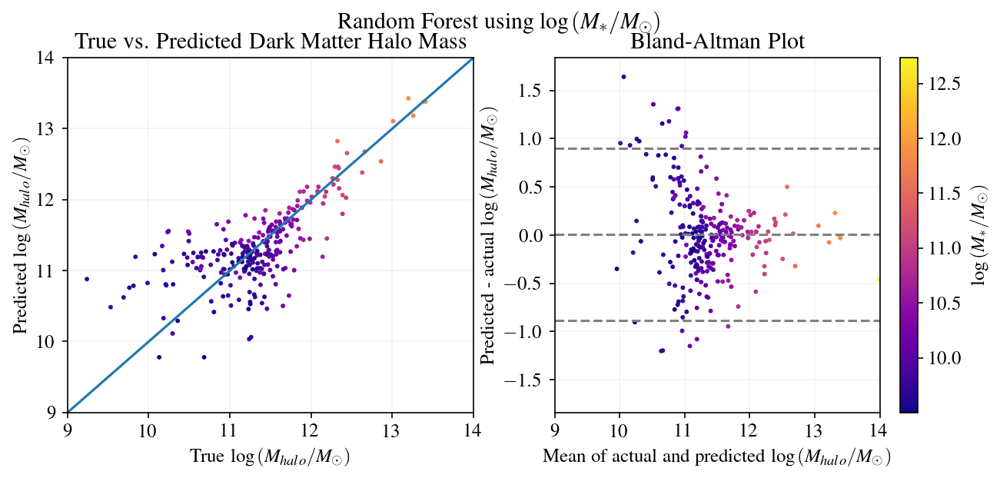

In [ ]:
X_cols = ['logstellarmass']
exp, simple_baseline = perform_experiment(pd.concat([df_train,df_valid]), df_test, X_cols, 'loghalomass',
                         r'Random Forest using $\log\left(M_*/M_\odot\right)$')
exp

### OLD - compare many simple models

#### Set up results table

In [ ]:
results_list = []

#### Run experiments

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


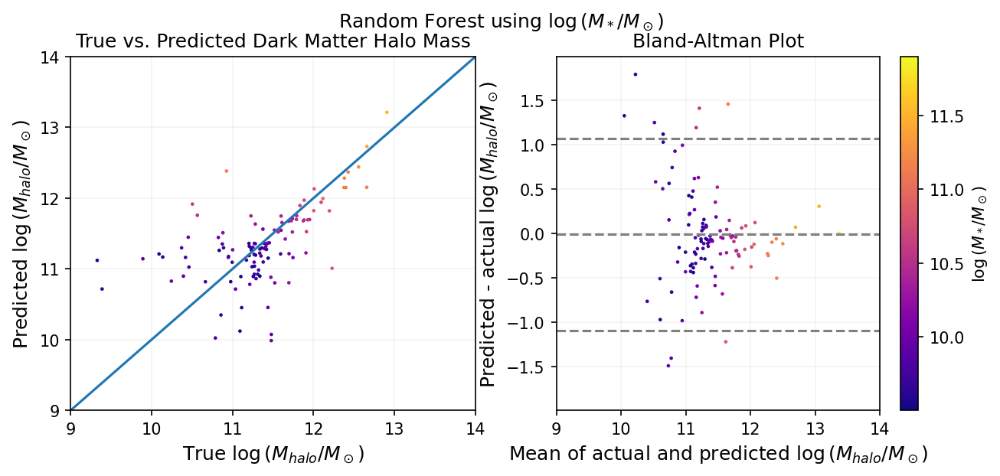

In [ ]:
X_cols = ['logstellarmass']
exp = perform_experiment(df_train, df_valid, X_cols, 'loghalomass',
                         r'Random Forest using $\log\left(M_*/M_\odot\right)$')
exp['model'] = 'Random Forest'
exp['features'] = X_cols
exp['subset'] = 'all'
results_list.append(exp)

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


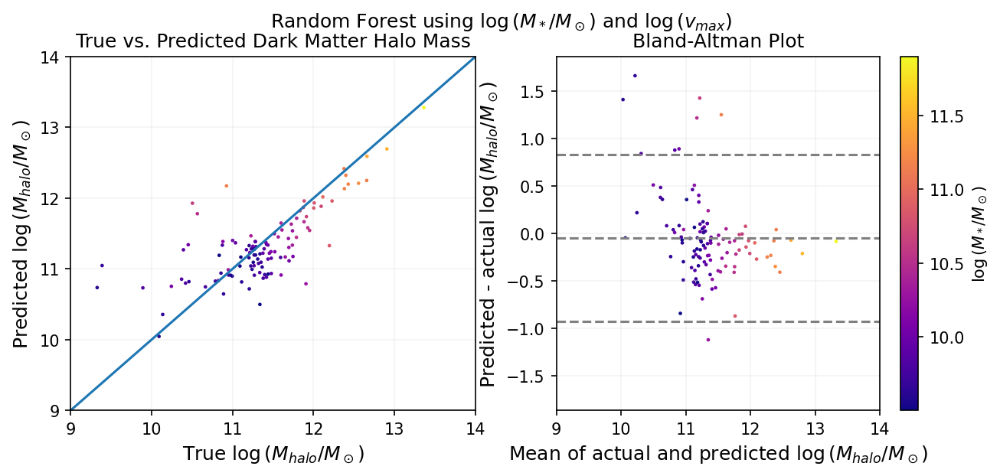

In [ ]:
X_cols = ['logstellarmass', 'logvmax']
exp = perform_experiment(df_train, df_valid, X_cols, 'loghalomass',
                         r'Random Forest using $\log\left(M_*/M_\odot\right)$ and $\log\left(v_{max}\right)$')
exp['model'] = 'Random Forest'
exp['features'] = X_cols
exp['subset'] = 'all'
results_list.append(exp)

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


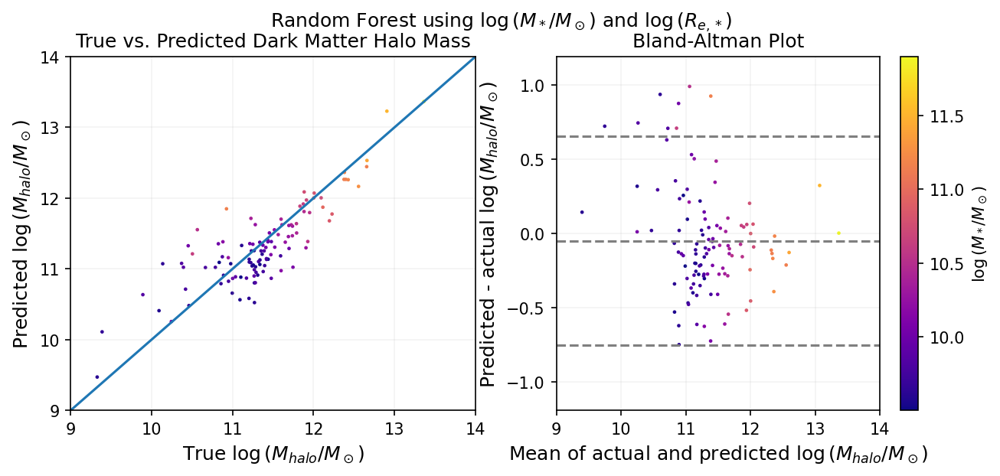

In [ ]:
X_cols = ['logstellarmass', 'logstellarhalfmassradius']
exp = perform_experiment(df_train, df_valid, X_cols, 'loghalomass',
                         r'Random Forest using $\log\left(M_*/M_\odot\right)$ and $\log\left(R_{e,*}\right)$')
exp['model'] = 'Random Forest'
exp['features'] = X_cols
exp['subset'] = 'all'
results_list.append(exp)

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


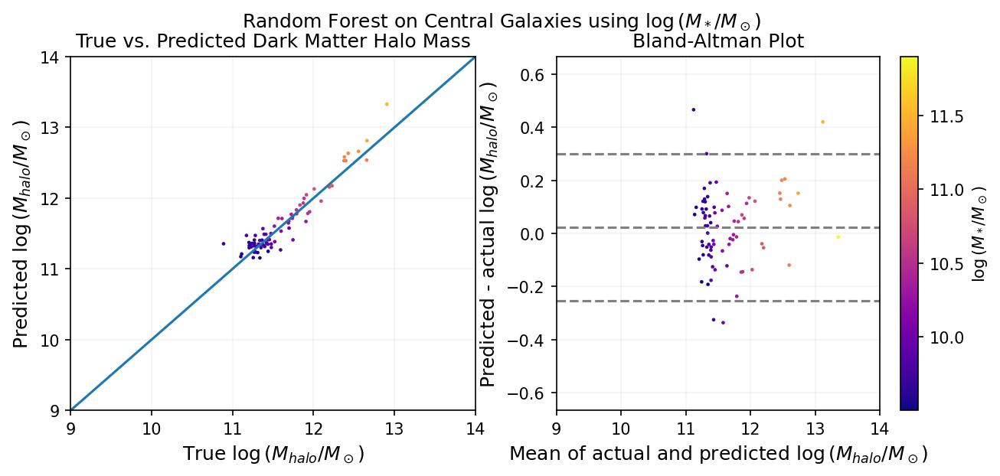

In [ ]:
X_cols = ['logstellarmass']
exp = perform_experiment(df_train[df_train['is_central']], df_valid[df_valid['is_central']], X_cols, 'loghalomass',
                         r'Random Forest on Central Galaxies using $\log\left(M_*/M_\odot\right)$')
exp['model'] = 'Random Forest'
exp['features'] = X_cols
exp['subset'] = 'central'
results_list.append(exp)

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


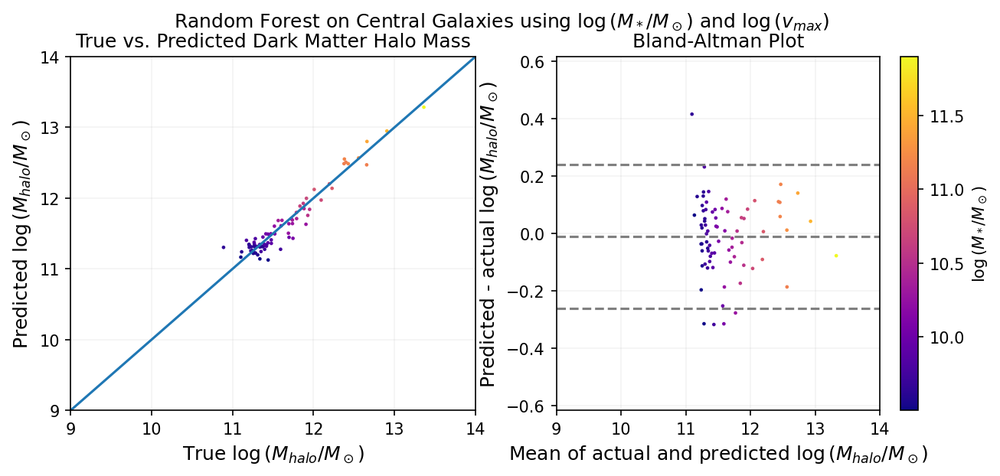

In [ ]:
X_cols = ['logstellarmass', 'logvmax']
exp = perform_experiment(df_train[df_train['is_central']], df_valid[df_valid['is_central']], X_cols, 'loghalomass',
                         r'Random Forest on Central Galaxies using $\log\left(M_*/M_\odot\right)$ and $\log\left(v_{max}\right)$')
exp['model'] = 'Random Forest'
exp['features'] = X_cols
exp['subset'] = 'central'
results_list.append(exp)

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


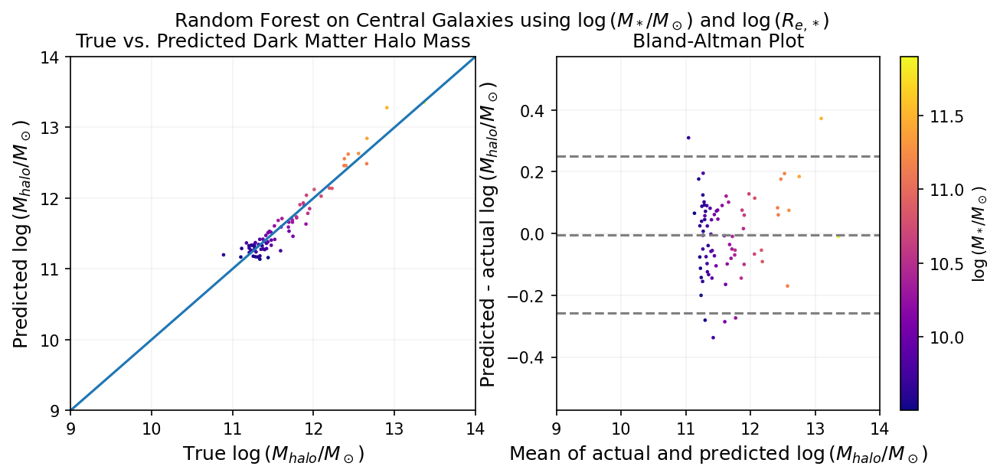

In [ ]:
X_cols = ['logstellarmass', 'logstellarhalfmassradius']
exp = perform_experiment(df_train[df_train['is_central']], df_valid[df_valid['is_central']], X_cols, 'loghalomass',
                         r'Random Forest on Central Galaxies using $\log\left(M_*/M_\odot\right)$ and $\log\left(R_{e,*}\right)$')
exp['model'] = 'Random Forest'
exp['features'] = X_cols
exp['subset'] = 'central'
results_list.append(exp)

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


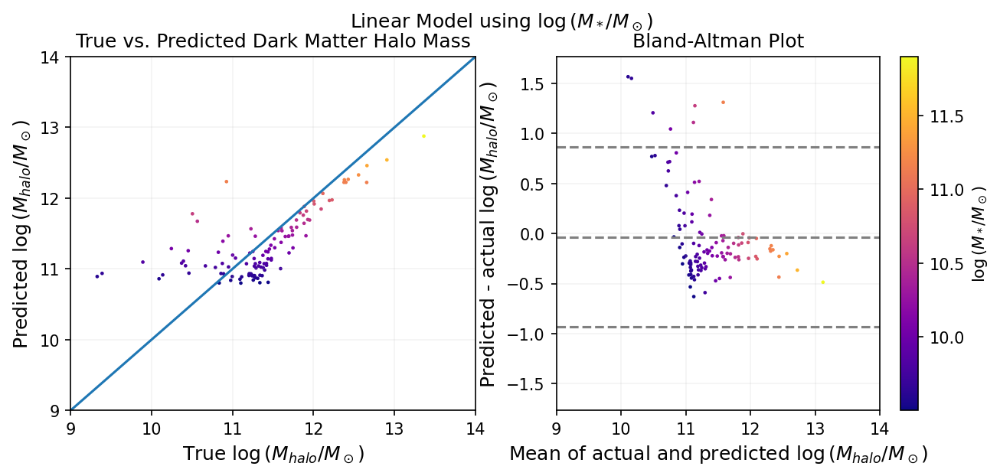

In [ ]:
X_cols = ['logstellarmass']
exp = perform_experiment(df_train, df_valid, X_cols, 'loghalomass', linear=True,
                         title=r'Linear Model using $\log\left(M_*/M_\odot\right)$')
exp['model'] = 'Linear'
exp['features'] = X_cols
exp['subset'] = 'all'
results_list.append(exp)

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


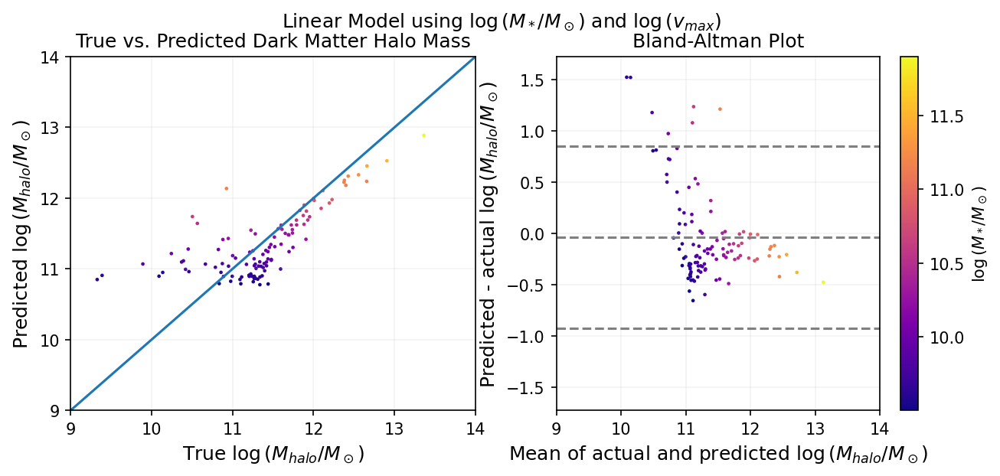

In [ ]:
X_cols = ['logstellarmass', 'logvmax']
exp = perform_experiment(df_train, df_valid, X_cols, 'loghalomass', linear=True,
                         title=r'Linear Model using $\log\left(M_*/M_\odot\right)$ and $\log\left(v_{max}\right)$')
exp['model'] = 'Linear'
exp['features'] = X_cols
exp['subset'] = 'all'
results_list.append(exp)

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


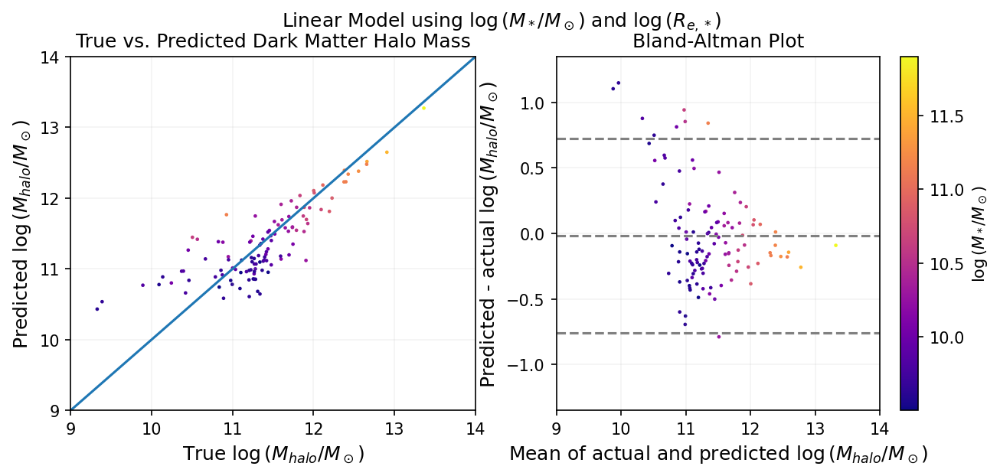

In [ ]:
X_cols = ['logstellarmass', 'logstellarhalfmassradius']
exp = perform_experiment(df_train, df_valid, X_cols, 'loghalomass', linear=True,
                         title=r'Linear Model using $\log\left(M_*/M_\odot\right)$ and $\log\left(R_{e,*}\right)$')
exp['model'] = 'Linear'
exp['features'] = X_cols
exp['subset'] = 'all'
results_list.append(exp)

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


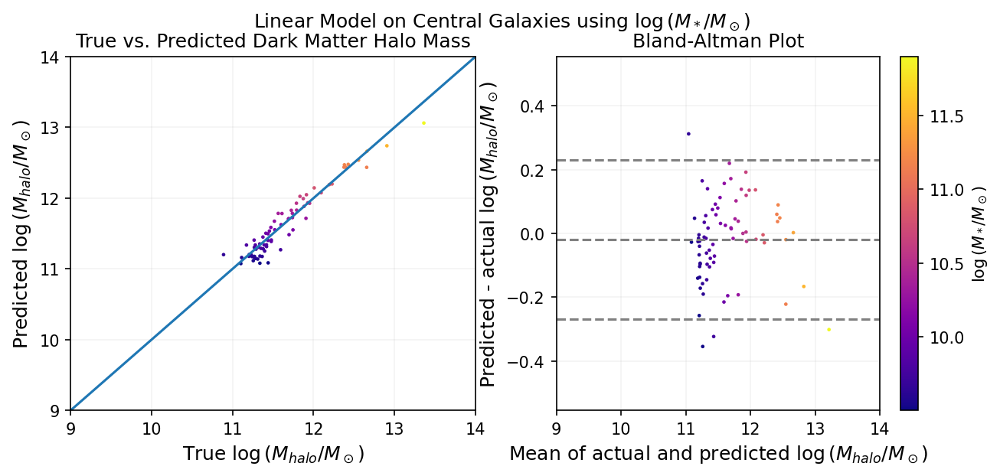

In [ ]:
X_cols = ['logstellarmass']
exp = perform_experiment(df_train[df_train['is_central']], df_valid[df_valid['is_central']], X_cols, 'loghalomass', linear=True,
                         title=r'Linear Model on Central Galaxies using $\log\left(M_*/M_\odot\right)$')
exp['model'] = 'Linear'
exp['features'] = X_cols
exp['subset'] = 'central'
results_list.append(exp)

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


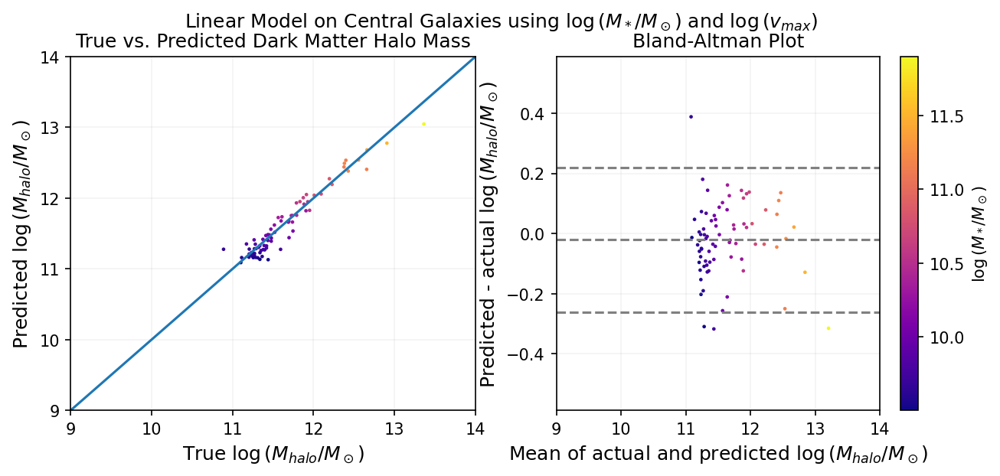

In [ ]:
X_cols = ['logstellarmass', 'logvmax']
exp = perform_experiment(df_train[df_train['is_central']], df_valid[df_valid['is_central']], X_cols, 'loghalomass', linear=True,
                         title=r'Linear Model on Central Galaxies using $\log\left(M_*/M_\odot\right)$ and $\log\left(v_{max}\right)$')
exp['model'] = 'Linear'
exp['features'] = X_cols
exp['subset'] = 'central'
results_list.append(exp)

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


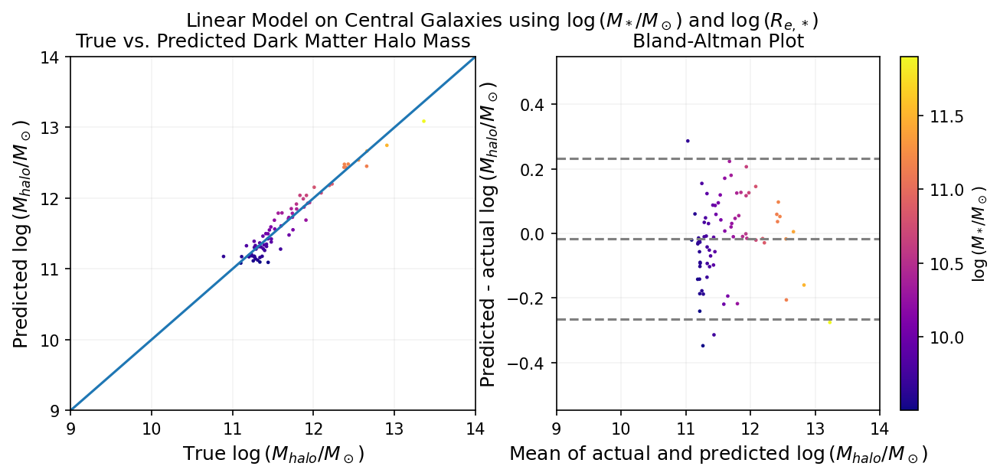

In [ ]:
X_cols = ['logstellarmass', 'logstellarhalfmassradius']
exp = perform_experiment(df_train[df_train['is_central']], df_valid[df_valid['is_central']], X_cols, 'loghalomass', linear=True,
                         title=r'Linear Model on Central Galaxies using $\log\left(M_*/M_\odot\right)$ and $\log\left(R_{e,*}\right)$')
exp['model'] = 'Linear'
exp['features'] = X_cols
exp['subset'] = 'central'
results_list.append(exp)

#### Display tabular results

In [ ]:
results_df = pd.DataFrame(results_list)
print(results_df[results_df['subset']=='all'])
print(results_df[results_df['subset']=='central'])

     MSE    MAE   RMSE    MAPE    R^2          model  \
0  0.307  0.386  0.554  0.0352  0.271  Random Forest   
1  0.202  0.310  0.450  0.0281  0.520  Random Forest   
2  0.132  0.278  0.363  0.0250  0.688  Random Forest   
6  0.210  0.342  0.458  0.0312  0.502         Linear   
7  0.205  0.339  0.453  0.0310  0.512         Linear   
8  0.144  0.289  0.380  0.0263  0.658         Linear   

                                     features subset  
0                            [logstellarmass]    all  
1                   [logstellarmass, logvmax]    all  
2  [logstellarmass, logstellarhalfmassradius]    all  
6                            [logstellarmass]    all  
7                   [logstellarmass, logvmax]    all  
8  [logstellarmass, logstellarhalfmassradius]    all  
       MSE     MAE   RMSE     MAPE    R^2          model  \
3   0.0205  0.1120  0.143  0.00962  0.906  Random Forest   
4   0.0164  0.0986  0.128  0.00849  0.925  Random Forest   
5   0.0169  0.1040  0.130  0.00889  0.922 

## Perform Experiments using Morphological Features

### Compare effectiveness of radii measures

- `logstellarhalfmassradius`
- `r20`
- `r50`
- `r80`
- `rhalf_ellip`
- `rpetro_ellip`
- `sersic_ellip`
- `sersic_rhalf`

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')
<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')
<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *

,MSE,MAE,RMSE,MAPE,R^2,features
0,0.132,0.278,0.363,0.0250,0.688,logstellarhalfmassradius
1,0.179,0.295,0.423,0.0266,0.575,r20
2,0.175,0.286,0.419,0.0257,0.584,r50
3,0.172,0.281,0.415,0.0252,0.592,r80
4,0.129,0.255,0.359,0.0229,0.695,rhalf_ellip
5,0.148,0.268,0.385,0.0242,0.648,rpetro_ellip
6,0.247,0.351,0.497,0.0319,0.413,sersic_ellip
7,0.143,0.275,0.378,0.0247,0.661,sersic_rhalf


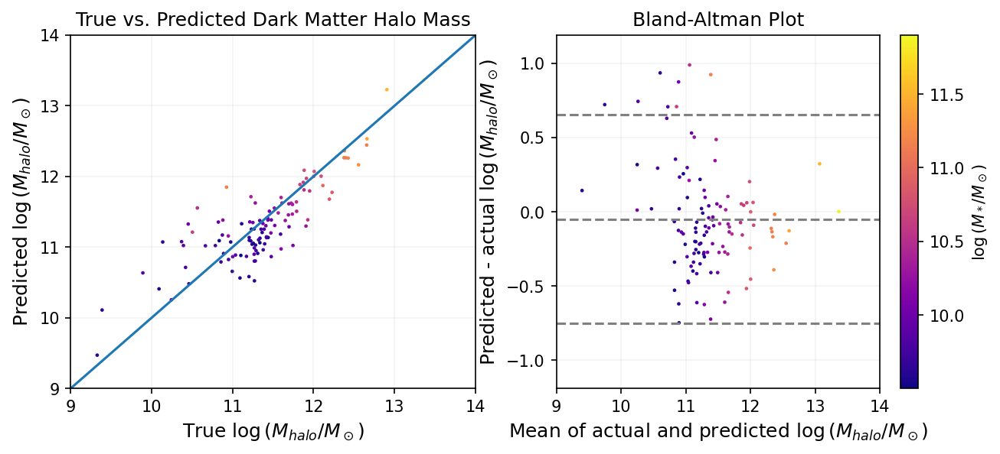

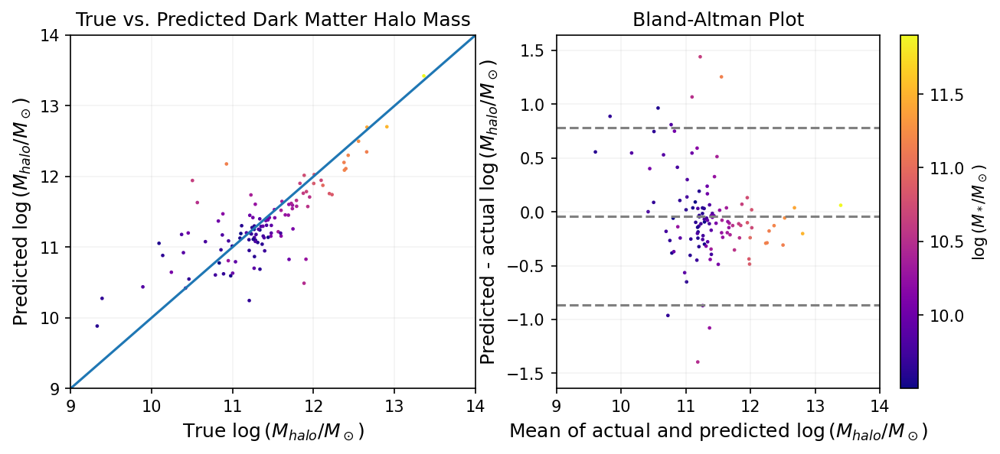

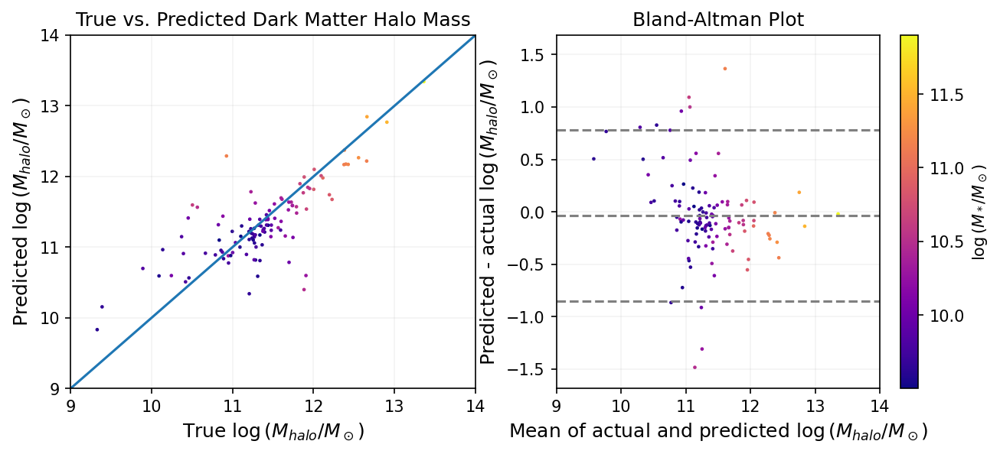

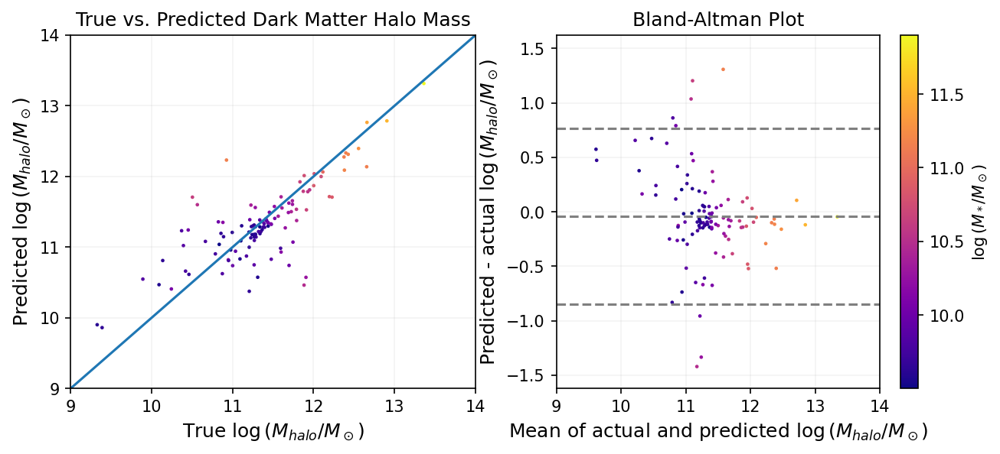

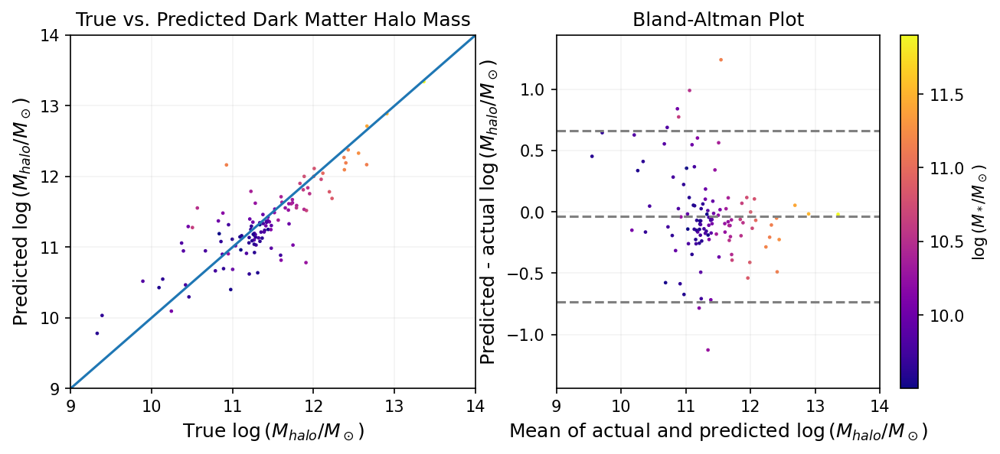

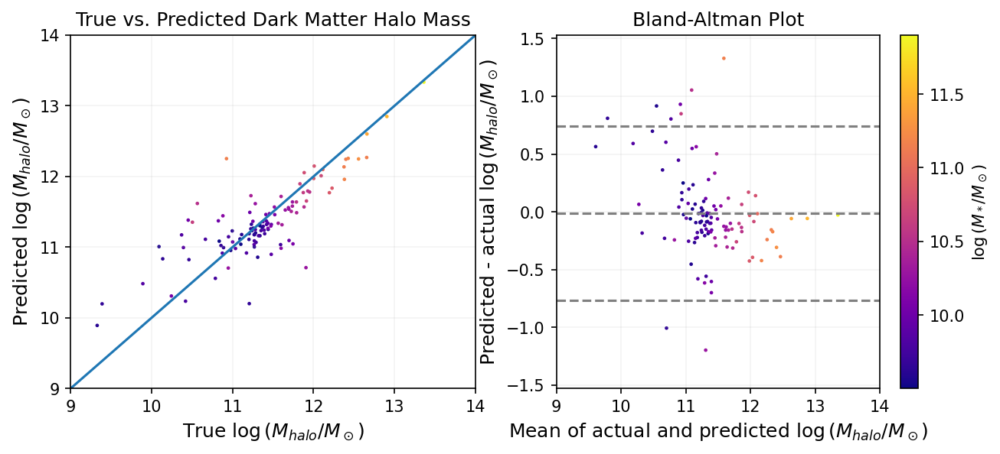

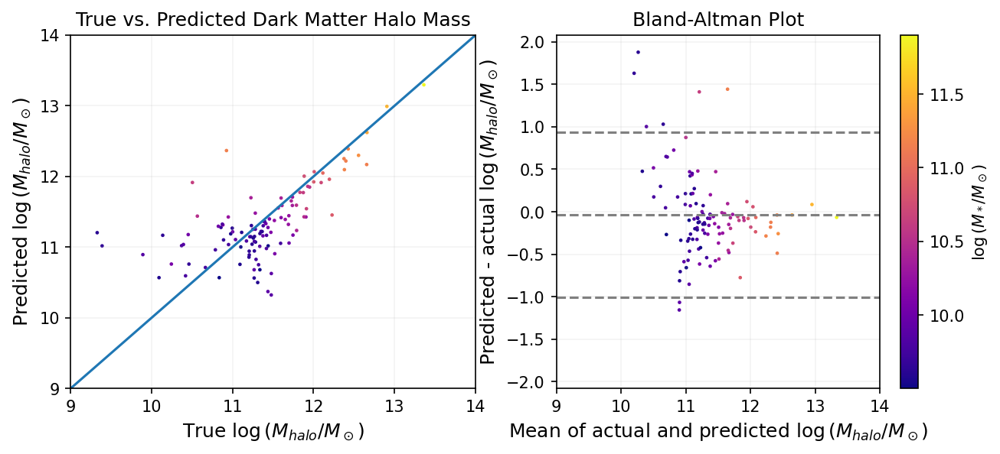

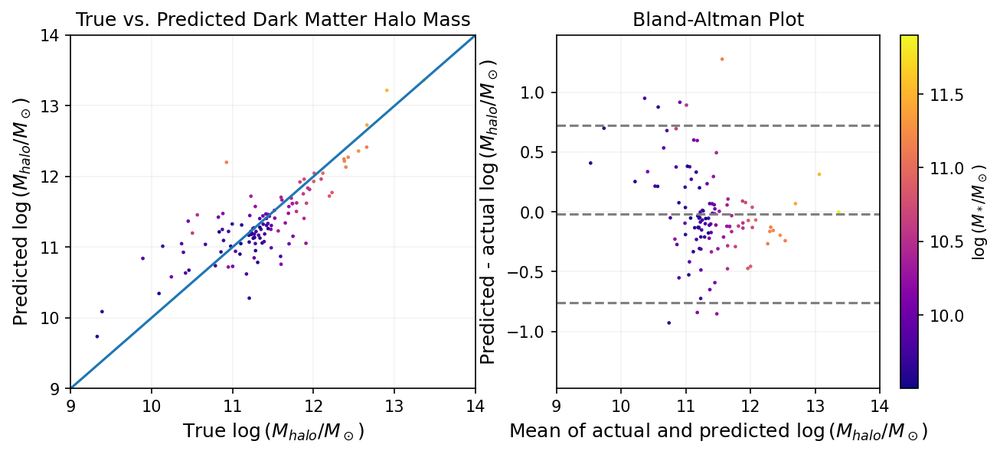

In [ ]:
results_list = []
options = ['logstellarhalfmassradius', 'r20', 'r50', 'r80', 'rhalf_ellip', 'rpetro_ellip', 'sersic_ellip', 'sersic_rhalf']
for measure in options:
  exp = perform_experiment(df_train, df_valid, ['logstellarmass', measure], 'loghalomass')
  exp['features'] = measure
  results_list.append(exp)
pd.DataFrame(results_list)

### Other stuff

- `concentration`
- `asymmetry`
- `smoothness`
- `gini`
- `m20`
- `multimode`
- `intensity`
- `deviation`
- `sersic_n`

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')
<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')
<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *

,MSE,MAE,RMSE,MAPE,R^2,features
0,0.246,0.351,0.496,0.0320,0.416,concentration
1,0.151,0.267,0.389,0.0239,0.640,asymmetry
2,0.190,0.304,0.435,0.0277,0.550,smoothness
3,0.263,0.368,0.513,0.0336,0.376,gini
4,0.213,0.322,0.461,0.0294,0.495,m20
5,0.185,0.294,0.430,0.0267,0.561,multimode
6,0.194,0.299,0.441,0.0272,0.539,intensity
7,0.239,0.353,0.489,0.0322,0.433,deviation
8,0.235,0.361,0.485,0.0329,0.442,sersic_n


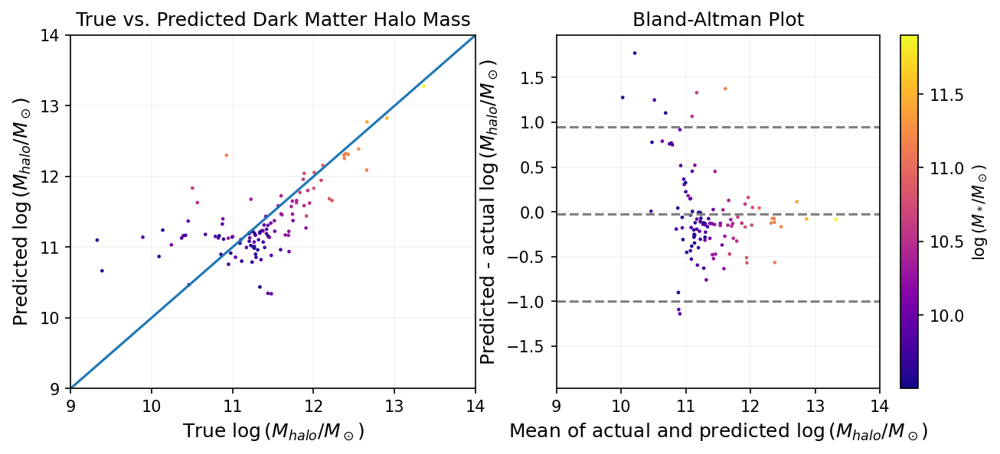

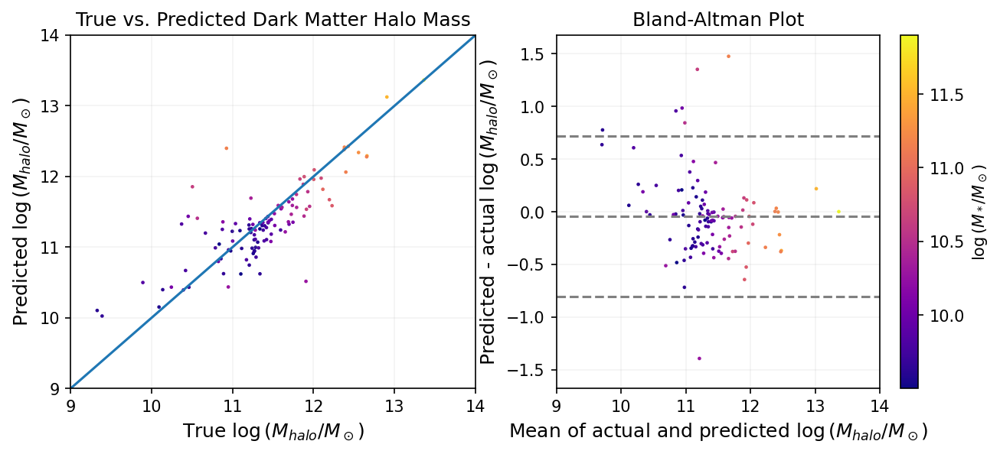

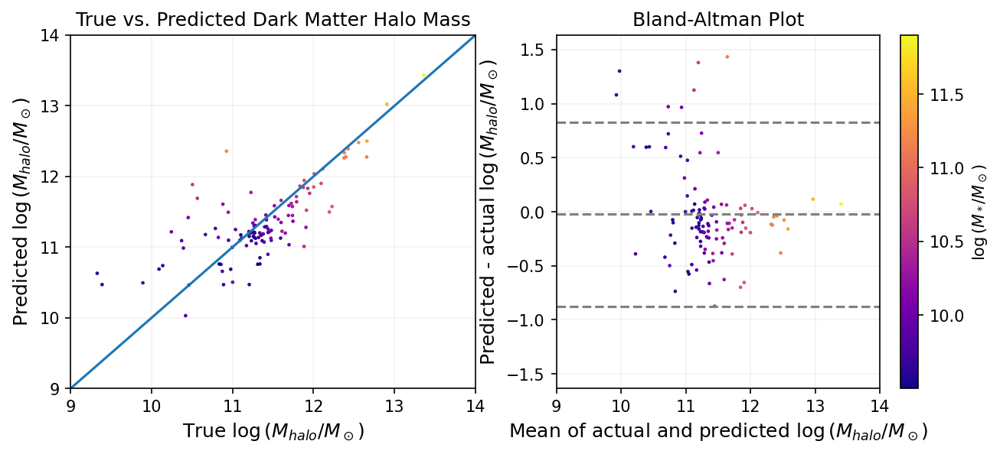

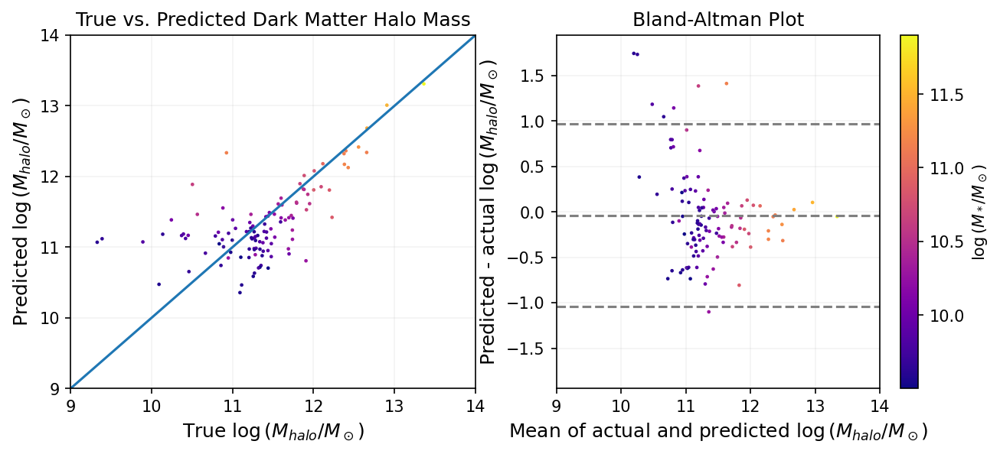

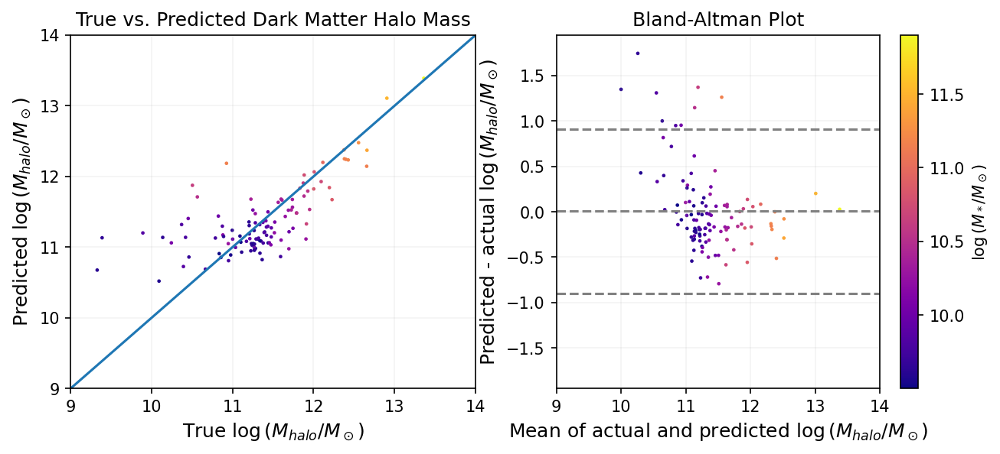

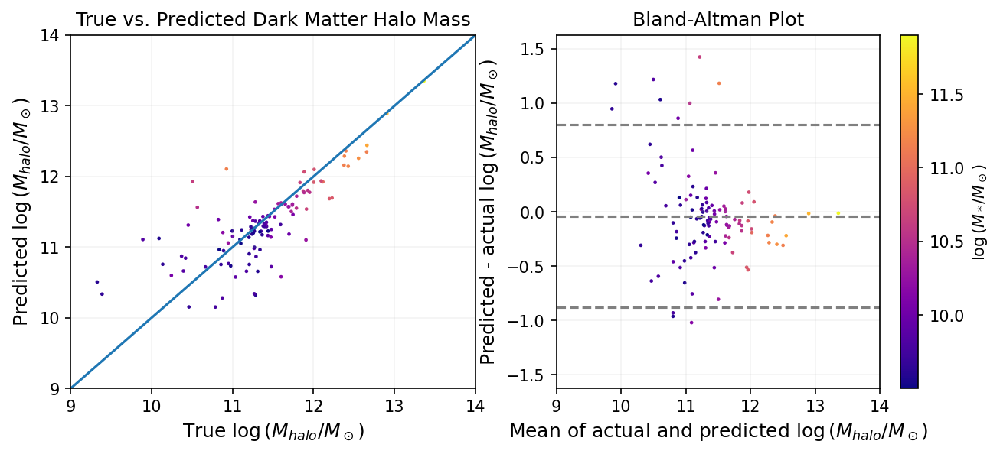

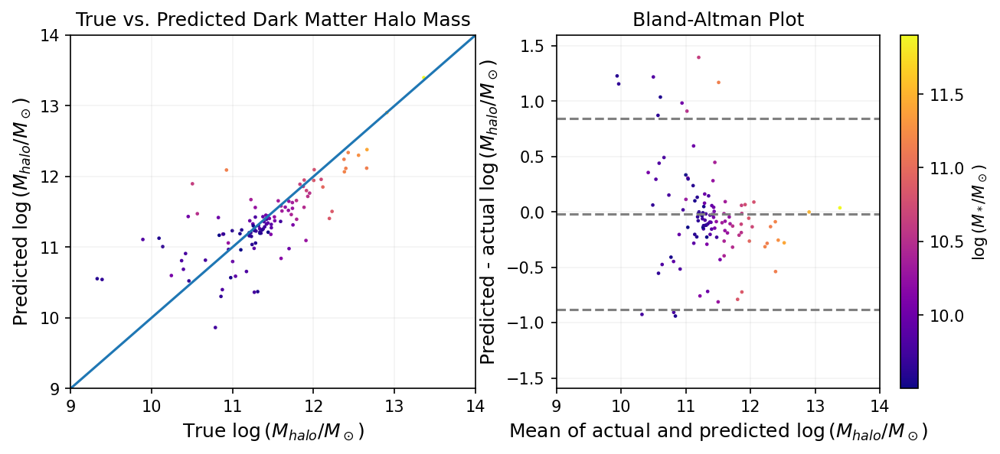

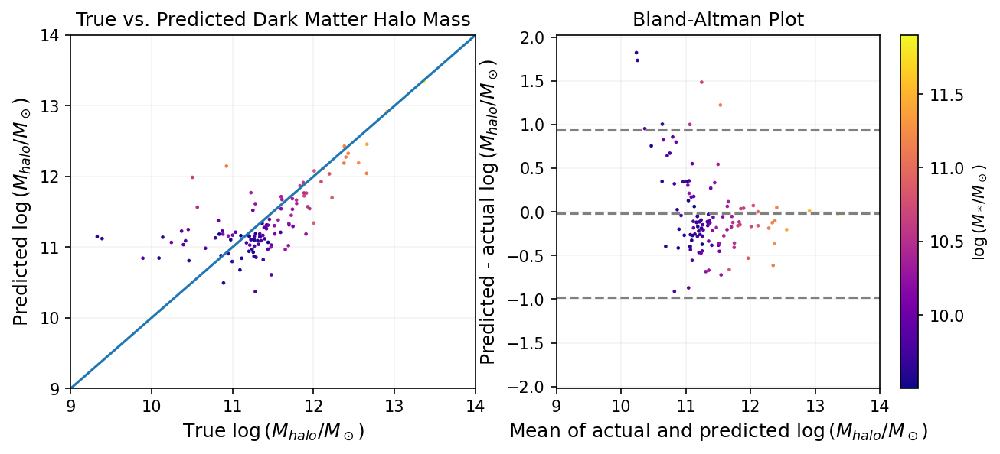

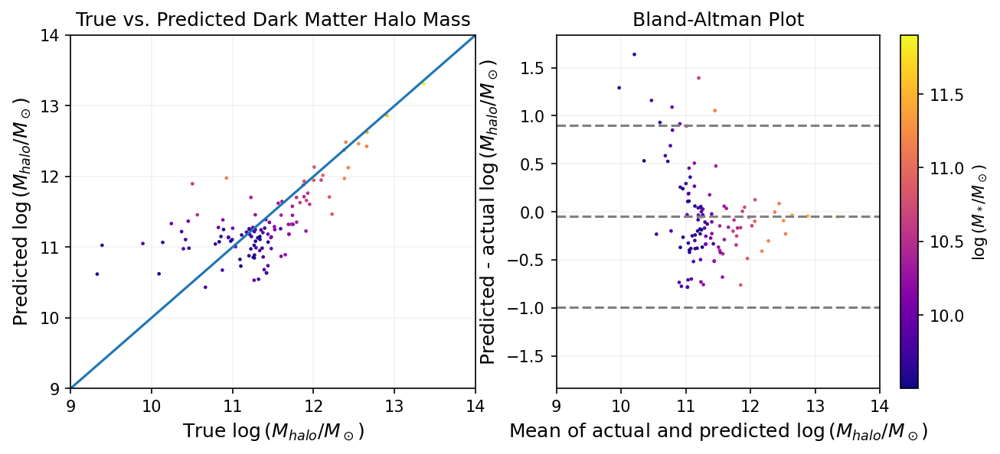

In [ ]:
results_list = []
options = ['concentration', 'asymmetry', 'smoothness', 'gini', 'm20', 'multimode', 'intensity', 'deviation', 'sersic_n']
for measure in options:
  exp = perform_experiment(df_train, df_valid, ['logstellarmass', measure], 'loghalomass')
  exp['features'] = measure
  results_list.append(exp)
pd.DataFrame(results_list)

### Test combinations of morphological features

Old features:
- ['logstellarmass', 'concentration', 'r50', 'rpetro_ellip']
- ['logstellarmass', 'asymmetry', 'r50', 'rpetro_ellip']
- ['logstellarmass', 'asymmetry', 'r50', 'rpetro_ellip', 'multimode']
- ['logstellarmass', 'asymmetry', 'r50', 'rpetro_ellip', 'sersic_n']
- ['logstellarmass', 'asymmetry', 'r50', 'rpetro_ellip', 'smoothness']
- ['logstellarmass', 'asymmetry', 'r50', 'rpetro_ellip', 'smoothness', 'sersic_n']

<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')
<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')
<ipython-input-131-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *

,MSE,MAE,RMSE,MAPE,R^2,num,features
0,0.135,0.249,0.367,0.0223,0.680,3,"[logstellarmass, rpetro_ellip, asymmetry]"
1,0.163,0.268,0.403,0.0240,0.614,3,"[logstellarmass, r20, asymmetry]"
2,0.142,0.247,0.376,0.0222,0.664,4,"[logstellarmass, r20, rpetro_ellip, asymmetry]"
3,0.121,0.230,0.348,0.0206,0.713,4,"[logstellarmass, rpetro_ellip, asymmetry, mult..."
4,0.130,0.239,0.361,0.0215,0.691,4,"[logstellarmass, rpetro_ellip, asymmetry, smoo..."
5,0.131,0.241,0.361,0.0216,0.690,4,"[logstellarmass, rpetro_ellip, asymmetry, inte..."
6,0.117,0.236,0.342,0.0212,0.723,4,"[logstellarmass, rpetro_ellip, asymmetry, sers..."
7,0.139,0.248,0.373,0.0222,0.670,5,"[logstellarmass, r20, rpetro_ellip, asymmetry,..."
8,0.131,0.246,0.362,0.0220,0.689,5,"[logstellarmass, r20, rpetro_ellip, asymmetry,..."
9,0.129,0.242,0.359,0.0218,0.693,6,"[logstellarmass, r20, rpetro_ellip, asymmetry,..."


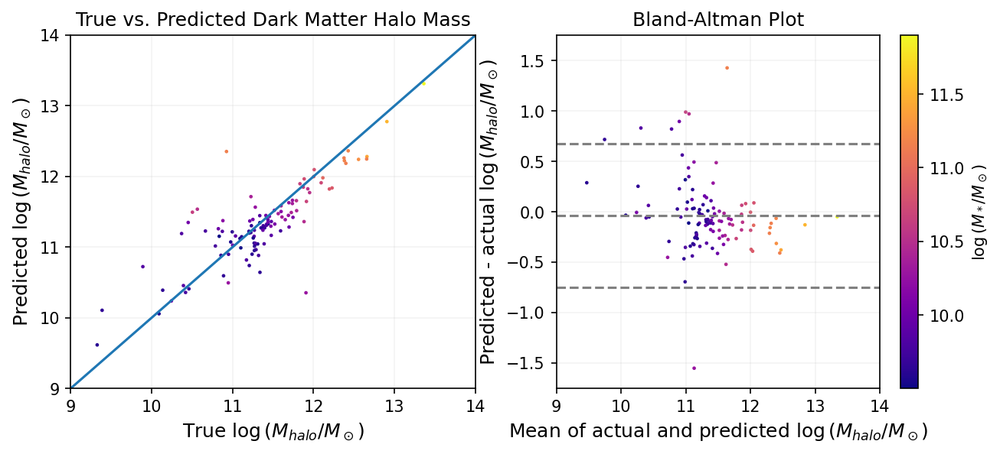

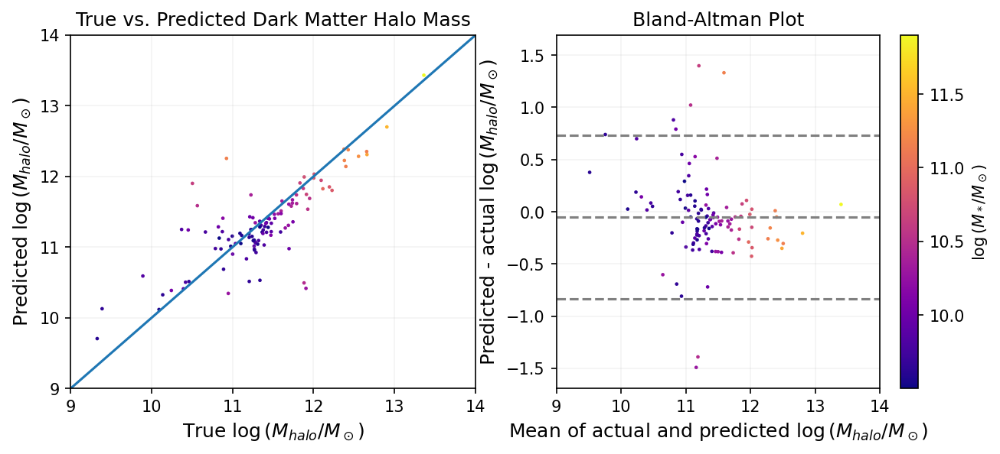

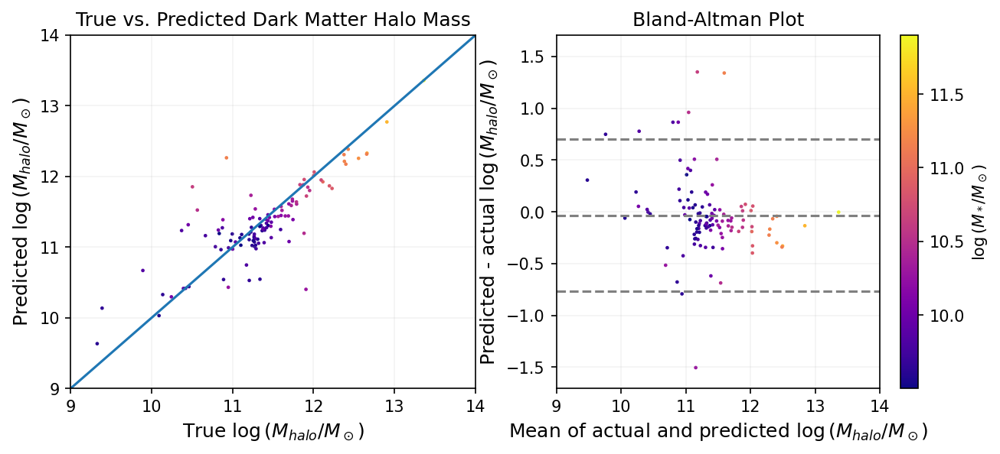

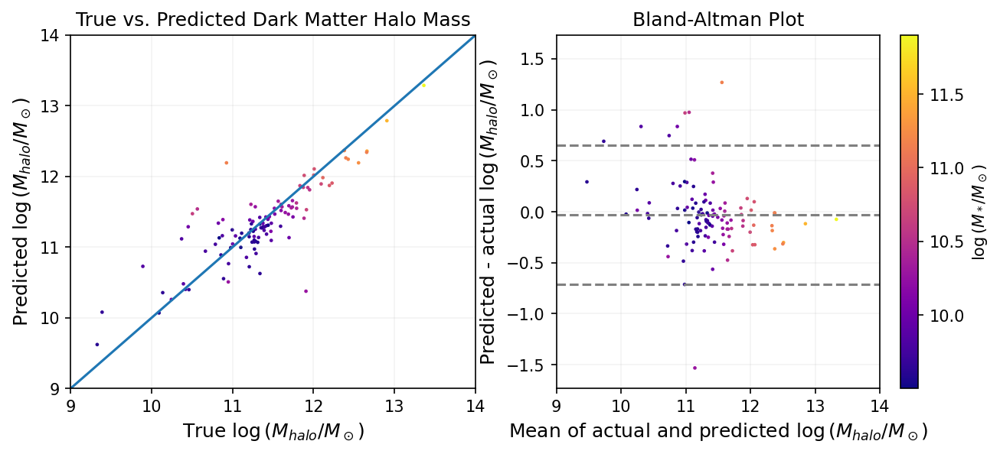

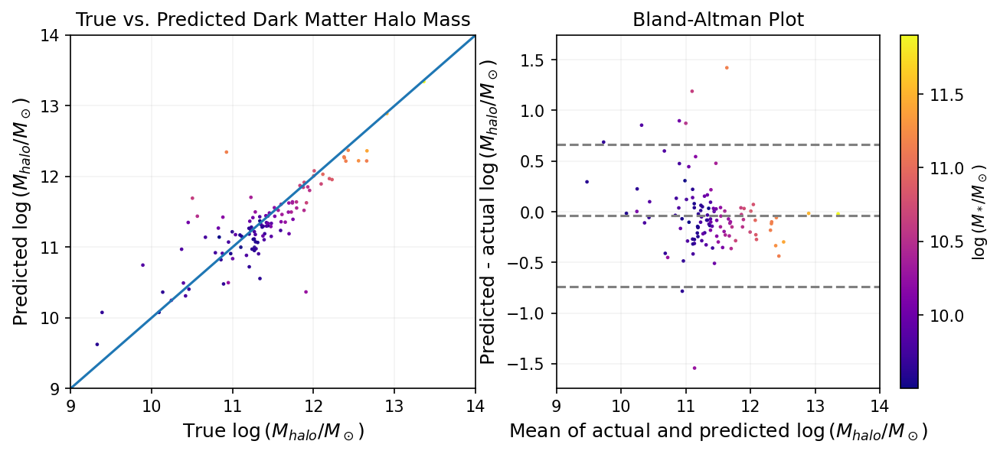

...

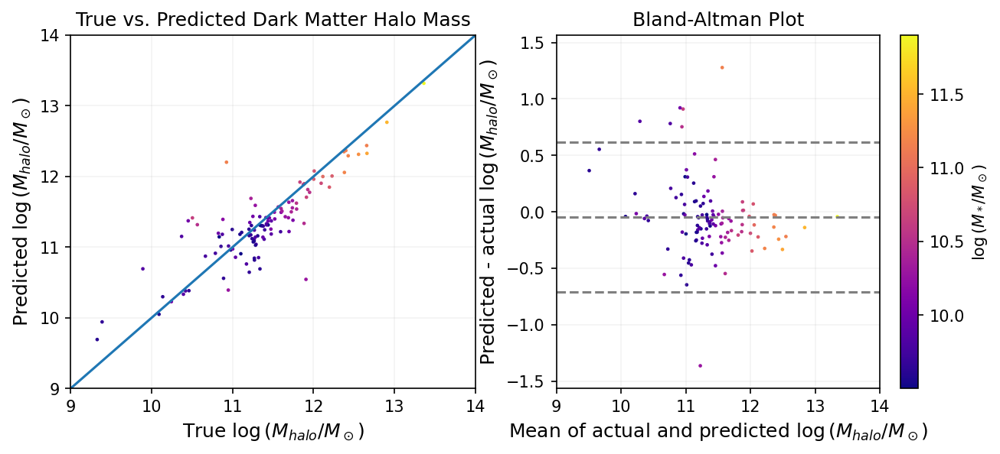

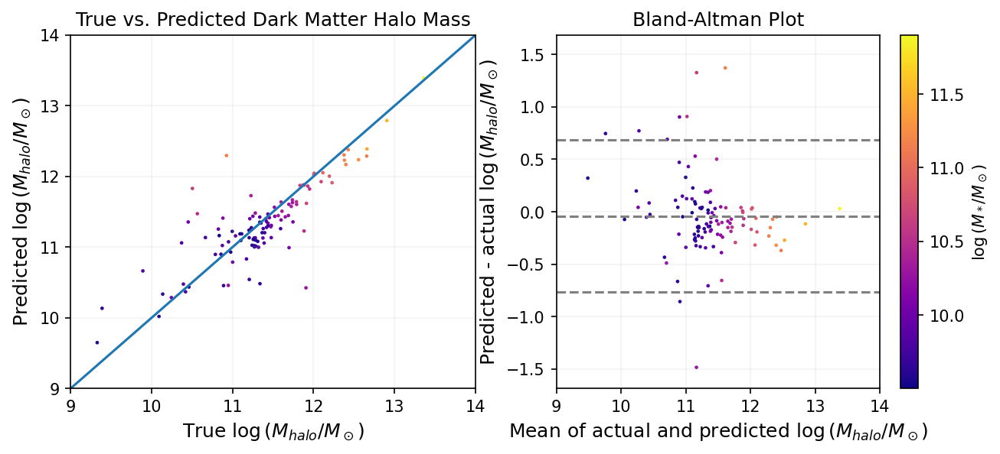

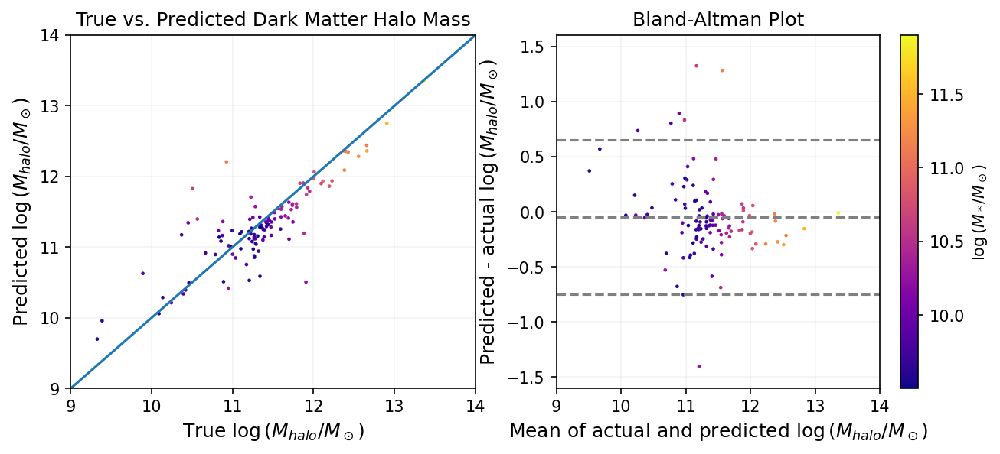

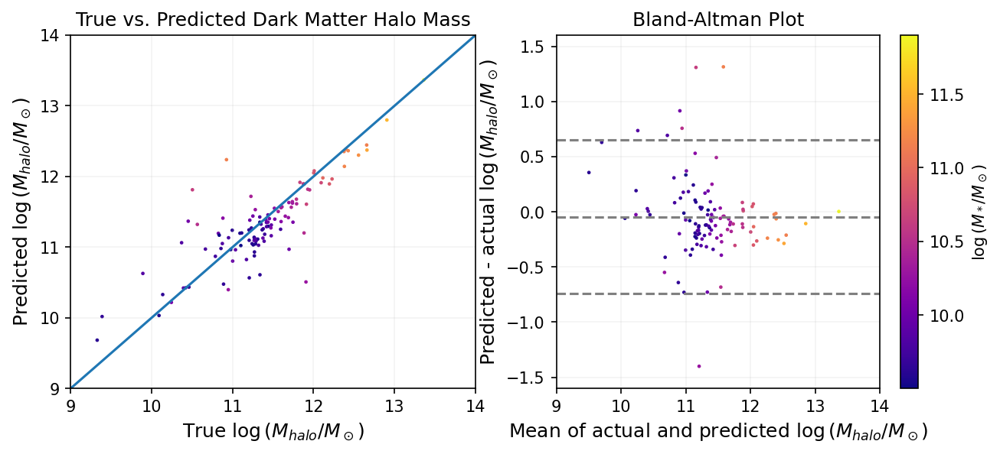

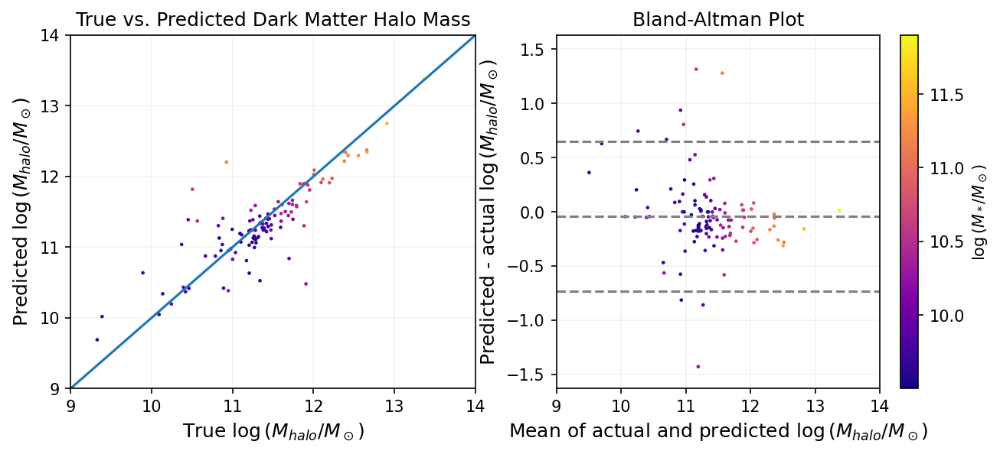

In [ ]:
results_list = []
model_selections = [
    ['logstellarmass', 'rpetro_ellip', 'asymmetry'],
    ['logstellarmass', 'r20', 'asymmetry'],
    ['logstellarmass', 'r20', 'rpetro_ellip', 'asymmetry'],
    ['logstellarmass', 'rpetro_ellip', 'asymmetry', 'multimode'],
    ['logstellarmass', 'rpetro_ellip', 'asymmetry', 'smoothness'],
    ['logstellarmass', 'rpetro_ellip', 'asymmetry', 'intensity'],
    ['logstellarmass', 'rpetro_ellip', 'asymmetry', 'sersic_n'],
    ['logstellarmass', 'r20', 'rpetro_ellip', 'asymmetry', 'smoothness'],
    ['logstellarmass', 'r20', 'rpetro_ellip', 'asymmetry', 'sersic_n'],
    ['logstellarmass', 'r20', 'rpetro_ellip', 'asymmetry', 'smoothness', 'sersic_n'],
    ['logstellarmass', 'asymmetry', 'r20', 'rpetro_ellip', 'smoothness', 'sersic_n', 'multimode', 'intensity']
]

for features in model_selections:
  exp = perform_experiment(df_train, df_valid, features, 'loghalomass')
  exp["num"] = len(features)
  exp['features'] = features
  results_list.append(exp)
morphological_feature_results = pd.DataFrame(results_list)
morphological_feature_results

### k-fold cross validation

In [ ]:
for idx, features in enumerate(model_selections):
  cv_result = crossval_rf(df_combined[df_combined['set'] != 'test'], features, 'loghalomass')
  morphological_feature_results.at[idx, 'cv_MSE_mean'] = abs(np.mean(cv_result['test_neg_mean_squared_error']))
  morphological_feature_results.at[idx, 'cv_MSE_std'] = abs(np.std(cv_result['test_neg_mean_squared_error']))
  morphological_feature_results.at[idx, 'cv_R^2_mean'] = abs(np.mean(cv_result['test_r2']))
  morphological_feature_results.at[idx, 'cv_R^2_std'] = abs(np.std(cv_result['test_r2']))

morphological_feature_results['cv_MSE_score'] = ((morphological_feature_results['cv_MSE_mean'] \
                                             - morphological_feature_results['MSE']) \
                                             / morphological_feature_results['cv_MSE_std']).apply(lambda x: sig_fig(x))
morphological_feature_results['cv_R^2_score'] = ((morphological_feature_results['cv_R^2_mean'] \
                                             - morphological_feature_results['R^2']) \
                                             / morphological_feature_results['cv_R^2_std']).apply(lambda x: sig_fig(x))
morphological_feature_results['cv_MSE_mean'] = morphological_feature_results['cv_MSE_mean'].apply(lambda x: sig_fig(x))
morphological_feature_results['cv_MSE_std'] = morphological_feature_results['cv_MSE_std'].apply(lambda x: sig_fig(x))
morphological_feature_results['aic'] = 2 * morphological_feature_results['num'] - 2 \
                                     * morphological_feature_results['cv_MSE_mean']
morphological_feature_results[['MSE', 'cv_MSE_mean', 'cv_MSE_std', 'cv_MSE_score', 'num', 'aic', 'features']]

,MSE,cv_MSE_mean,cv_MSE_std,cv_MSE_score,num,aic,features
0,0.135,0.170,0.0758,0.455,3,5.660,"[logstellarmass, rpetro_ellip, asymmetry]"
1,0.163,0.185,0.0772,0.291,3,5.630,"[logstellarmass, r20, asymmetry]"
2,0.142,0.170,0.0760,0.370,4,7.660,"[logstellarmass, r20, rpetro_ellip, asymmetry]"
3,0.121,0.159,0.0709,0.529,4,7.682,"[logstellarmass, rpetro_ellip, asymmetry, mult..."
4,0.130,0.163,0.0725,0.459,4,7.674,"[logstellarmass, rpetro_ellip, asymmetry, smoo..."
5,0.131,0.163,0.0746,0.429,4,7.674,"[logstellarmass, rpetro_ellip, asymmetry, inte..."
6,0.117,0.159,0.0706,0.600,4,7.682,"[logstellarmass, rpetro_ellip, asymmetry, sers..."
7,0.139,0.166,0.0724,0.368,5,9.668,"[logstellarmass, r20, rpetro_ellip, asymmetry,..."
8,0.131,0.161,0.0705,0.430,5,9.678,"[logstellarmass, r20, rpetro_ellip, asymmetry,..."
9,0.129,0.157,0.0678,0.418,6,11.686,"[logstellarmass, r20, rpetro_ellip, asymmetry,..."


In [ ]:
for idx,estimator in enumerate(cv_result['estimator']):
    print("Features sorted by their score for estimator {}:".format(idx))
    feature_importances = pd.DataFrame(estimator.feature_importances_,
                                       index = model_selections[-1],
                                        columns=['importance']).sort_values('importance', ascending=False)
    print(feature_importances)

Features sorted by their score for estimator 0:
                importance
logstellarmass    0.643871
rpetro_ellip      0.114585
asymmetry         0.108560
r20               0.035405
sersic_n          0.031718
smoothness        0.031007
multimode         0.024371
intensity         0.010484
Features sorted by their score for estimator 1:
                importance
logstellarmass    0.484511
asymmetry         0.236671
rpetro_ellip      0.116632
r20               0.049004
sersic_n          0.041927
smoothness        0.030091
multimode         0.025297
intensity         0.015868
Features sorted by their score for estimator 2:
                importance
logstellarmass    0.570979
asymmetry         0.201154
rpetro_ellip      0.093749
sersic_n          0.038242
r20               0.029598
multimode         0.028882
smoothness        0.025966
intensity         0.011430
Features sorted by their score for estimator 3:
                importance
logstellarmass    0.620004
asymmetry         0.15842

Text(0, 0.5, 'CV MSE')

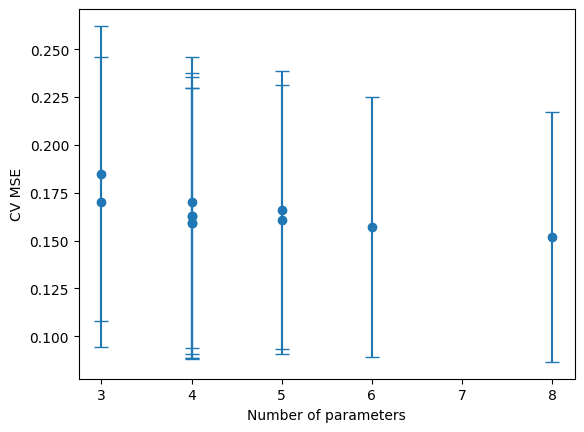

In [ ]:
plt.errorbar(morphological_feature_results['num'], morphological_feature_results['cv_MSE_mean'], \
             yerr=morphological_feature_results['cv_MSE_std'], ls='', marker='o', capsize=5)
plt.xlabel("Number of parameters")
plt.ylabel("CV MSE")

### Final Choice for Morphological Features

<ipython-input-14-70c268f10915>:59: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


{'MSE': 0.119,
 'MAE': 0.246,
 'RMSE': 0.345,
 'MAPE': 0.0223,
 'R^2': 0.726,
 'Bias': -0.0234,
 'NMAD': 0.234,
 'OF': 0.374}

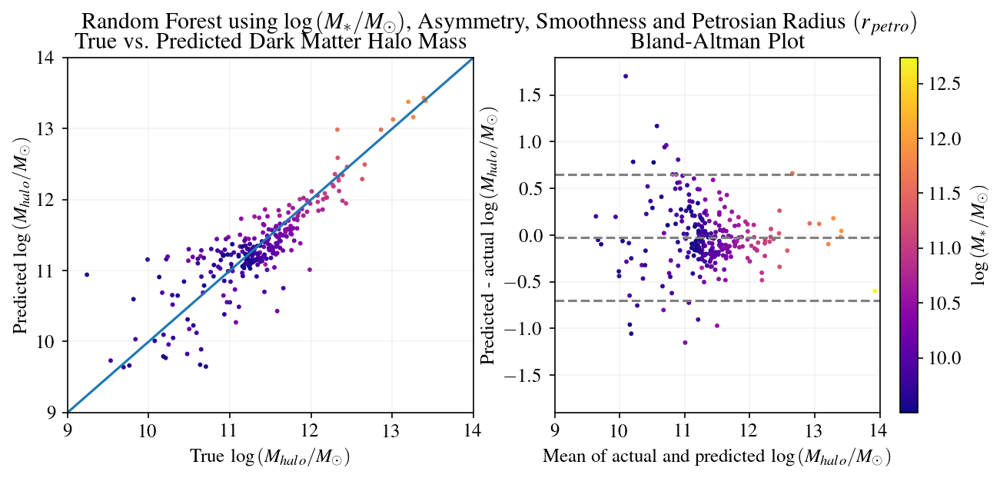

In [ ]:
X_cols=['logstellarmass', 'asymmetry', 'smoothness', 'rpetro_ellip']
exp, morph_baseline = perform_experiment(pd.concat([df_train, df_valid]), df_test, X_cols, 'loghalomass',
                   title=r'Random Forest using $\log\left(M_*/M_\odot\right)$, Asymmetry, Smoothness and Petrosian Radius $\left(r_{petro}\right)$')
exp

## Perform Experiment on Overdensity

<ipython-input-14-70c268f10915>:59: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


{'MSE': 0.14,
 'MAE': 0.26,
 'RMSE': 0.374,
 'MAPE': 0.0238,
 'R^2': 0.68,
 'Bias': -0.00807,
 'NMAD': 0.261,
 'OF': 0.322}

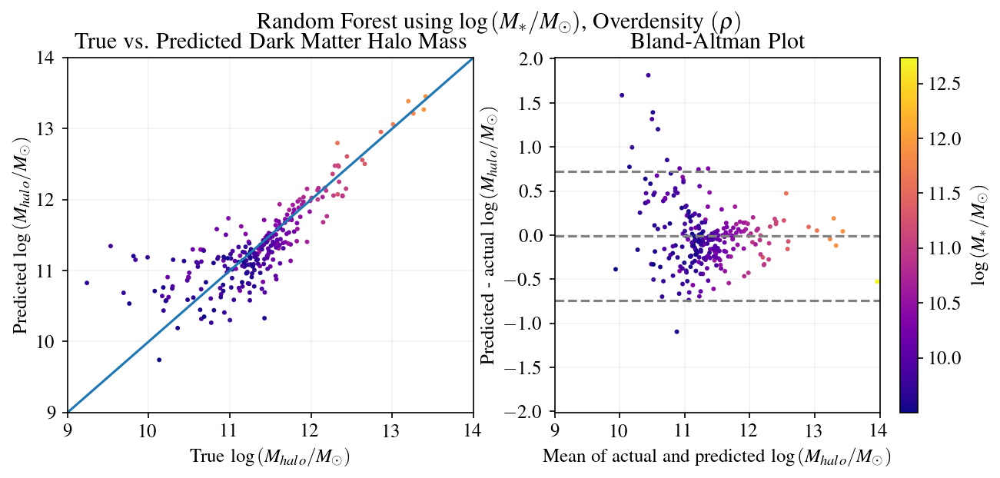

In [ ]:
X_cols = ['logstellarmass', 'overdensity']
exp, spat_baseline = perform_experiment(pd.concat([df_train, df_valid]), df_test, X_cols, 'loghalomass',
                         r'Random Forest using $\log\left(M_*/M_\odot\right)$, Overdensity $\left(\rho\right)$')
exp

## Perform experiment using morphological features and overdensity

<ipython-input-14-70c268f10915>:59: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


{'MSE': 0.0963,
 'MAE': 0.22,
 'RMSE': 0.31,
 'MAPE': 0.0199,
 'R^2': 0.779,
 'Bias': -0.034,
 'NMAD': 0.22,
 'OF': 0.403}

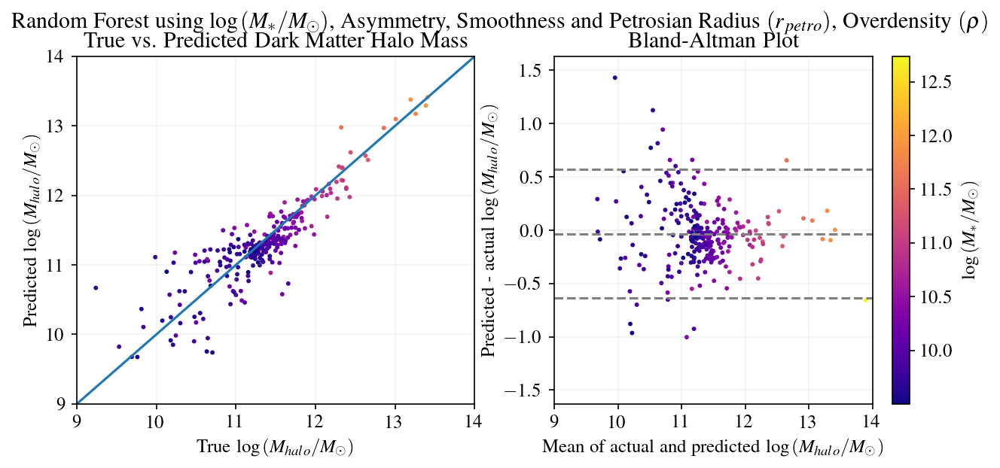

In [ ]:
X_cols=['logstellarmass', 'asymmetry', 'smoothness', 'rpetro_ellip', 'overdensity']
exp, comb_baseline = perform_experiment(pd.concat([df_train, df_valid]), df_test, X_cols, 'loghalomass',
                   title=r'Random Forest using $\log\left(M_*/M_\odot\right)$, Asymmetry, Smoothness and Petrosian Radius $\left(r_{petro}\right)$, Overdensity $\left(\rho\right)$')
exp

## CNN

#### Notes about images

- Scaled to image size = 15 * logstellarhalfmassradius - REMOVED by John
- all smoothing calculations in this section are carried out through a convolution with a ‘standard’ smoothed particle hydrodynamics (SPH) spline kernel redefined over the interval [0, hsml]

Recommendations from paper
- convolving with an appropriate PSF, which for simplicity we choose to be an azimuthally symmetric Gaussian function. We match the full width at half-maximum (FWHM) of the PSF to the median seeing of the PS1 instrument, which is 1.11 arcsec (1.31 arcsec) in the i band (g
band).
-  model sky background noise as a Gaussian random variable that is added to each pixel flux value, with a standard deviation 1/15 and 1/25 e− s−1 pixel−1 in the i band and g band, respectively

### Image Processing Details

In [ ]:
img_list = [Path(f'./homogenized_data/{i}.npy')  for i in subhalos.index]
max = np.zeros(3)
mean = np.zeros(3)
var = np.zeros(3)
for img_path in tqdm(img_list):
  img = np.load(img_path)
  mean += img.mean(axis=(1,2))
  var += img.var(axis=(1,2))
  temp_max = img.max(axis=(1,2))
  # max = np.max(np.asarray([temp_max, max]), axis=0)

mean /= len(img_list) #* max
std = np.sqrt(var / len(img_list) )#/ max)
print(f"\nMean: {mean}, std: {std}")

100%|██████████| 1548/1548 [00:03<00:00, 455.19it/s]


Mean: [0.14429071 0.25167954 0.22085771], std: [2.46019    4.55866415 4.05927318]


In [ ]:
def arcsec_to_sigma(arcsec):
  return arcsec / (8 * np.log(2))**0.5

def _to_torch(arr):
    arr = arr.astype(np.float32)
    sample = torch.from_numpy(arr).to(device)
    return sample

class AddGaussianNoise(nn.Module):
  def __init__(self, std=[]):
    super().__init__()
    self.std = torch.tensor(std, dtype=torch.float32, device=device)

  def forward(self, image):
    out = image + image*self.std[:, None, None]
    return out


class AddGaussianBlur(nn.Module):
  def __init__(self, arcsecs=[]):
    super().__init__()
    self.sigmas = [arcsec_to_sigma(arcsec) for arcsec in arcsecs]
    self.gaussians = [v2.GaussianBlur(kernel_size=3, sigma=(sigma,sigma)) for sigma in self.sigmas]

  def forward(self, image):
    blurred = torch.stack([gaussian(image[:,i, :, :]) for i, gaussian in enumerate(self.gaussians)], dim=1)
    return blurred


class RandomJitter(nn.Module):
  def __init__(self, max_shift, type=None):
    super().__init__()
    self.max_shift = max_shift
    self.type = 'roll' if type=='roll' else 'pad'

  def forward(self, image):
    # Randomly generate shift values
    if self.type == 'roll':
      # Apply periodic boundary conditions using torch.roll
      shift_x = torch.randint(-self.max_shift, self.max_shift + 1, size=(1,), dtype=torch.int, device=device)
      shift_y = torch.randint(-self.max_shift, self.max_shift + 1, size=(1,), dtype=torch.int, device=device)
      jittered_img = torch.roll(image, shifts=(shift_x.item(), shift_y.item()), dims=(1, 2))
    elif self.type == 'pad':
      jittered_img = TF.pad(image, self.max_shift)
    else:
      jittered_img = image

    return jittered_img

### Setup for training

In [ ]:
print(f"Using {device} device")

Using cuda device


In [ ]:
class ImageDataset(Dataset):
  def __init__(self, root, img_labels, transforms=None):
    super().__init__()
    self.path = Path(root)
    self.img_labels = img_labels
    self.transforms = transforms

  def __len__(self):
    return len(self.img_labels)

  def __getitem__(self, idx):
    entry = self.img_labels.iloc[idx]
    img_path = self.path / (str(entry.name) + ".npy")
    image = _to_torch(np.load(img_path))
    logstellarmass = _to_torch(np.asarray([entry.logstellarmass]))
    loghalomass = _to_torch(np.asarray([entry.loghalomass]))
    if self.transforms:
      image = self.transforms(image)
    return (image, logstellarmass), loghalomass

In [ ]:
class ResNetModel(nn.Module):
  def __init__(self, pretrained=False, preprocess_params={}):
    super().__init__()
    weights = (ResNet18_Weights.DEFAULT if pretrained else None)
    self.backbone = resnet18(weights=weights)
    n_inputs = self.backbone.fc.in_features #512 for ResNet18
    self.backbone.fc = nn.Sequential(
        nn.Linear(n_inputs, 100)
    )

    self.backbone_transform = weights.transforms()
    self.backbone_transform.mean = preprocess_params['mean'] or self.backbone_transform.mean
    self.backbone_transform.std = preprocess_params['std'] or self.backbone_transform.std
    self.preprocessing = preprocess_params['preprocessing'] or nn.Identity()

    self.layers = nn.Sequential(
        nn.Linear(101, 50),
        nn.ReLU(),
        nn.Linear(50, 20),
        nn.ReLU(),
        nn.Linear(20, 1)
    )

    # self.layers = nn.Linear(100, 1)

  def forward(self, x):
    img, logstellarmass = x
    img = self.backbone_transform(self.preprocessing(img))
    out = self.backbone(img)
    out = torch.concat([out, logstellarmass], dim=1)
    return self.layers(out)

### Train model with pretrained backbone

In [ ]:
# bands in order g, r, i
blur_arcsec = [1.3, 1.2, 1.1]
noise_sigmas = [1/25, (1/15 + 1/25) / 2, 1/15]
preprocess_params = {
    'mean': mean.tolist(),
    'std': std.tolist(),
    'preprocessing': v2.Compose([
        AddGaussianBlur(arcsecs=blur_arcsec),
        AddGaussianNoise(std=noise_sigmas)
    ])
}

transforms = v2.Compose([
  v2.RandomHorizontalFlip(p=0.5),
  v2.RandomVerticalFlip(0.5),
  v2.RandomRotation((0,90)),
  # v2.RandomApply([v2.RandomRotation((90, 90))], p=0.5),
  v2.RandomCrop(size=224, padding=5, padding_mode='constant'),
])

In [ ]:
model = ResNetModel(pretrained=True, preprocess_params=preprocess_params).to(device)
# optimizer = torch.optim.Adagrad([ LR=E-5
#     {'params': model.backbone.parameters(), 'lr': 1e-2},
#     {'params': model.layers.parameters()}
#     ], lr=learning_rate, lr_decay=lr_decay)
model_name = 'lr1e-4_wd1e-3_fullrot_am'
hyperparameters = {
    'lr': 1e-4,
    'weight_decay': 1e-3,
    'batch_size': 64,
    'epochs': 500,
    'model_path': Path(model_name),
    'loss_fn': nn.MSELoss(),
    'metric_fn': R2Score()
}

train_dataset = ImageDataset(root="./homogenized_data", img_labels=df_train, transforms=transforms)
valid_dataset = ImageDataset(root="./homogenized_data", img_labels=df_valid)

train_dataloader = DataLoader(train_dataset, batch_size=hyperparameters['batch_size'], shuffle=True)
valid_dataloader = DataLoader(valid_dataset, batch_size=hyperparameters['batch_size'], shuffle=True)

cnn_results = train_nn(model, train_dataloader, valid_dataloader, hyperparameters)
cnn_results.to_pickle(hyperparameters['model_path'] / 'results.pk1')

  7%|▋         | 36/500 [03:21<42:06,  5.44s/it]


Train Loss: 0.07960258517414331
Valid Loss: 0.11297255009412766
Stop value: 0


  7%|▋         | 36/500 [03:26<44:22,  5.74s/it]


AttributeError: 'ResNetModel' object has no attribute 'train_all'

### Display Results

This cannot be run in exact order. Analysis of results should be used to determine which epoch to load, or the correct model can be loaded from file.

In [ ]:
cnn_title = r'ResNet18 with full rotations and Adamax, $\eta_0=1\mathrm{e}{-4}$, $\alpha=1\mathrm{e}{-3}$'

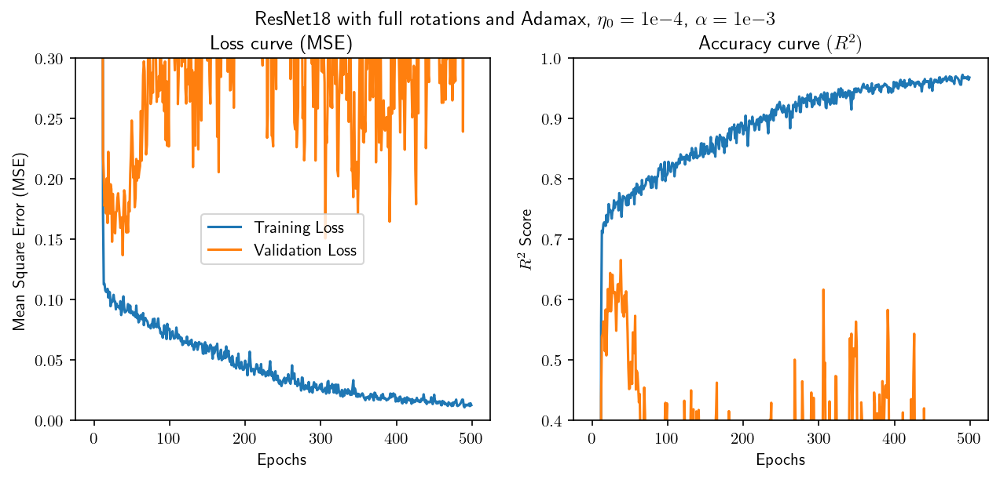

In [ ]:
plot_loss_curves(cnn_results, cnn_title)

In [ ]:
cnn_results.nsmallest(10, 'valid_loss')

,epoch,train_loss,train_metric,valid_loss,valid_metric
547,547,0.078319,"tensor(0.7997, device='cuda:0')",0.106465,"tensor(0.7370, device='cuda:0')"
471,471,0.085503,"tensor(0.7823, device='cuda:0')",0.106840,"tensor(0.7301, device='cuda:0')"
592,592,0.073884,"tensor(0.8107, device='cuda:0')",0.107212,"tensor(0.7343, device='cuda:0')"
581,581,0.071734,"tensor(0.8161, device='cuda:0')",0.109553,"tensor(0.7303, device='cuda:0')"
514,514,0.077922,"tensor(0.8002, device='cuda:0')",0.110057,"tensor(0.7417, device='cuda:0')"
518,518,0.077967,"tensor(0.8013, device='cuda:0')",0.110478,"tensor(0.7259, device='cuda:0')"
595,595,0.076157,"tensor(0.8052, device='cuda:0')",0.110518,"tensor(0.7273, device='cuda:0')"
582,582,0.073379,"tensor(0.8124, device='cuda:0')",0.111303,"tensor(0.7304, device='cuda:0')"
560,560,0.087259,"tensor(0.7779, device='cuda:0')",0.111446,"tensor(0.7244, device='cuda:0')"
470,470,0.082934,"tensor(0.7882, device='cuda:0')",0.111727,"tensor(0.7294, device='cuda:0')"


In [ ]:
title += ', Epoch 547'

In [ ]:
# model = torch.load('adamw_epoch116.pth')
model = torch.load(hyperparameters['model_path'] / 'epoch_547.pth')

FileNotFoundError: [Errno 2] No such file or directory: 'lr5e-4_wd1e-3_fullrot/epoch_547.pth'

<ipython-input-16-0bff9c9addea>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


{'MSE': 0.111, 'MAE': 0.225, 'RMSE': 0.333, 'MAPE': 0.02, 'R^2': 0.737}

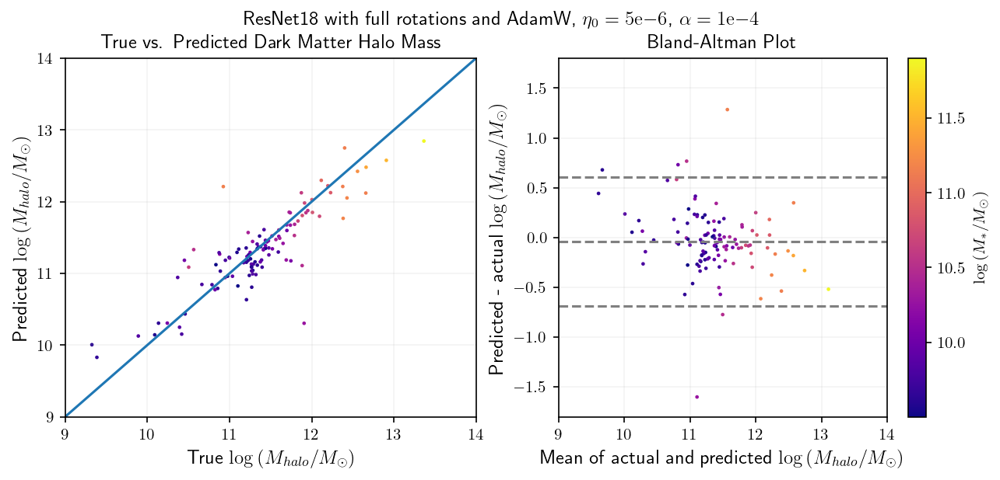

In [ ]:
dataset = ImageDataset(root="./homogenized_data", img_labels=df_valid)
dataloader = DataLoader(dataset, batch_size=1)
# model = torch.load(hyperparameters['model_path'] / 'epoch_116.pth')
plot_nn_predictions(model, df_valid, dataloader, cnn_title)

## GNN

Description of many dataloaders in plain english:
https://medium.com/stanford-cs224w/a-tour-of-pygs-data-loaders-9f2384e48f8f

### Set up data as graph

In [ ]:
# get input node features, `x`, and targets, `y`
x = torch.tensor(subhalos[["logstellarmass"]].values, dtype=torch.float)
y = torch.tensor(subhalos[["loghalomass"]].values, dtype=torch.float)

# also keep track of positions
pos = torch.tensor(subhalos[["x", "y", "z"]].values, dtype=torch.float)

D_link = 3 # Originally 5MPc (1/10 the size of my box)
# No smaller than 3 for me

# get all edges
kd_tree = scipy.spatial.KDTree(pos, leafsize=25, boxsize=35.0001/0.6774)
#205 MPc / Hubble constant 0001 is for rounding error
edge_index = kd_tree.query_pairs(r=D_link, output_type="ndarray")

# use tensor, add reverse pairs
edge_index = torch.Tensor(edge_index).t().contiguous().type(torch.long) #LONG INT
edge_index = to_undirected(edge_index)

# compute distances as edge attribute
row, col = edge_index
dist = torch.tensor(np.linalg.norm(pos[row] - pos[col], axis=1)).reshape(-1, 1)
edge_attr = dist

# index in subhalo for finding image
index = torch.tensor(subhalos.index.to_list(), dtype=torch.int)

data = Data(
    x=x,
    y=y,
    idx=index,
    pos=pos,
    edge_index=edge_index,
    edge_attr=edge_attr,
)
data.validate(raise_on_error=True)

True

### Model creation

In [ ]:
# Pooling/aggregation layers bring to a known dimensionality since # of neighbors is unknown
# Sum pooling is really common. Try Max, Mean, and Sum together (or your own :) )
class SAGEGraphConvNet(torch.nn.Module):
    """A simple GNN built using SAGEConv layers.
    """
    def __init__(self, n_in=1, n_hidden=128, n_out=1):
        super(SAGEGraphConvNet, self).__init__()
        self.conv1 = SAGEConv(n_in, n_hidden)
        self.conv2 = SAGEConv(n_hidden, n_hidden)
        self.fc = nn.Linear(n_hidden, n_out, bias=True)
        self.mlp = nn.Sequential(
            nn.Linear(n_in, n_hidden, bias=True),
            nn.ReLU(),
            nn.LayerNorm(n_hidden),
            nn.Linear(n_hidden, n_out, bias=True)
        )

    def forward(self, data):
        x0, edge_index = data.x, data.edge_index

        x1 = self.conv1(x0, edge_index)
        x2 = self.conv2(F.relu(x1), edge_index)
        convs_out = self.fc(F.relu(x2))
        mlp_out = self.mlp(x0)
        return convs_out + mlp_out


class EdgeInteractionLayer(MessagePassing):
    """Interaction network layer with node + edge layers.
    """
    def __init__(self, n_in, n_hidden, n_latent, aggr='sum'):
        super(EdgeInteractionLayer, self).__init__(aggr)

        self.mlp = nn.Sequential(
            nn.Linear(n_in, n_hidden),
            nn.LayerNorm(n_hidden),
            nn.ReLU(),
            nn.Linear(n_hidden, n_hidden),
            nn.LayerNorm(n_hidden),
            nn.ReLU(),
            nn.Linear(n_hidden, n_latent),
        )

        self.messages = 0.
        self.input = 0.

    def forward(self, x, edge_index, edge_attr):
        return self.propagate(edge_index, x=x, edge_attr=edge_attr)

    def message(self, x_i, x_j, edge_attr):

        self.input = torch.cat([x_i, x_j, edge_attr], dim=-1)
        self.messages = self.mlp(self.input)

        return self.messages

class EdgeInteractionGNN(nn.Module):
    """Graph net over nodes and edges with multiple unshared layers, and sequential layers with residual connections.
    Self-loops also get their own MLP (i.e. galaxy-halo connection).
    """
    def __init__(self, n_layers, D_link, node_features=1, edge_features=1, hidden_channels=16, aggr="sum", latent_channels=16, n_out=1, n_unshared_layers=8, loop=True, use_global_pooling=True):
        super(EdgeInteractionGNN, self).__init__()

        self.n_in = 2 * node_features + edge_features
        self.n_out = n_out
        self.use_global_pooling = use_global_pooling
        n_pool = (len(aggr) if isinstance(aggr, list) else 1)

        layers = [
            nn.ModuleList([
                EdgeInteractionLayer(self.n_in, hidden_channels, latent_channels, aggr=aggr)
                for _ in range(n_unshared_layers)
            ])
        ]
        for _ in range(n_layers-1):
            layers += [
                nn.ModuleList([ #instead of 1 should be node_features?
                    EdgeInteractionLayer(2 * latent_channels * n_unshared_layers * n_pool + 1, hidden_channels, latent_channels, aggr=aggr)
                    for _ in range(n_unshared_layers)
                ])
            ]

        self.layers = nn.ModuleList(layers)

        self.fc = nn.Sequential(
            nn.Linear((n_unshared_layers * n_pool) * latent_channels, latent_channels),
            nn.LayerNorm(latent_channels),
            nn.ReLU(),
            nn.Linear(latent_channels, latent_channels),
            nn.LayerNorm(latent_channels),
            nn.ReLU(),
            nn.Linear(latent_channels, latent_channels)
        )

        self.galaxy_halo_mlp = nn.Sequential(
            nn.Linear(latent_channels + node_features, latent_channels),
            nn.LayerNorm(latent_channels),
            nn.ReLU(),
            nn.Linear(latent_channels, latent_channels),
            nn.LayerNorm(latent_channels),
            nn.ReLU(),
            nn.Linear(latent_channels, n_out)
        )

        self.D_link = D_link
        self.h = 0.

    def forward(self, data):
        edge_index = data.edge_index
        edge_attr = data.edge_attr

        # update hidden state on edge (h, or sometimes e_ij in the text)
        h = torch.cat([unshared_layer(data.x, edge_index=edge_index, edge_attr=edge_attr) for unshared_layer in self.layers[0]], axis=1)
        self.h = h
        h = h.relu()

        for layer in self.layers[1:]:
            # if more than 1 layer, then also use a skip connection
            h = self.h + torch.cat([unshared_layer(h, edge_index=edge_index, edge_attr=edge_attr) for unshared_layer in layer], axis=1)

            self.h = h
            h = h.relu()
        temp =self.fc(h)
        x = torch.concat([temp, data.x], axis=1) # latent channels + data.x
        out = self.galaxy_halo_mlp(x)
        return out

### Train Model

In [ ]:
model_name = 'morph_gnn_lr1e-3_lrd1e-4_mp'
hyperparameters = {
    'lr': 1e-3,
    'weight_decay': 1e-4,
    'batch_size': 16,
    'epochs': 300,
    'model_path': Path(model_name),
    'loss_fn': nn.MSELoss(),
    'metric_fn': R2Score()
}


train_indices = torch.tensor(train_mask.values).nonzero(as_tuple=True)[0]
valid_indices = torch.tensor(valid_mask.values).nonzero(as_tuple=True)[0]
test_indices = torch.tensor(test_mask.values).nonzero(as_tuple=True)[0]
assert (set(train_indices) & set(valid_indices) & set(test_indices)) == set()

In [ ]:
# model = SAGEGraphConvNet().to(device)
model = EdgeInteractionGNN(4, D_link, node_features=1, hidden_channels=16, latent_channels=16, n_unshared_layers=4, aggr="max").to(device)

train_data = ClusterData(
    data.subgraph(train_indices),
    num_parts= 24,
    recursive=False,
    log=False
)
train_dataloader = ClusterLoader(
    train_data,
    shuffle=True,
    batch_size=1,
)
valid_data = ClusterData(
    data.subgraph(valid_indices),
    num_parts=2,
    recursive=False,
    log=False
)
valid_dataloader = ClusterLoader(
    valid_data,
    shuffle=False,
    batch_size=1,
)

gnn_results = train_nn(model, train_dataloader, valid_dataloader, hyperparameters)
gnn_results.to_pickle(hyperparameters['model_path'] / 'results.pk1')

100%|██████████| 300/300 [03:49<00:00,  1.31it/s]


Train Loss: 0.012357073292757073
Valid Loss: 0.05276063270866871
Stop value: 11

Done!


### Display results

In [ ]:
title = r"Message Passing GNN, $\eta_0=1\mathrm{e}{-3}$, $\alpha=1\mathrm{e}{-4}$"
# title = r"SageConv GNN, $\eta_0=1\mathrm{e}{-3}$, $\alpha=1\mathrm{e}{-4}$, Epoch 859"

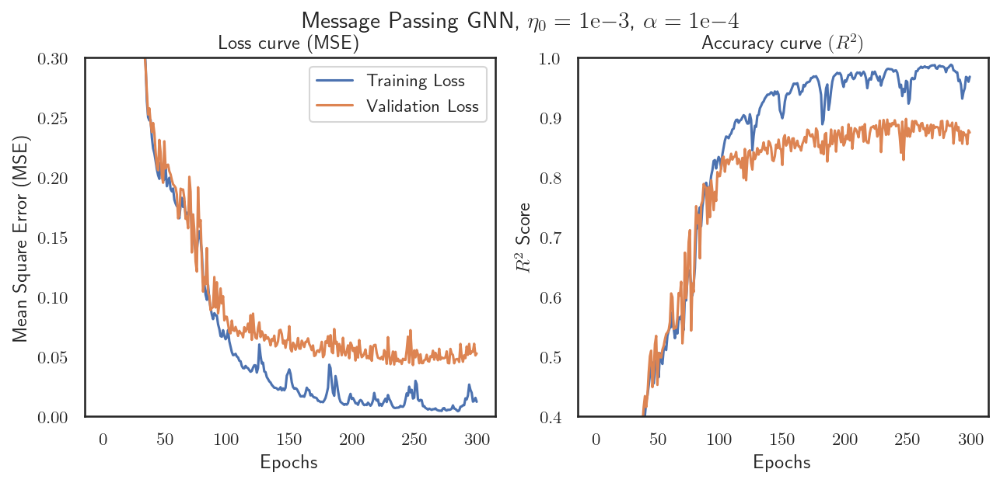

In [ ]:
plot_loss_curves(gnn_results, title)

In [ ]:
gnn_results.sort_values(by='valid_loss')[:10]

,epoch,train_loss,train_metric,valid_loss,valid_metric,stop_count
248,248,0.015057,"tensor(0.9615, device='cuda:0')",0.043053,"tensor(0.8979, device='cuda:0')",0
233,233,0.007251,"tensor(0.9814, device='cuda:0')",0.043498,"tensor(0.8966, device='cuda:0')",0
230,230,0.012940,"tensor(0.9669, device='cuda:0')",0.043790,"tensor(0.8960, device='cuda:0')",0
239,239,0.008309,"tensor(0.9786, device='cuda:0')",0.044011,"tensor(0.8956, device='cuda:0')",0
227,227,0.012144,"tensor(0.9689, device='cuda:0')",0.044105,"tensor(0.8951, device='cuda:0')",0
277,277,0.005584,"tensor(0.9857, device='cuda:0')",0.044502,"tensor(0.8945, device='cuda:0')",0
281,281,0.006757,"tensor(0.9827, device='cuda:0')",0.044540,"tensor(0.8943, device='cuda:0')",0
253,253,0.013048,"tensor(0.9664, device='cuda:0')",0.044572,"tensor(0.8943, device='cuda:0')",0
256,256,0.008682,"tensor(0.9778, device='cuda:0')",0.044697,"tensor(0.8939, device='cuda:0')",0
255,255,0.013657,"tensor(0.9650, device='cuda:0')",0.044707,"tensor(0.8942, device='cuda:0')",0


In [ ]:
model = torch.load(hyperparameters['model_path'] / 'epoch_298.pth').to(device)

In [ ]:
title += ', Epoch 298'

<ipython-input-63-8c4b7ae23feb>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


{'MSE': 0.0397, 'MAE': 0.134, 'RMSE': 0.199, 'MAPE': 0.012, 'R^2': 0.906}

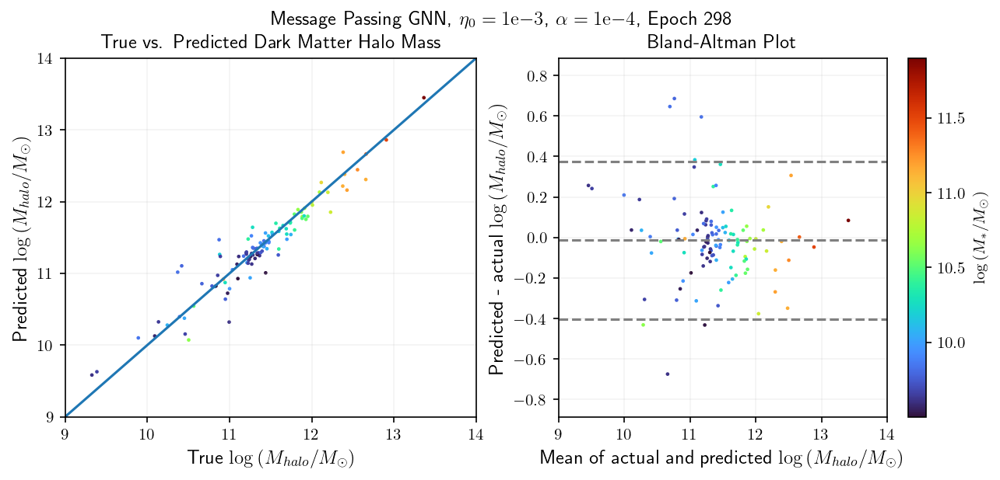

In [ ]:
plot_gnn_predictions(model, df_valid, data.subgraph(valid_indices), title)

## GNN + CNN

### Model Definition

In [ ]:
class ResNetGraph(nn.Module):
  def __init__(self, preprocess_params):
    super(ResNetGraph, self).__init__()

    # BEGIN CNN
    self.img_path = Path('./homogenized_data')
    resnet_out = 32 # Might need to lower
    weights = ResNet18_Weights.DEFAULT
    self.cnn_backbone = resnet18(weights=weights)
    n_inputs = self.cnn_backbone.fc.in_features # 512 for ResNet18
    self.cnn_backbone.fc = nn.Sequential(
        nn.Linear(n_inputs, resnet_out)
    )

    self.backbone_transform = weights.transforms()
    self.backbone_transform.mean = preprocess_params['mean'] or self.backbone_transform.mean
    self.backbone_transform.std = preprocess_params['std'] or self.backbone_transform.std
    self.preprocessing = preprocess_params['preprocessing'] or nn.Identity()

    for param in self.cnn_backbone.parameters():
      param.requires_grad=False
    # END CNN

    # BEGIN GNN
    node_features=1
    edge_features=1
    hidden_channels=16
    aggr=["max", "sum"]
    latent_channels=16
    n_layers=4
    n_out=1
    n_unshared_layers=4
    n_pool = (len(aggr) if isinstance(aggr, list) else 1)

    self.gnn_in = 2 * node_features + edge_features
    self.gnn_out = n_out

    layers = [
      nn.ModuleList([
          EdgeInteractionLayer(self.gnn_in, hidden_channels, latent_channels, aggr=aggr)
          for _ in range(n_unshared_layers)
      ])
    ]
    for _ in range(n_layers-1):
      layers += [
        nn.ModuleList([
          EdgeInteractionLayer(2 * latent_channels * n_unshared_layers * n_pool + node_features, hidden_channels, latent_channels, aggr=aggr)
          for _ in range(n_unshared_layers)
        ])
      ]
    self.gnn_layers = nn.ModuleList(layers)

    self.gnn_fc = nn.Sequential(
        nn.Linear((n_unshared_layers * n_pool) * latent_channels, latent_channels),
        nn.LayerNorm(latent_channels),
        nn.ReLU(),
        nn.Linear(latent_channels, latent_channels),
        nn.LayerNorm(latent_channels),
        nn.ReLU(),
        nn.Linear(latent_channels, latent_channels)
    )

    self.D_link = D_link
    self.h = 0.
    # END GNN

    # BEGIN COMBINE NET
    self.combine_net = nn.Sequential(
        nn.Linear(latent_channels + node_features + resnet_out, latent_channels),
        nn.LayerNorm(latent_channels),
        nn.ReLU(),
        nn.Linear(latent_channels, latent_channels),
        nn.LayerNorm(latent_channels),
        nn.ReLU(),
        nn.Linear(latent_channels, n_out)
    )
    # END COMBINE NET

  def train_all(self):
    for param in self.cnn_backbone.parameters():
      param.requires_grad=True
    for param in self.gnn_layers.parameters():
      param.requires_grad=True

  def stop_gnn(self):
    for param in self.gnn_layers.parameters():
      param.requires_grad=False

  def forward(self, data):
    # BEGIN GNN
    edge_index = data.edge_index
    edge_attr = data.edge_attr

    # update hidden state on edge (h, or sometimes e_ij in the text)
    h = torch.cat([unshared_layer(data.x, edge_index=edge_index, edge_attr=edge_attr) for unshared_layer in self.gnn_layers[0]], axis=1)
    self.h = h
    h = h.relu()

    for layer in self.gnn_layers[1:]:
      # if more than 1 layer, then also use a skip connection
      h = self.h + torch.cat([unshared_layer(h, edge_index=edge_index, edge_attr=edge_attr) for unshared_layer in layer], axis=1)

      self.h = h
      h = h.relu()

    gnn_out = self.gnn_fc(h)
    # END GNN

    # BEGIN CNN
    imgs = _to_torch(np.asarray([np.load(self.img_path / f'{idx.item()}.npy') for idx in data.idx]))
    if torch.is_grad_enabled():
      imgs = transforms(imgs) # hack solution to only augment on training
    imgs = self.backbone_transform(self.preprocessing(imgs))
    cnn_out = self.cnn_backbone(imgs)
    # END CNN


    x = torch.concat([gnn_out, data.x, cnn_out], axis=1) # latent channels + data.x + ResNet output

    return (self.combine_net(x))

In [ ]:
class PreTrainedCombNN(nn.Module):
  def __init__(self, preprocess_params, gnn_backbone):
    super(PreTrainedCombNN, self).__init__()

    # BEGIN CNN
    self.img_path = Path('./homogenized_data')
    resnet_out = 32 # Might need to lower
    weights = ResNet18_Weights.DEFAULT
    self.cnn_backbone = resnet18(weights=weights)
    n_inputs = self.cnn_backbone.fc.in_features # 512 for ResNet18
    self.cnn_backbone.fc = nn.Sequential(
        nn.Linear(n_inputs, resnet_out)
    )

    self.backbone_transform = weights.transforms()
    self.backbone_transform.mean = preprocess_params['mean'] or self.backbone_transform.mean
    self.backbone_transform.std = preprocess_params['std'] or self.backbone_transform.std
    self.preprocessing = preprocess_params['preprocessing'] or nn.Identity()

    for param in self.cnn_backbone.parameters():
      param.requires_grad=False
    # END CNN

    # BEGIN GNN - likely these parameters aren't necessary
    node_features=1
    edge_features=1
    hidden_channels=16
    aggr="max"
    latent_channels=16
    n_layers=4
    n_out=1
    n_unshared_layers=4
    n_pool = (len(aggr) if isinstance(aggr, list) else 1)

    self.gnn_layers = deepcopy(gnn_backbone.layers)

    self.gnn_fc = deepcopy(gnn_backbone.fc)

    self.D_link = D_link
    self.h = 0.
    self.stop_gnn()
    # END GNN

    # BEGIN COMBINE NET
    self.combine_net = nn.Sequential(
        nn.Linear(latent_channels + node_features + resnet_out, latent_channels),
        nn.LayerNorm(latent_channels),
        nn.ReLU(),
        nn.Linear(latent_channels, latent_channels),
        nn.LayerNorm(latent_channels),
        nn.ReLU(),
        nn.Linear(latent_channels, n_out)
    )
    # END COMBINE NET

  def train_all(self):
    for param in self.cnn_backbone.parameters():
      param.requires_grad=True
    for param in self.gnn_layers.parameters():
      param.requires_grad=True
    for param in self.gnn_fc.parameters():
      param.requires_grad=True

  def stop_gnn(self):
    for param in self.gnn_layers.parameters():
      param.requires_grad=False
    for param in self.gnn_fc.parameters():
      param.requires_grad=False

  def forward(self, data):
    # BEGIN GNN
    edge_index = data.edge_index
    edge_attr = data.edge_attr

    # update hidden state on edge (h, or sometimes e_ij in the text)
    h = torch.cat([unshared_layer(data.x, edge_index=edge_index, edge_attr=edge_attr) for unshared_layer in self.gnn_layers[0]], axis=1)
    self.h = h
    h = h.relu()

    for layer in self.gnn_layers[1:]:
      # if more than 1 layer, then also use a skip connection
      h = self.h + torch.cat([unshared_layer(h, edge_index=edge_index, edge_attr=edge_attr) for unshared_layer in layer], axis=1)

      self.h = h
      h = h.relu()

    gnn_out = self.gnn_fc(h)
    # END GNN

    # BEGIN CNN
    imgs = _to_torch(np.asarray([np.load(self.img_path / f'{idx.item()}.npy') for idx in data.idx]))
    if torch.is_grad_enabled():
      imgs = transforms(imgs) # hack solution to only augment on training
    imgs = self.backbone_transform(self.preprocessing(imgs))
    cnn_out = self.cnn_backbone(imgs)
    # END CNN


    x = torch.concat([gnn_out, data.x, cnn_out], axis=1) # latent channels + data.x + ResNet output

    return (self.combine_net(x))

### Model Training
Preprocess_params defined in CNN, uses pretrained gnn backbone

In [ ]:
# model = ResNetGraph(preprocess_params).to(device)
model = PreTrainedCombNN(preproccess_params, gnn_model).to(device)

model_name = 'com_nn_lr5e-4_lrd1e-4_bs64_mp_nl'
hyperparameters = {
    'lr': 5e-4,
    'weight_decay': 1e-4,
    'batch_size': 64,
    'epochs': 600,
    'model_path': Path(model_name),
    'loss_fn': nn.MSELoss(),
    'metric_fn': R2Score()
}


train_indices = torch.tensor(train_mask.values).nonzero(as_tuple=True)[0]
valid_indices = torch.tensor(valid_mask.values).nonzero(as_tuple=True)[0]
test_indices = torch.tensor(test_mask.values).nonzero(as_tuple=True)[0]
assert (set(train_indices) & set(valid_indices) & set(test_indices)) == set()


train_data = ClusterData(
    data.subgraph(train_indices),
    num_parts= 24,
    recursive=False,
    log=False
)
train_dataloader = ClusterLoader(
    train_data,
    shuffle=True,
    batch_size=1
)
valid_data = ClusterData(
    data.subgraph(valid_indices),
    num_parts=2,
    recursive=False,
    log=False
)
valid_dataloader = ClusterLoader(
    valid_data,
    shuffle=False,
    batch_size=1
)

gnn_results = train_nn(model, train_dataloader, valid_dataloader, hyperparameters)
gnn_results.to_pickle(hyperparameters['model_path'] / 'results.pk1')

NameError: name 'preproccess_params' is not defined

### Model results

In [ ]:
title = r'Combined NN, $\eta_0=5\mathrm{e}{-4}$, $\alpha=1\mathrm{e}{-4}$'

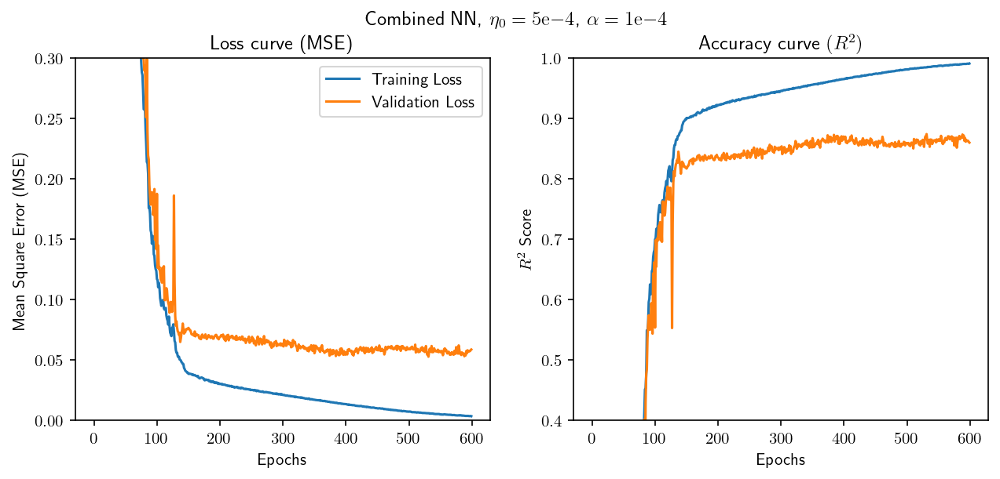

In [ ]:
plot_loss_curves(gnn_results, title)

In [ ]:
gnn_results[gnn_results['stop_count'] > 0][:10]

,epoch,train_loss,train_metric,valid_loss,valid_metric,stop_count
126,126,0.079542,"tensor(0.7961, device='cuda:0')",0.097532,"tensor(0.7673, device='cuda:0')",1
143,143,0.043437,"tensor(0.8885, device='cuda:0')",0.071886,"tensor(0.8285, device='cuda:0')",2
316,316,0.019823,"tensor(0.9489, device='cuda:0')",0.066520,"tensor(0.8414, device='cuda:0')",3
405,405,0.012776,"tensor(0.9670, device='cuda:0')",0.058994,"tensor(0.8592, device='cuda:0')",4
424,424,0.011907,"tensor(0.9693, device='cuda:0')",0.059995,"tensor(0.8569, device='cuda:0')",5
468,468,0.008898,"tensor(0.9770, device='cuda:0')",0.060981,"tensor(0.8545, device='cuda:0')",6
541,541,0.005301,"tensor(0.9863, device='cuda:0')",0.058236,"tensor(0.8610, device='cuda:0')",7


In [ ]:
gnn_results[:600].sort_values(by='valid_loss')[:10]

,epoch,train_loss,train_metric,valid_loss,valid_metric,stop_count
531,531,0.005861,"tensor(0.9849, device='cuda:0')",0.052720,"tensor(0.8742, device='cuda:0')",0
588,588,0.003766,"tensor(0.9903, device='cuda:0')",0.053084,"tensor(0.8735, device='cuda:0')",0
384,384,0.014450,"tensor(0.9627, device='cuda:0')",0.053259,"tensor(0.8729, device='cuda:0')",0
374,374,0.015420,"tensor(0.9602, device='cuda:0')",0.053574,"tensor(0.8722, device='cuda:0')",0
412,412,0.012533,"tensor(0.9677, device='cuda:0')",0.053717,"tensor(0.8719, device='cuda:0')",0
590,590,0.003663,"tensor(0.9905, device='cuda:0')",0.053786,"tensor(0.8719, device='cuda:0')",0
554,554,0.004772,"tensor(0.9877, device='cuda:0')",0.053971,"tensor(0.8713, device='cuda:0')",0
389,389,0.014142,"tensor(0.9635, device='cuda:0')",0.053974,"tensor(0.8712, device='cuda:0')",0
583,583,0.003981,"tensor(0.9897, device='cuda:0')",0.054125,"tensor(0.8710, device='cuda:0')",0
390,390,0.014089,"tensor(0.9637, device='cuda:0')",0.054174,"tensor(0.8707, device='cuda:0')",0


In [ ]:
model = torch.load(hyperparameters['model_path'] / 'epoch_531.pth').to(device)

In [ ]:
title += ', Epoch 531'

<ipython-input-63-8c4b7ae23feb>:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mpl.cm.ScalarMappable(norm, cmap), label=r'$\log\left(M_* / M_\odot\right)$')


{'MSE': 0.053, 'MAE': 0.161, 'RMSE': 0.23, 'MAPE': 0.0141, 'R^2': 0.874}

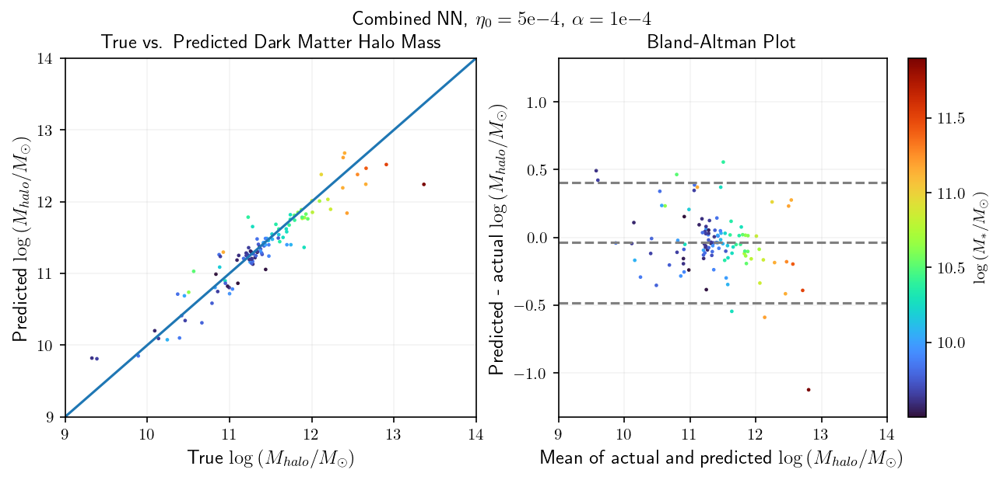

In [ ]:
plot_gnn_predictions(model, df_valid, data.subgraph(valid_indices), title)

# Testing

## Baseline Models

<ipython-input-62-d67ef19bf6e8>:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  col_fig.tight_layout()


{'MSE': 0.207,
 'MAE': 0.328,
 'RMSE': 0.455,
 'MAPE': 0.0298,
 'R^2': 0.524,
 'Bias': 0.0094,
 'NMAD': 0.313,
 'OF': 0.244}

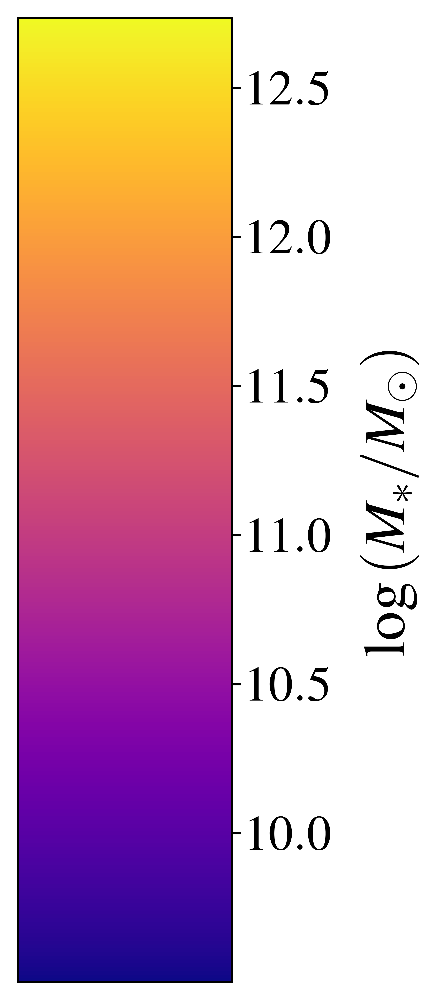

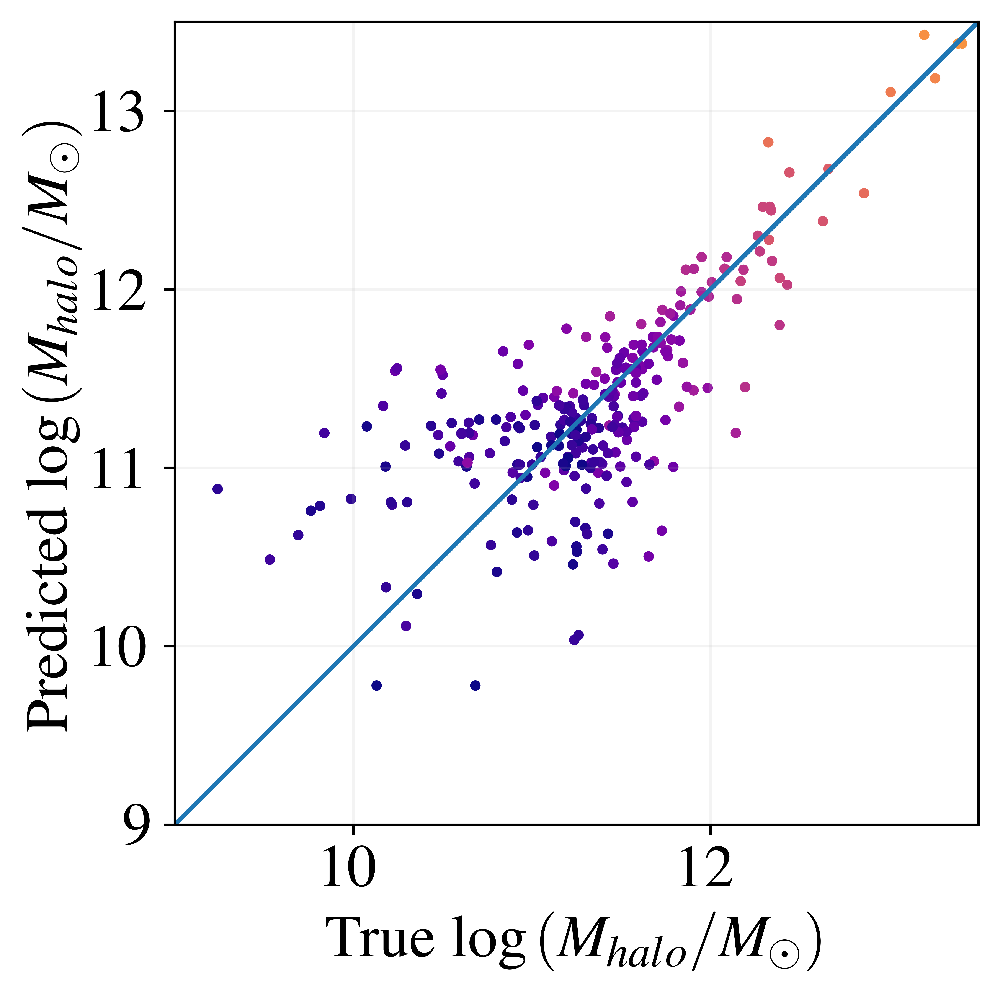

In [ ]:
X_cols = ['logstellarmass']
create_test_metrics(simple_baseline, df_test, X_cols, 'loghalomass')

<ipython-input-62-d67ef19bf6e8>:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  col_fig.tight_layout()


{'MSE': 0.119,
 'MAE': 0.246,
 'RMSE': 0.345,
 'MAPE': 0.0223,
 'R^2': 0.726,
 'Bias': -0.0234,
 'NMAD': 0.234,
 'OF': 0.374}

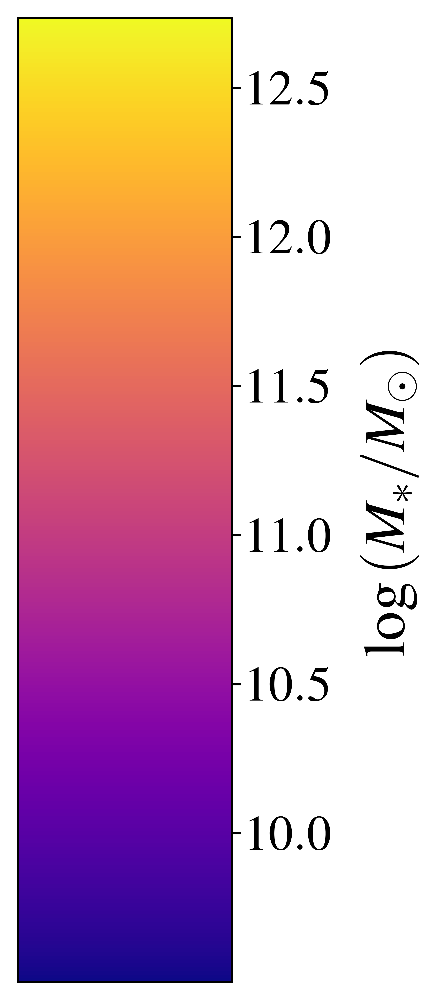

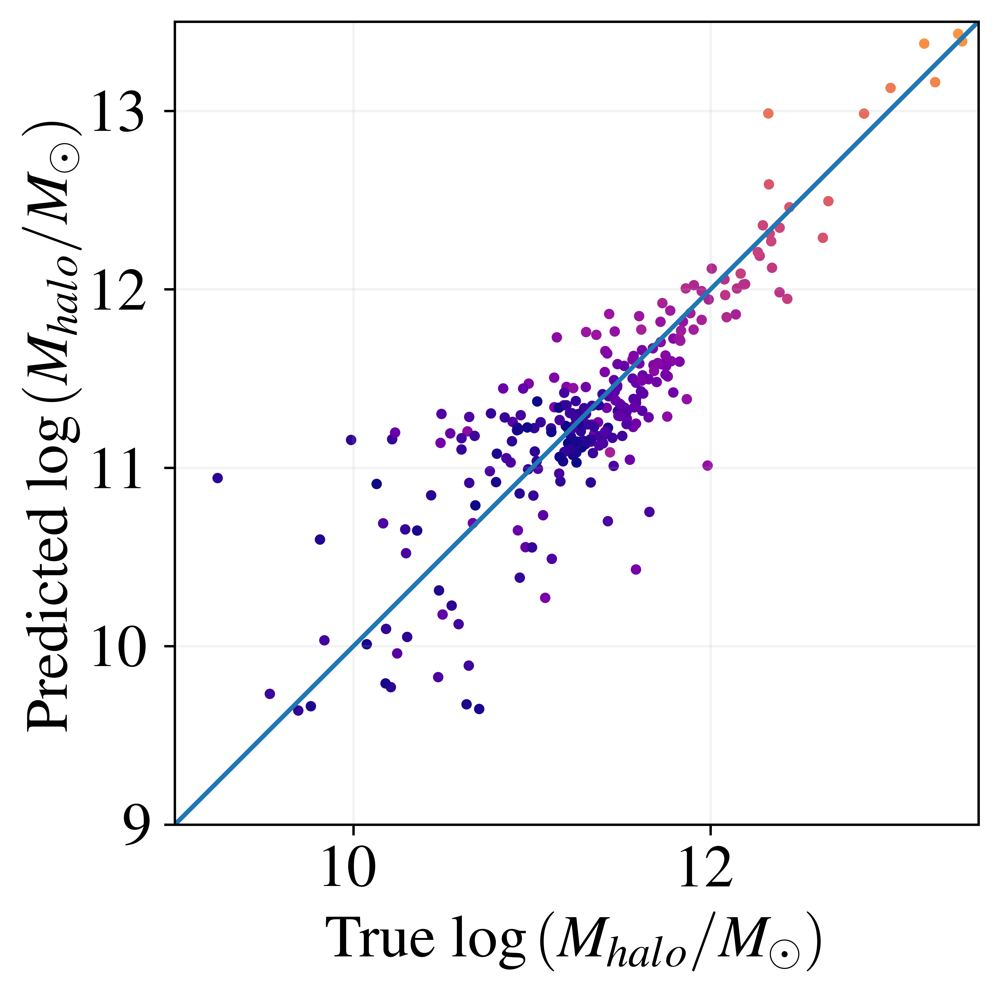

In [ ]:
X_cols=['logstellarmass', 'asymmetry', 'smoothness', 'rpetro_ellip']
create_test_metrics(morph_baseline, df_test, X_cols, 'loghalomass')

<ipython-input-62-d67ef19bf6e8>:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  col_fig.tight_layout()


{'MSE': 0.14,
 'MAE': 0.26,
 'RMSE': 0.374,
 'MAPE': 0.0238,
 'R^2': 0.68,
 'Bias': -0.00807,
 'NMAD': 0.261,
 'OF': 0.322}

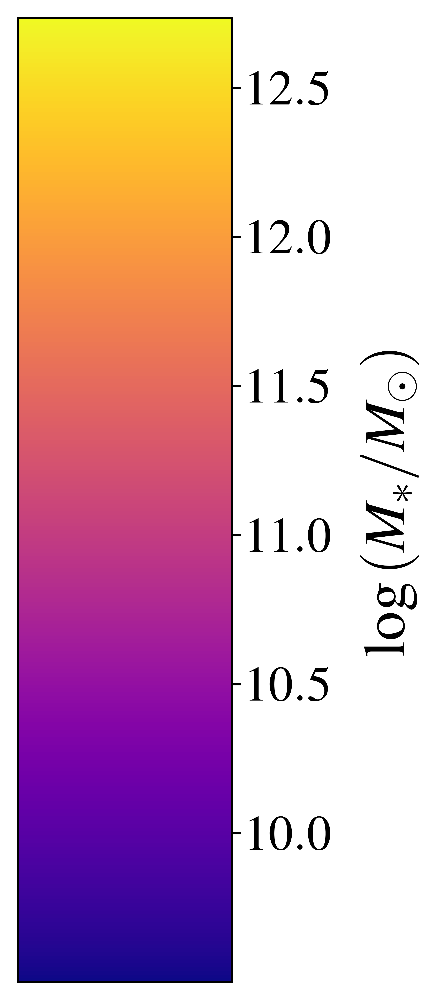

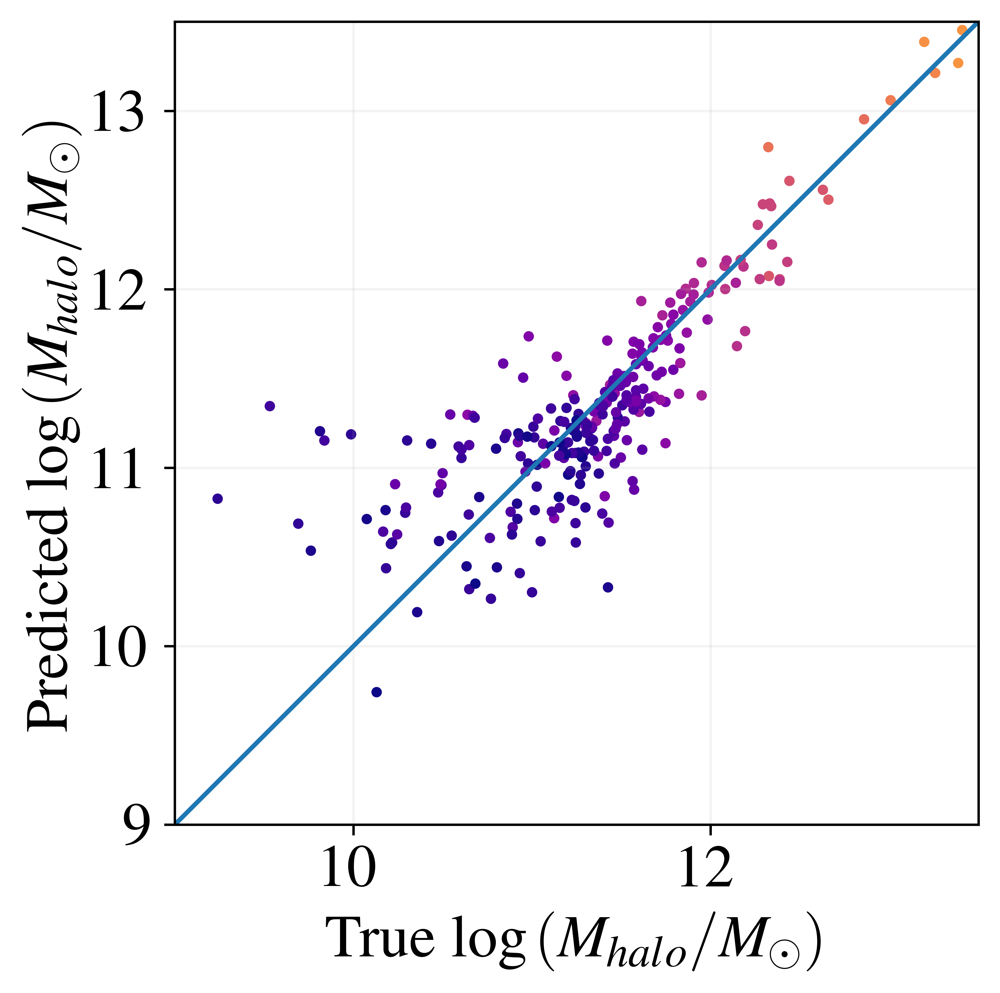

In [ ]:
X_cols=['logstellarmass', 'overdensity']
create_test_metrics(spat_baseline, df_test, X_cols, 'loghalomass')

<ipython-input-62-d67ef19bf6e8>:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  col_fig.tight_layout()


{'MSE': 0.0963,
 'MAE': 0.22,
 'RMSE': 0.31,
 'MAPE': 0.0199,
 'R^2': 0.779,
 'Bias': -0.034,
 'NMAD': 0.22,
 'OF': 0.403}

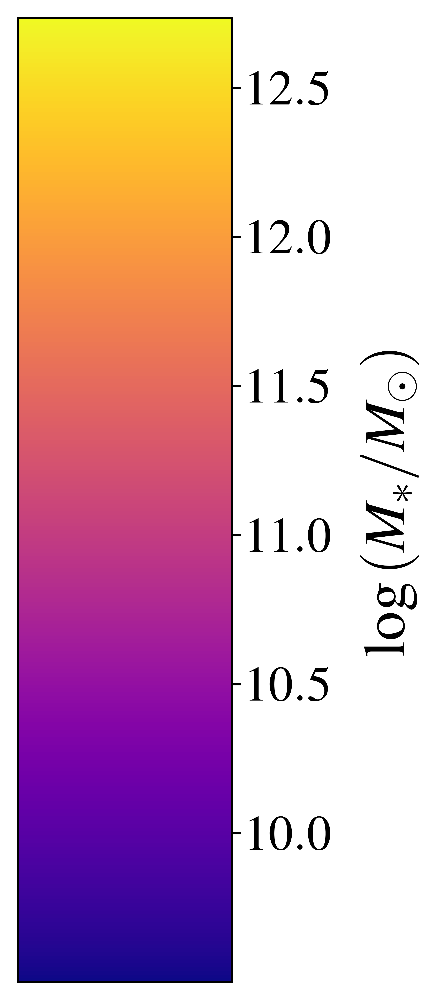

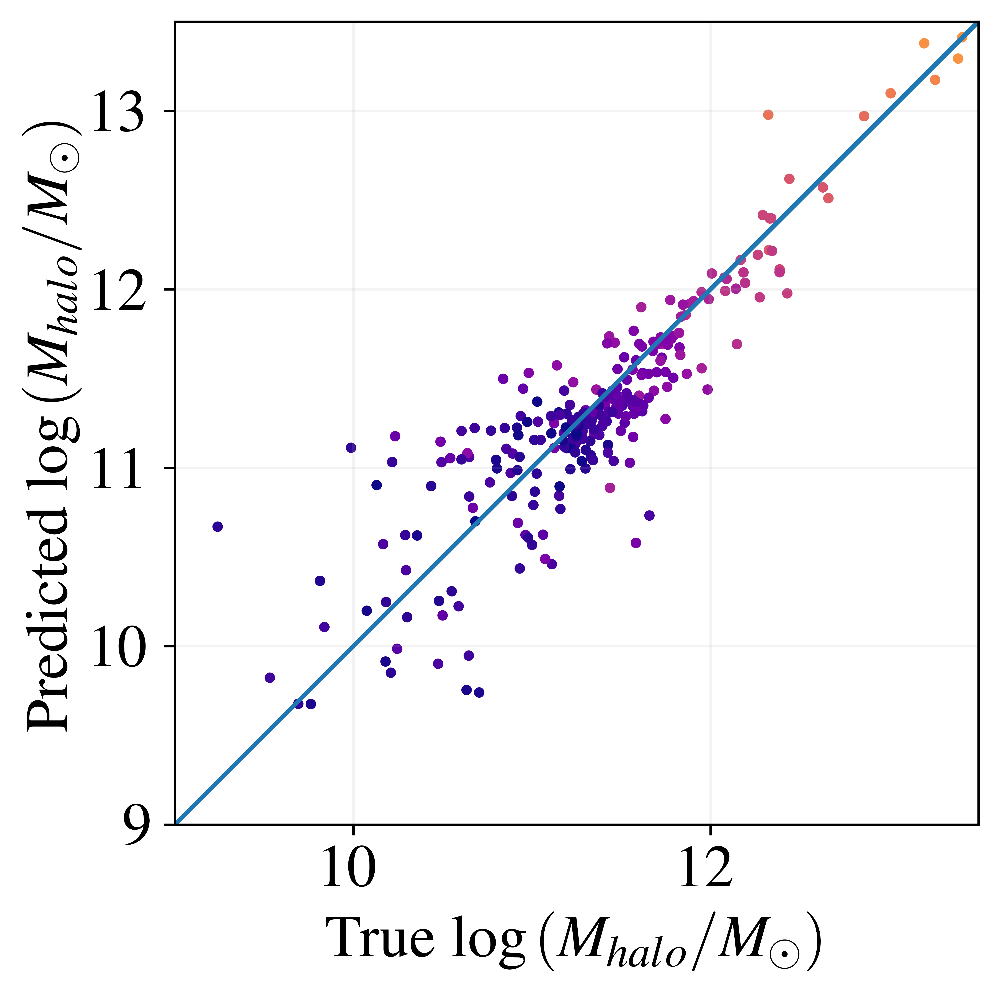

In [ ]:
X_cols=['logstellarmass', 'asymmetry', 'smoothness', 'rpetro_ellip', 'overdensity']
create_test_metrics(comb_baseline, df_test, X_cols, 'loghalomass')

## NN Models

<ipython-input-62-d67ef19bf6e8>:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  col_fig.tight_layout()


{'MSE': 0.129,
 'MAE': 0.238,
 'RMSE': 0.359,
 'MAPE': 0.0212,
 'R^2': 0.705,
 'Bias': 0.0624,
 'NMAD': 0.218,
 'OF': 0.0618}

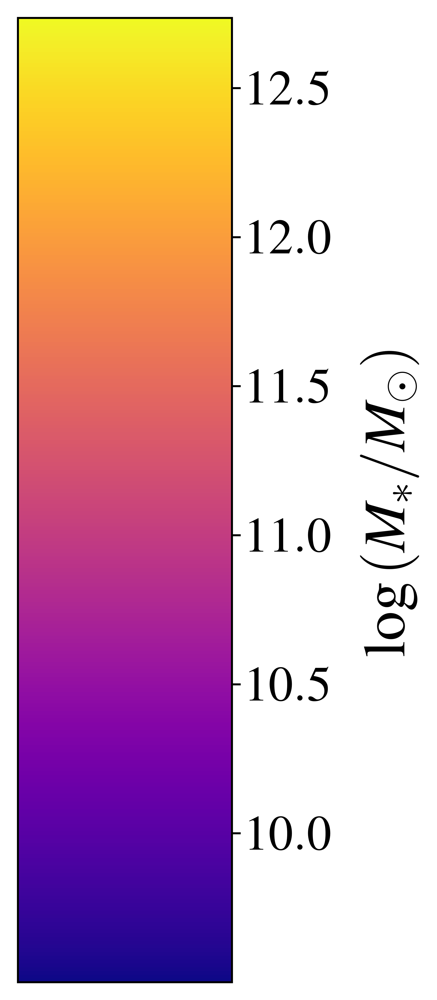

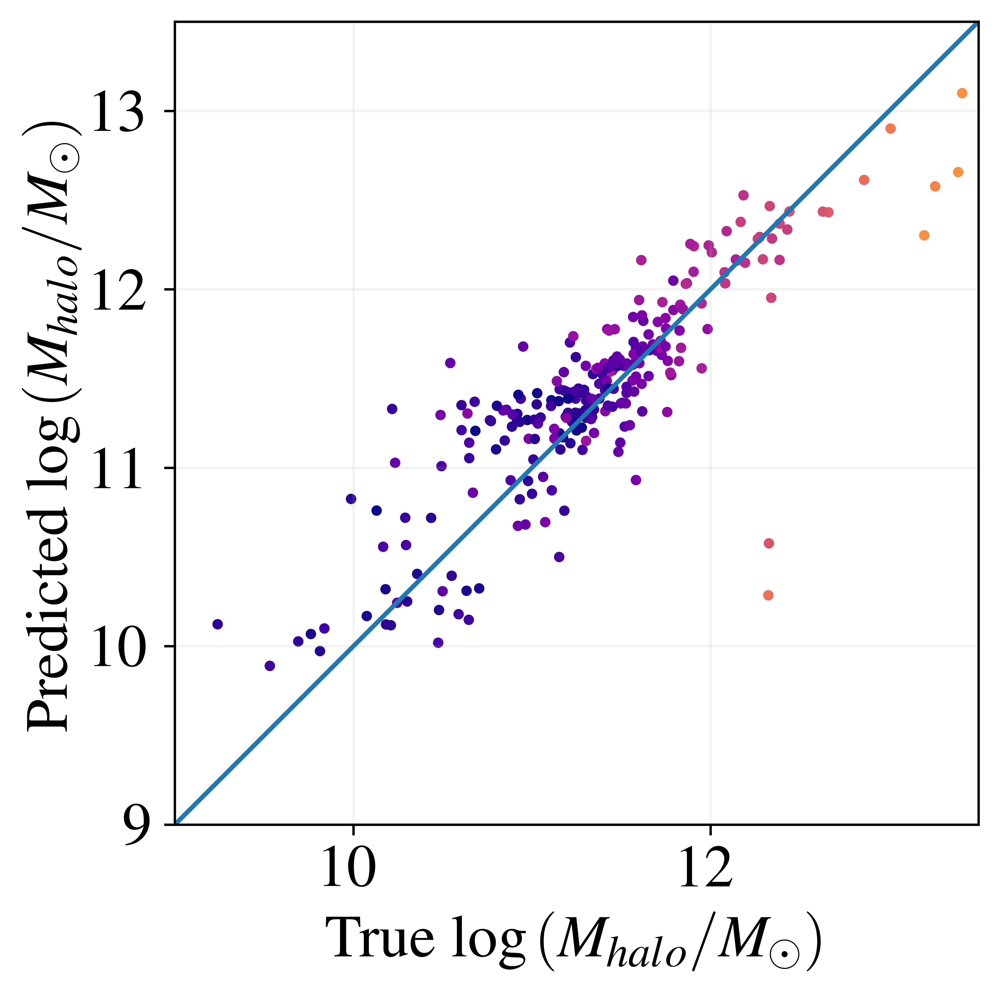

In [ ]:
cnn_model = torch.load('adamw_epoch116.pth')
test_dataset = ImageDataset(root="./homogenized_data", img_labels=df_test)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=True)
plot_nn_predictions(cnn_model, df_test, test_dataloader, test=True)

<ipython-input-62-d67ef19bf6e8>:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  col_fig.tight_layout()


{'MSE': 0.0617,
 'MAE': 0.158,
 'RMSE': 0.248,
 'MAPE': 0.0144,
 'R^2': 0.858,
 'Bias': 0.00682,
 'NMAD': 0.146,
 'OF': 0.563}

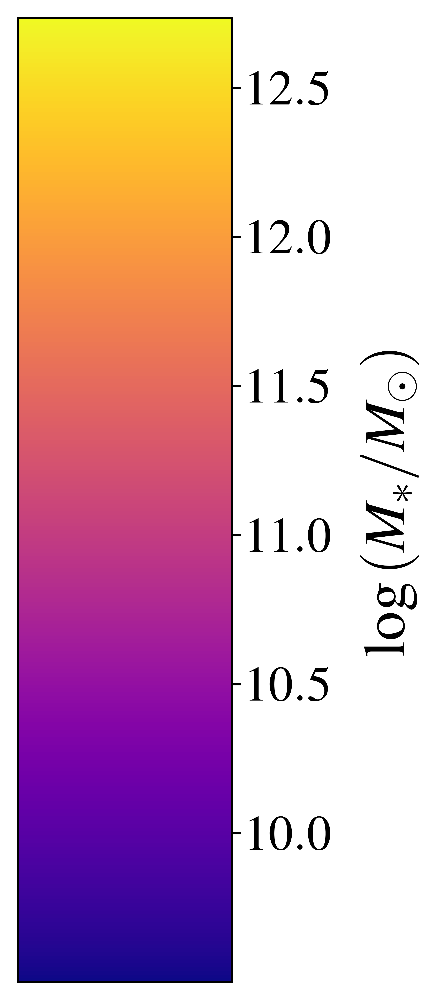

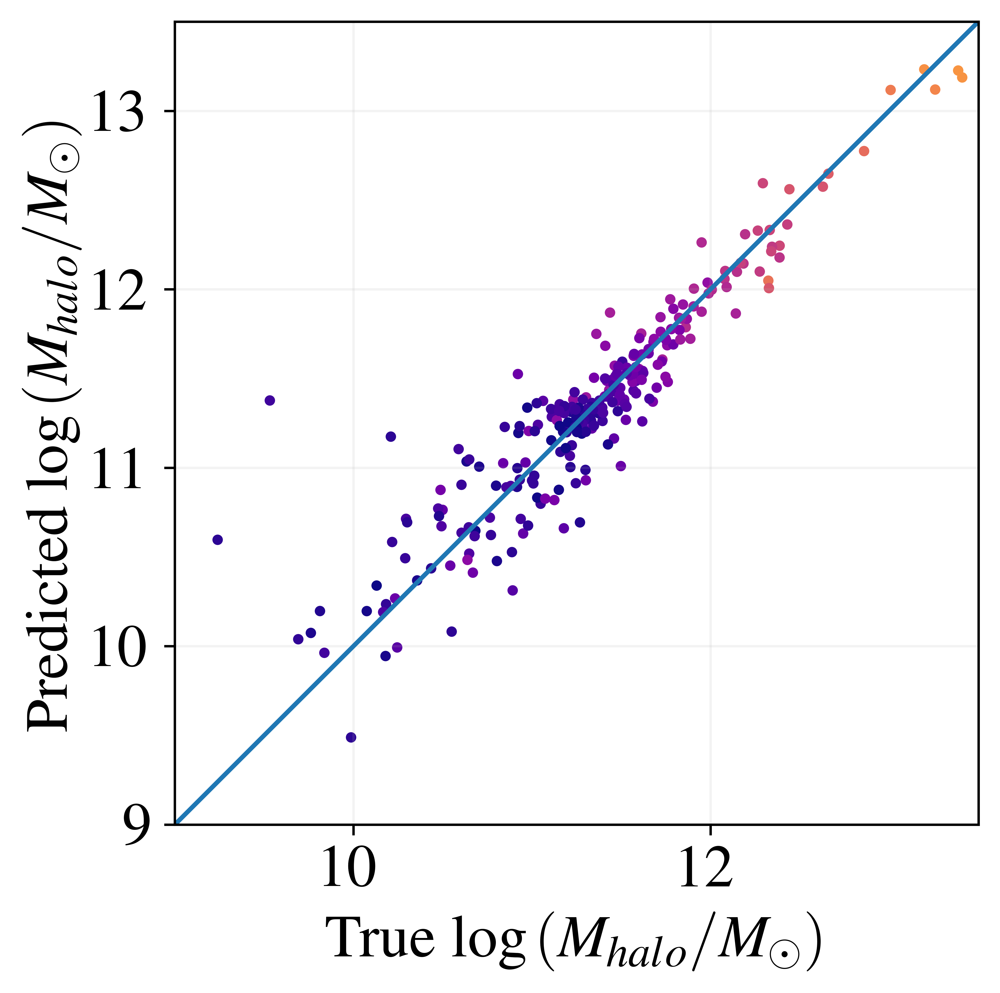

In [ ]:
gnn_model = torch.load('gnn_epoch_416.pth')
plot_gnn_predictions(gnn_model, df_test, data.subgraph(test_indices), test=True)

<ipython-input-62-d67ef19bf6e8>:112: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  col_fig.tight_layout()


{'MSE': 0.0616,
 'MAE': 0.144,
 'RMSE': 0.248,
 'MAPE': 0.013,
 'R^2': 0.859,
 'Bias': 0.0196,
 'NMAD': 0.123,
 'OF': 0.612}

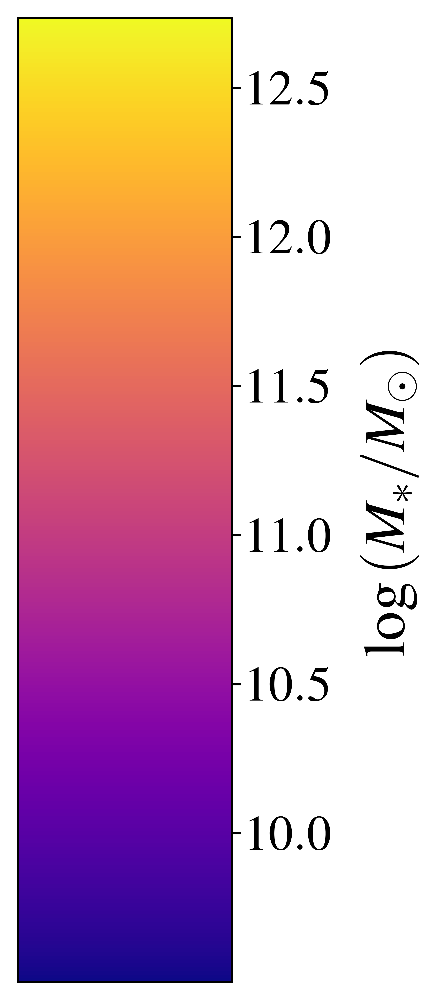

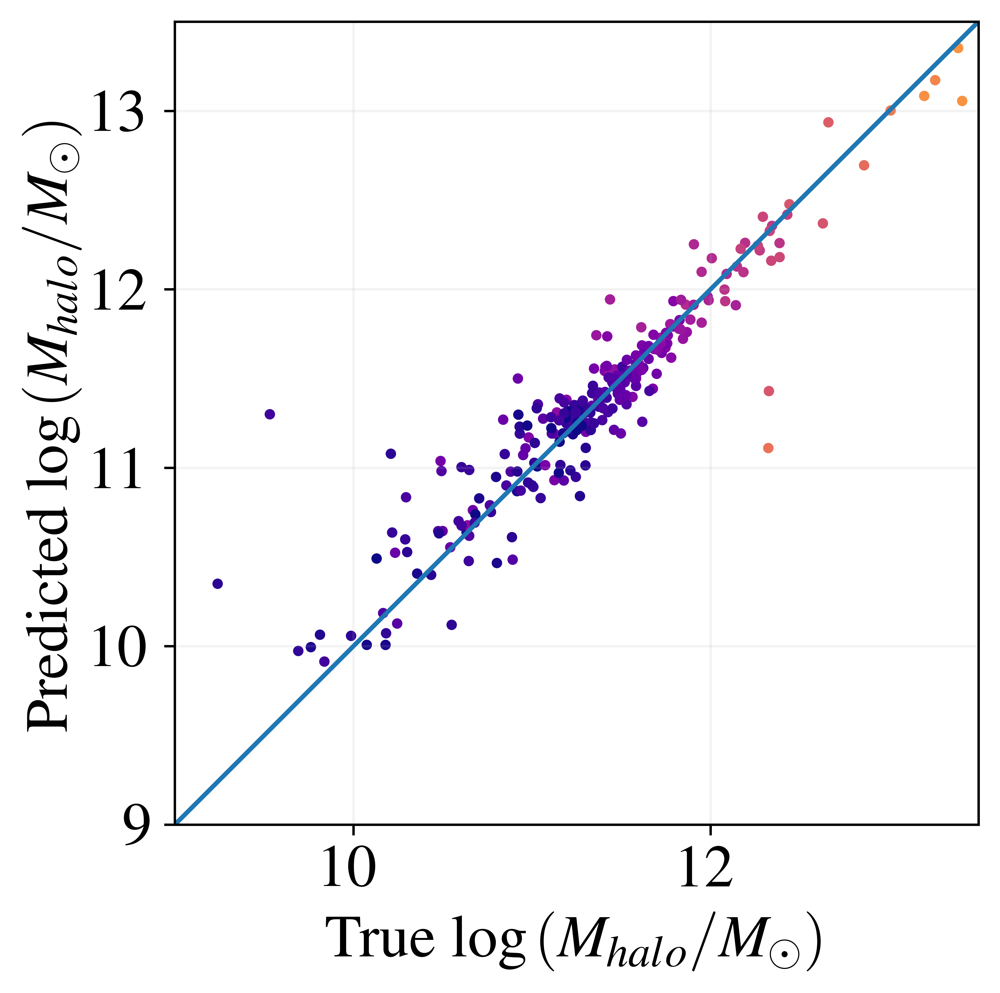

In [ ]:
comb_model = torch.load('comb_nn_epoch_466.pth')
plot_gnn_predictions(comb_model, df_test, data.subgraph(test_indices), test=True)

## Loss Curves

In [ ]:
file_name = 'AdamW_lr5e-4_lrd01_fullrot_results'
cnn_results = pd.read_pickle(f'{file_name}.pk1')
plot_loss_curves(cnn_results, None, testing=True)

Output hidden; open in https://colab.research.google.com to view.

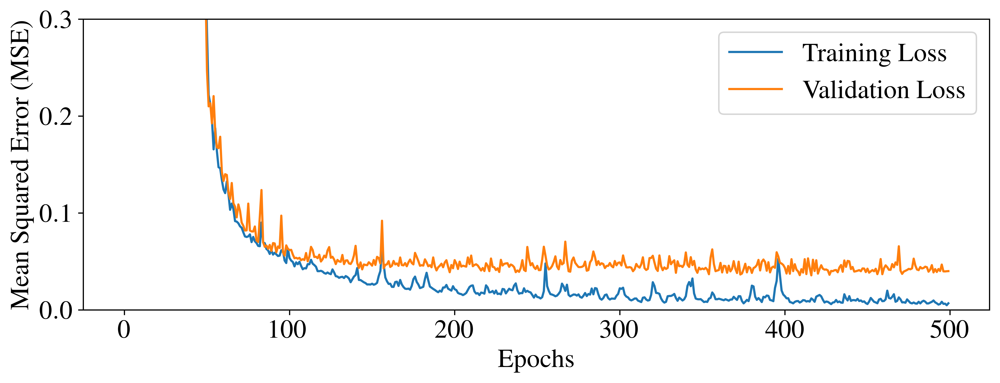

In [ ]:
file_name = 'gnn_results'
gnn_results = pd.read_pickle(f'{file_name}.pk1')
plot_loss_curves(gnn_results, None, testing=True)

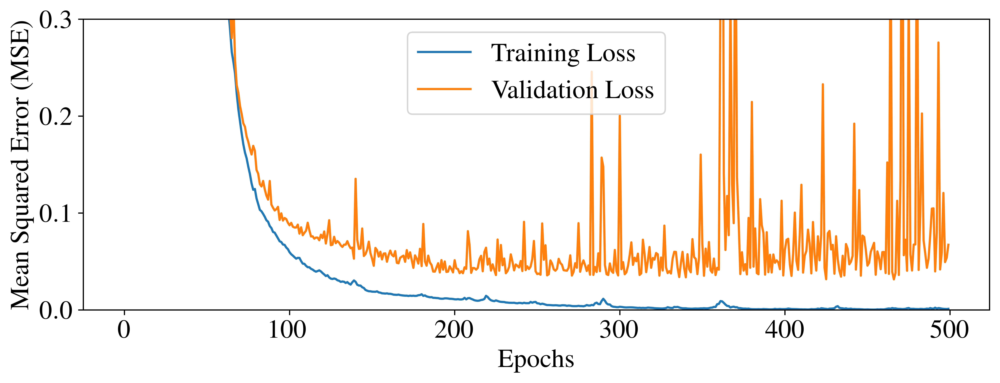

In [ ]:
file_name = 'comb_nn_'
cnn_results = pd.read_pickle(f'{file_name}.pk1')
plot_loss_curves(cnn_results, None, testing=True)